In [ ]:
# Copyright (C) 2024  Jose Ángel Pérez Garrido
# 
# This program is free software: you can redistribute it and/or modify
# it under the terms of the GNU General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

# This program is distributed in the hope that it will be useful,
# but WITHOUT ANY WARRANTY; without even the implied warranty of
# MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
# GNU General Public License for more details.

# You should have received a copy of the GNU General Public License
# along with this program.  If not, see <https://www.gnu.org/licenses/>.

In [228]:
%matplotlib inline

## Introduction

Reflective symmetry, also known as mirror symmetry or line symmetry, refers to a type of symmetry in which one half of an object is an exact mirror image of the other half when divided along a line. This line is called the line of symmetry. In simpler terms, if you could fold the object along the line of symmetry, the two halves would perfectly overlap. This concept is fundamental in the study of shapes and patterns and finds practical applications in fields such as mathematics, art, and engineering.

Examining binary images reveals that numerous objects, whether artificial or natural, exhibit inherent reflection symmetry. However, real-world images seldom possess perfect reflection symmetry. Therefore, it's advantageous to identify approximate reflection symmetry and assess the degree of approximation (see Fig. 1). This estimation of symmetry in shapes finds utility in various applications, such as analyzing the growth conditions of plants or detecting tumors in medical image processing.

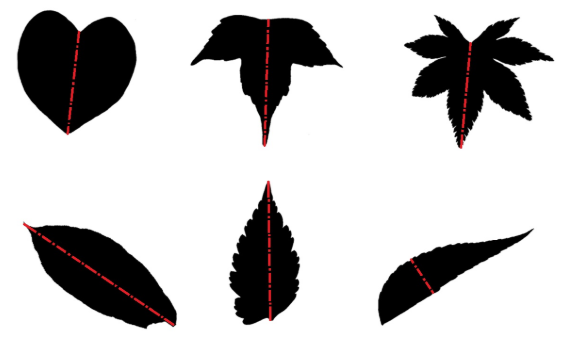

Fig. 1. Examples of more (top) or less (bottom) symmetric shapes [6]

The symmetry axis detection and two-dimensional shape symmetry estimation problems are well known. There are many efficient solutions based on:
1. parametric representation of the shape contour and its Fourier transformation [1]
2. contour representation with rotation [2]
3. representation of the contour by critical points and estimating the similarity measure for two sub-boundaries using geodesic distance vectors [3]
4. the electric charge distribution model (ECDS) [4]
5. the contour-skeleton function (BSF) [5]
6. pairwise comparison of skeletal primitive subchains [6]
7. building the Fourier descriptor of the image contour [7]
8. building image gradient histograms [8]
9. a descriptor built on the Radon transform [9]. 

For this notebook we propose two different implementations:

- The **initial** implementation, referenced in [10], was programmed from **scratch** following the procedure stated in the paper and relied on two innovative methods for detecting reflection symmetry based on shape signatures. These methods, LIP-signature and R-signature, possess advantageous properties that facilitate the efficient detection of reflection symmetry directions. By constructing the merit profile of a shape's signature, potential symmetry directions can be identified. A verification step is then employed to discard false candidates through the examination of Radon projections. These methods demonstrate effectiveness in handling complex shapes, a task that poses difficulties for conventional contour-based approaches.

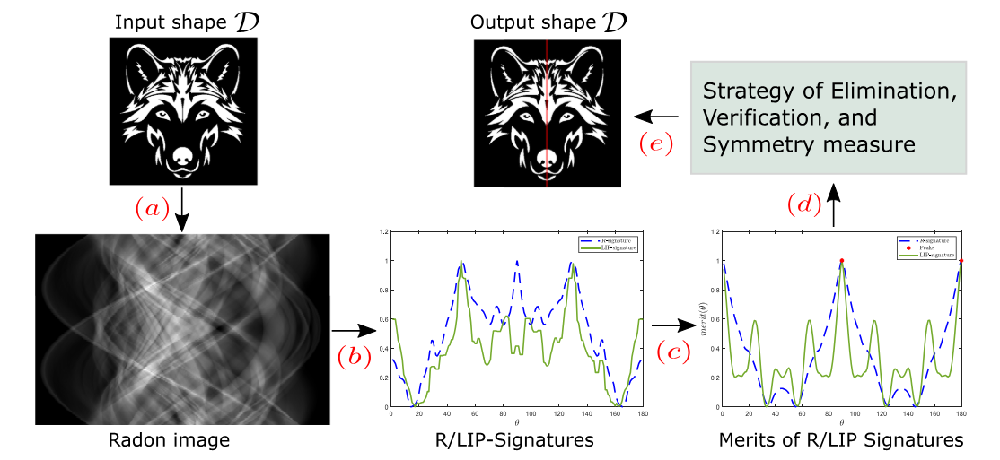

Fig. 2. Main steps (in red) of the shape analysis for reflection symmetry detection: (a) - Computing a Radon profile of D, (b) - Computing R/LIP shape signatures,
(c) - Computing merits of the obtained R/LIP signatures, (d) - Determining which the candidates are the best, (e) - Drawing the detected symmetry axis of D. [10]

### Prepare the environment

In [229]:
from skimage import io
from skimage.morphology import skeletonize
import matplotlib.pyplot as plt
import glob
import cv2 as cv
import numpy as np
import pandas as pd

from scipy.signal import find_peaks
import numpy as np
from scipy.integrate import simps
from scipy.signal import find_peaks
from skimage.transform import radon

### 1. Load images

A subset of 12 binary images was taken from [LIA website](http://lia.esei.uvigo.es/thinning_gallery/) and some others were manually crafted (applying segmentation methods) to carry out the experiments and saved into `./images`. Some of them contain symmetric shapes while some others do not.

./images/alpert_preprocess_SIMPLE_RU.png
(849, 679)


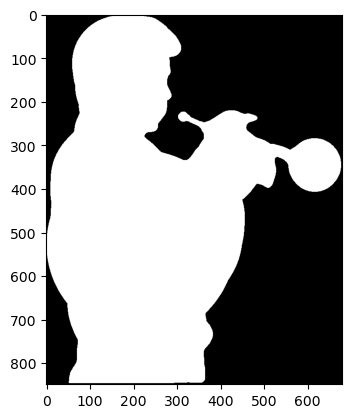

./images/bat_preprocess_SIMPLE_RU.png
(759, 2002)


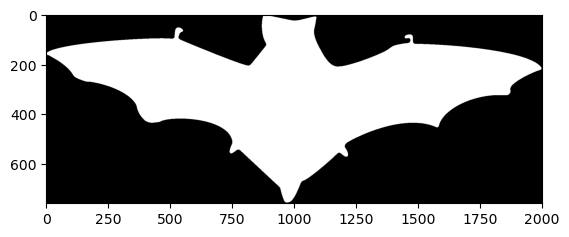

./images/bridge_preprocess_SIMPLE_RU.png
(205, 481)


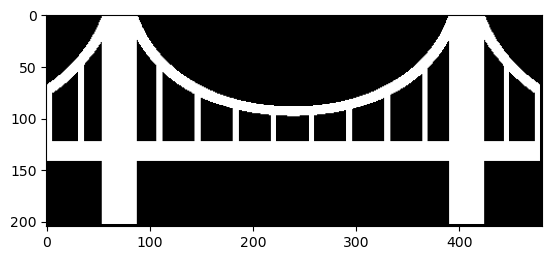

./images/butterfly.png
(413, 612)


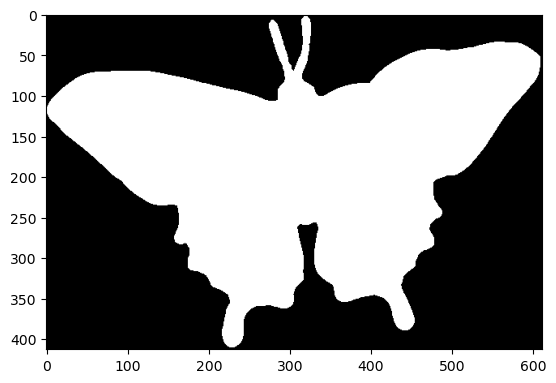

./images/cross_preprocess_SIMPLE_RU.png
(1380, 1340)


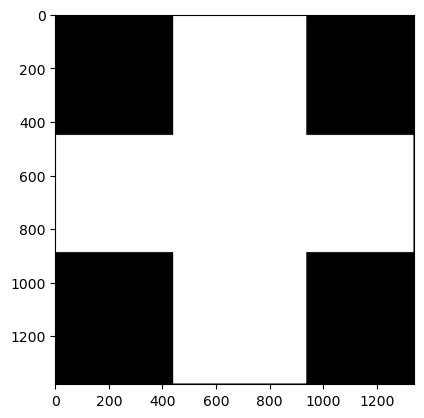

./images/eagle2_preprocess_SIMPLE_RU.png
(720, 604)


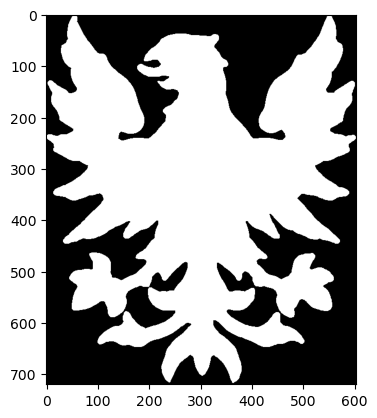

./images/EMDS5-g09-11-GTM.png
(231, 297)


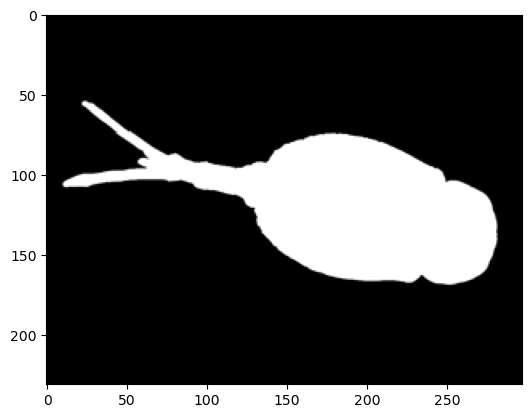

./images/hand_preprocess_SIMPLE_RU.png
(1113, 933)


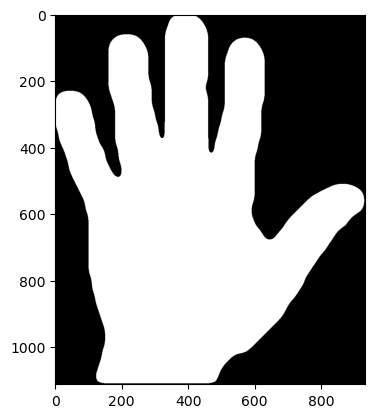

./images/leaf2_preprocess_SIMPLE_RU.png
(678, 609)


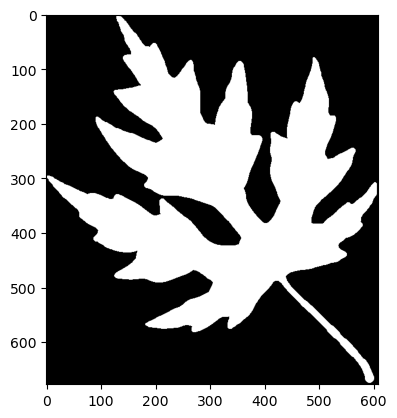

./images/profile_preprocess_SIMPLE_RU.png
(1090, 690)


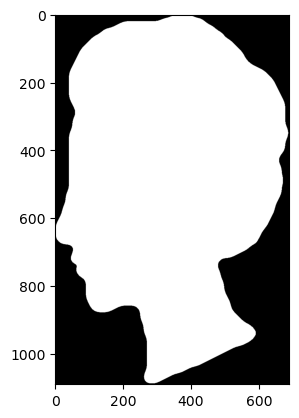

./images/Single_axis_Shape.png
(300, 300)


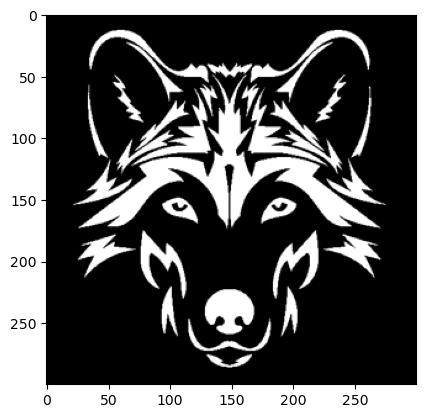

./images/tennisplayer_preprocess_SIMPLE_RU.png
(2052, 1822)


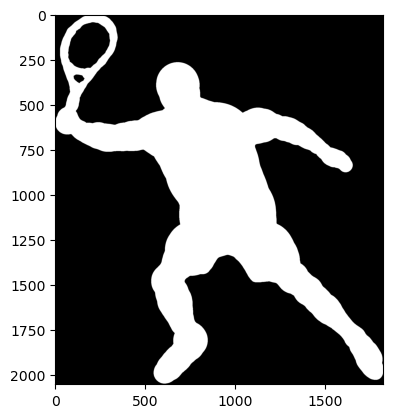

In [230]:
# Load visualize all images
def load_images(folder):
    images_path = glob.glob(folder + '/*.png')
    images = [plt.imread(image) for image in images_path]
    for path,image in zip(images_path,images):
        print(path)
        print(image.shape)
        plt.imshow(image, cmap=plt.cm.gray)
        plt.show()
    return images

images = load_images('./images')

### 2. Generate transformed images (Skeleton)

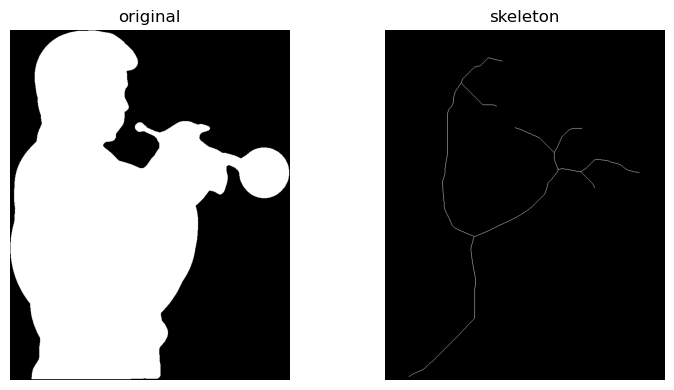

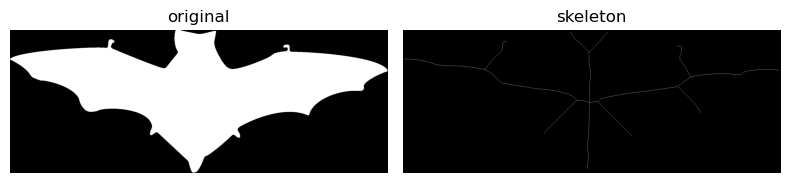

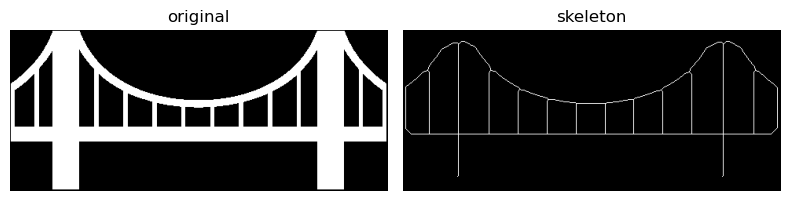

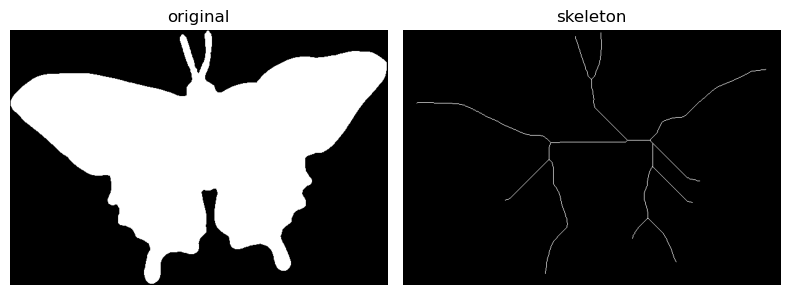

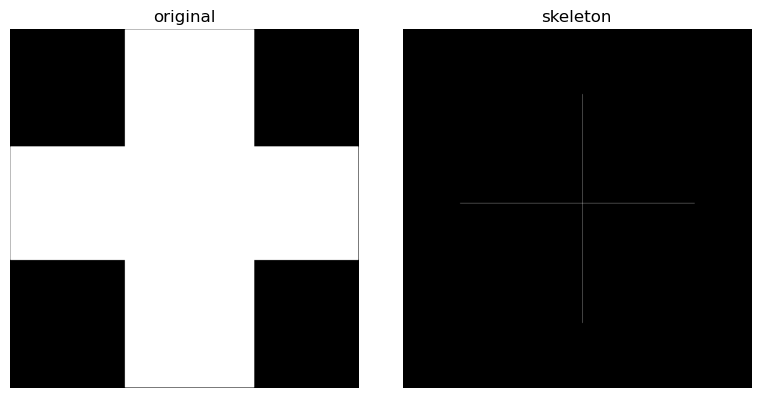

...

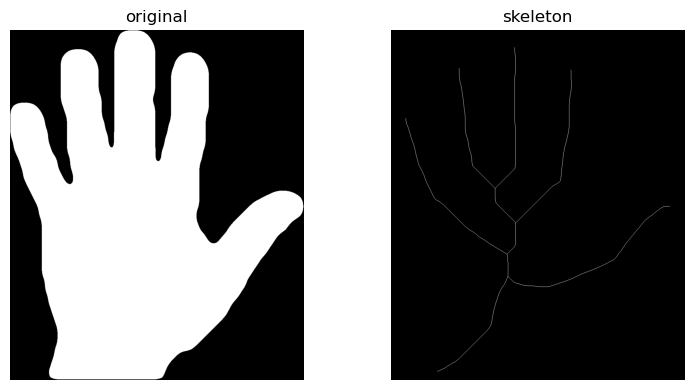

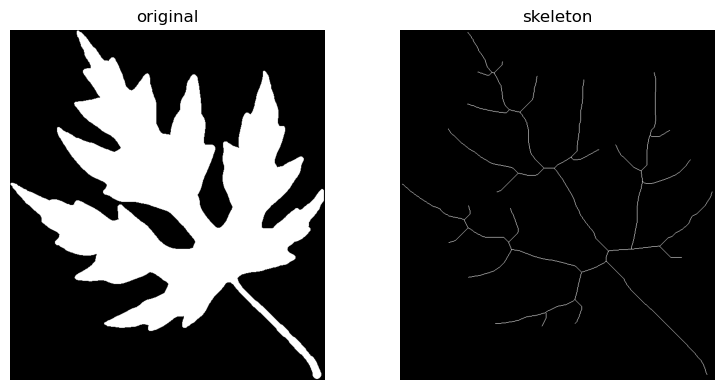

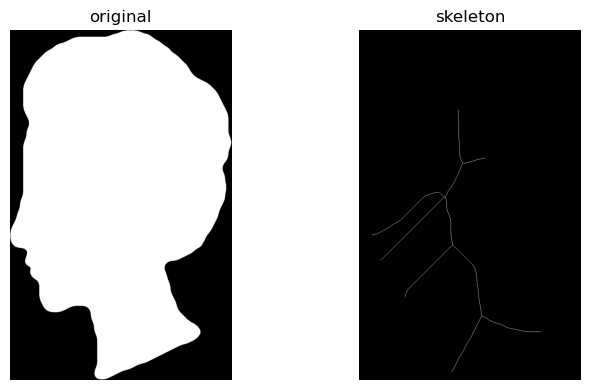

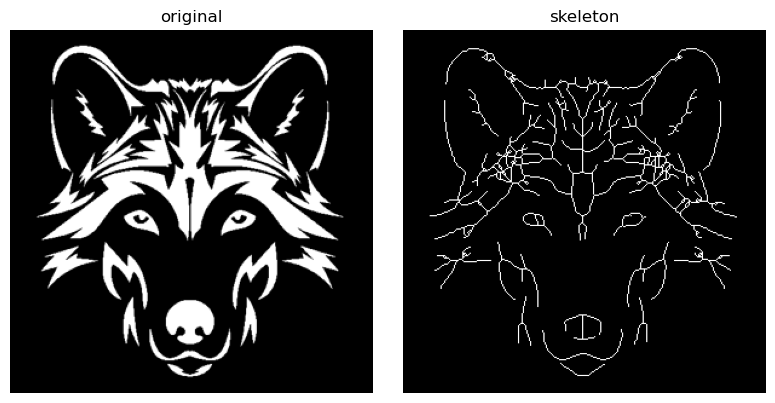

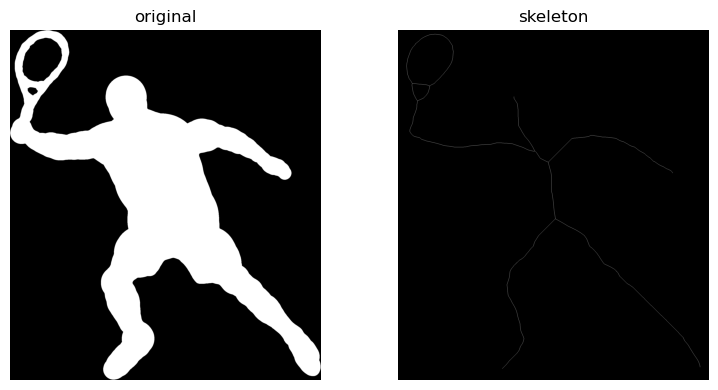

In [231]:
def skeletonize_images(images, method="zhang"):
    skeletons = [skeletonize(image, method=method).astype("uint8") for image in images]
    for image, skeleton in zip(images,skeletons):
        # Convert 255 values into 1 (problem with lee skeleton)
        skeleton[skeleton == 255] = 1 

        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 4),
                                 sharex=True, sharey=True)

        ax = axes.ravel()

        ax[0].imshow(image, cmap=plt.cm.gray)
        ax[0].axis('off')
        ax[0].set_title('original')

        ax[1].imshow(skeleton, cmap=plt.cm.gray)
        ax[1].axis('off')
        ax[1].set_title('skeleton')

        fig.tight_layout()
        plt.show()
    return skeletons

skeletons = skeletonize_images(images)

### 3. Find center points of the shapes (centroid)

In [232]:
def find_centroid(images, debug=False):
    """Compute the centroid of the figure in the image."""
    centroids = []
    for image in images:
        M = cv.moments(image.astype('uint8'))
        cx = int(M['m10']/M['m00'])
        cy = int(M['m01']/M['m00'])
        centroids.append((cx,cy))
    if debug:
        for image,centroid in zip(images,centroids):
            plt.imshow(image, cmap=plt.cm.gray)
            plt.scatter(centroid[0],centroid[1],c='r')
            plt.show()
    return centroids

def find_center_of_mass(images, debug=False):
    centers_of_mass = []
    for image in images:
        M = cv.moments(image.astype('uint8'))
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            centers_of_mass.append((cx, cy))
        else:
            # If the image is empty, consider the center as (0, 0)
            centers_of_mass.append((0, 0))
    if debug:
        for image, center in zip(images, centers_of_mass):
            plt.imshow(image, cmap=plt.cm.gray)
            plt.scatter(center[0], center[1], c='r')
            plt.show()
    return centers_of_mass

def find_center_of_min_circle(images, debug=False):
    centers_of_min_circle = []
    for image in images:
        # Find contours
        contours, _ = cv.findContours(image.astype('uint8'), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        if contours:
            # Get the minimum enclosing circle
            (x, y), radius = cv.minEnclosingCircle(contours[0])
            centers_of_min_circle.append((int(x), int(y)))
        else:
            # If no contour is found, consider the center as (0, 0)
            centers_of_min_circle.append((0, 0))
    if debug:
        for image, center in zip(images, centers_of_min_circle):
            plt.imshow(image, cmap=plt.cm.gray)
            plt.scatter(center[0], center[1], c='r')
            plt.show()
    return centers_of_min_circle

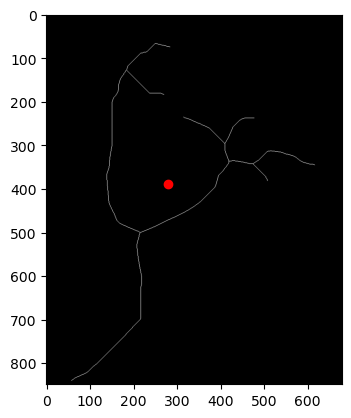

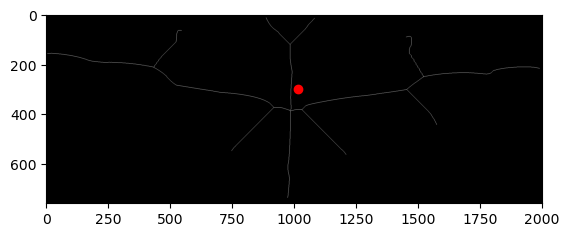

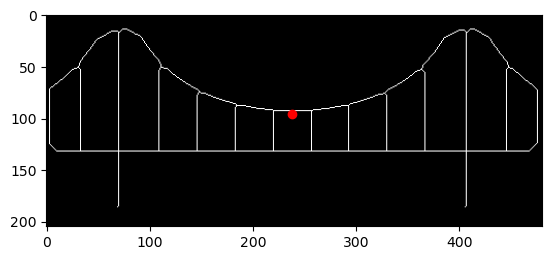

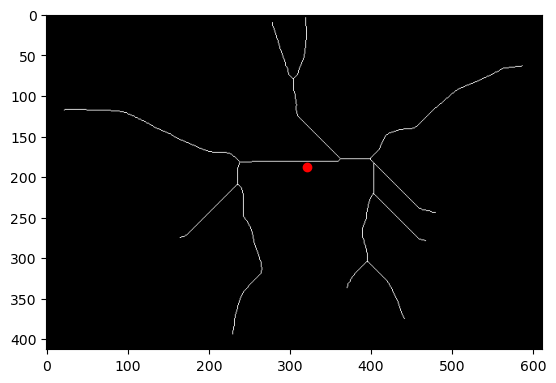

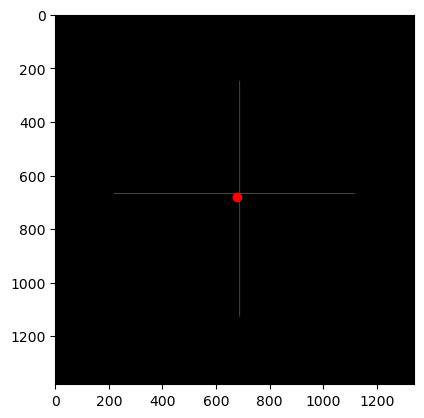

...

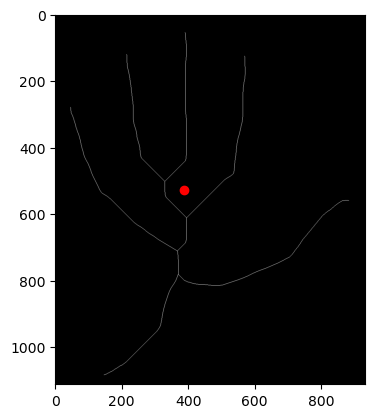

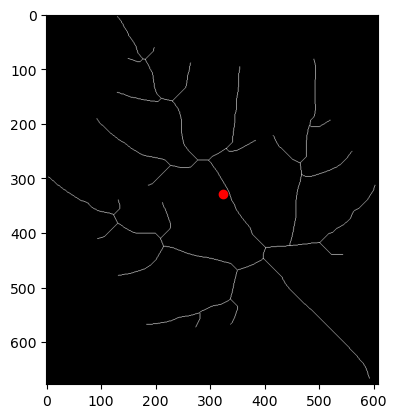

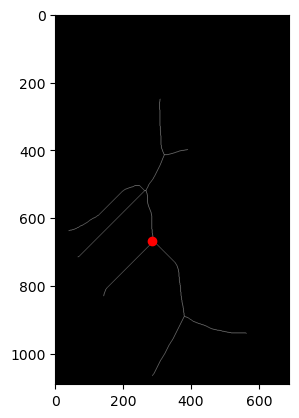

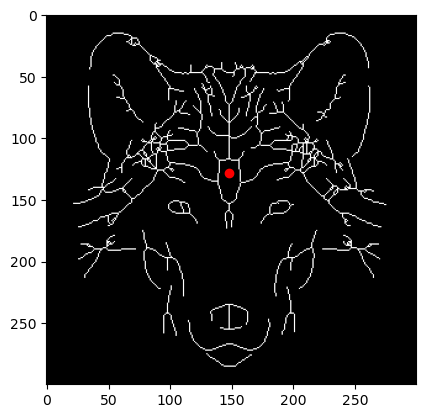

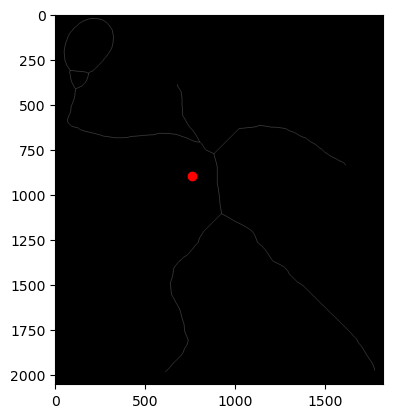

In [233]:
centroids = find_centroid(skeletons, debug=True)

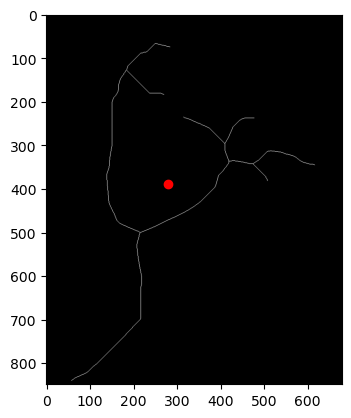

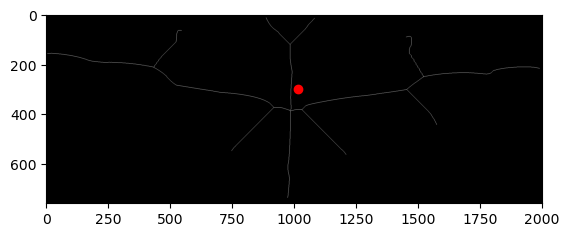

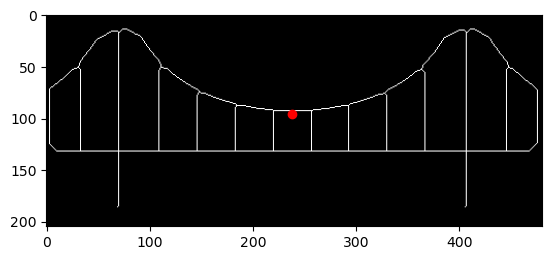

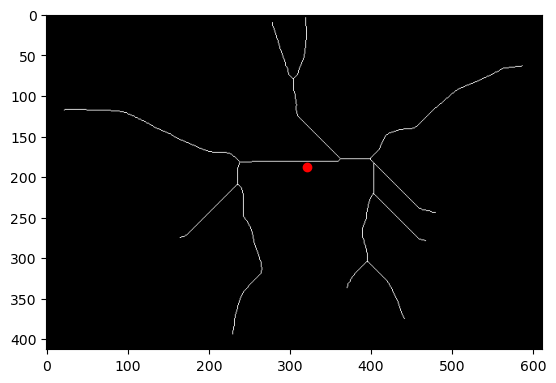

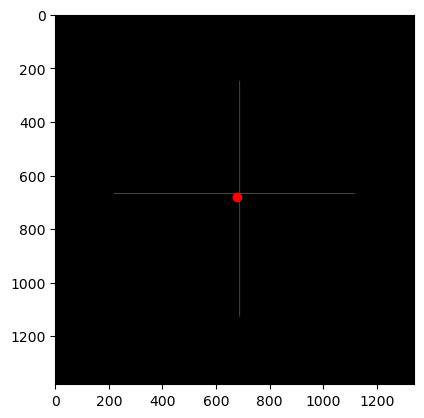

...

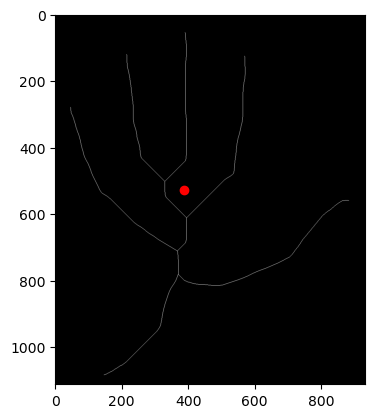

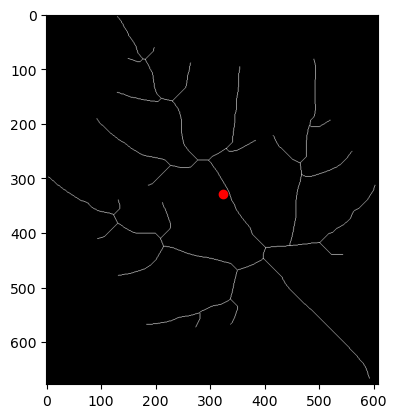

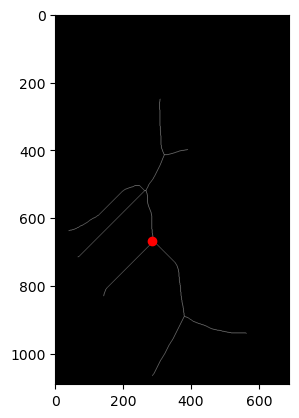

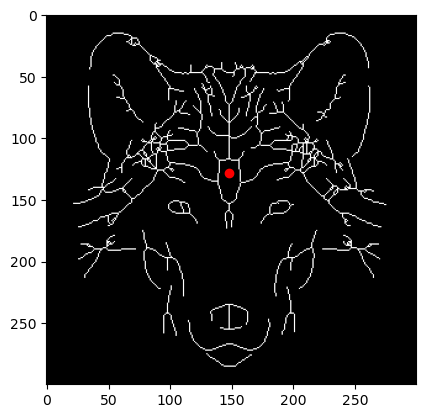

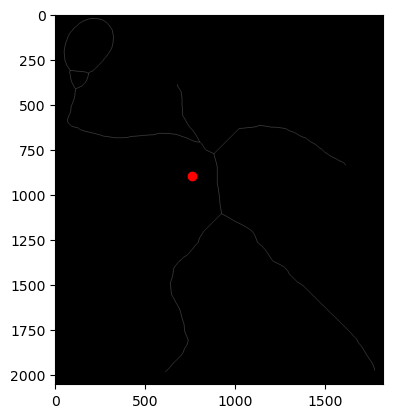

In [234]:
centers_mass = find_center_of_mass(skeletons, debug=True)

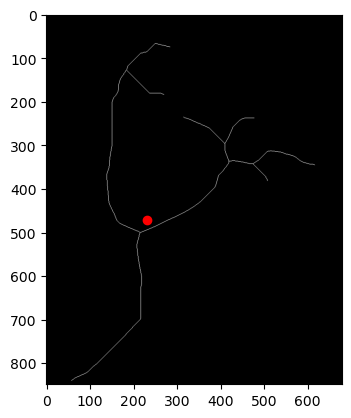

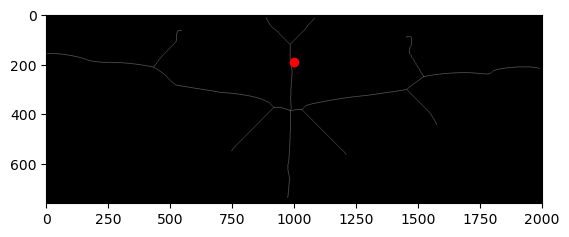

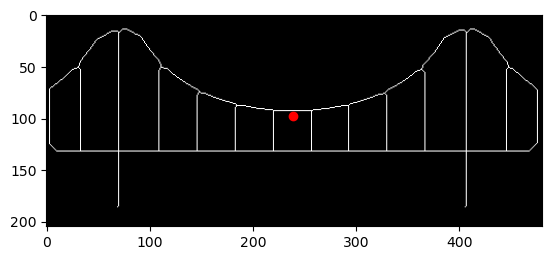

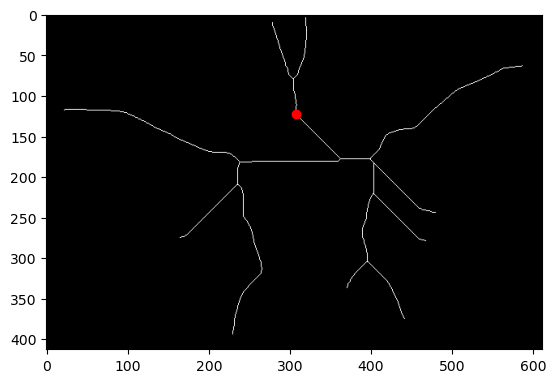

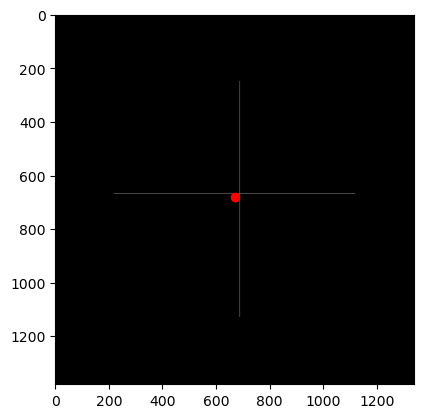

...

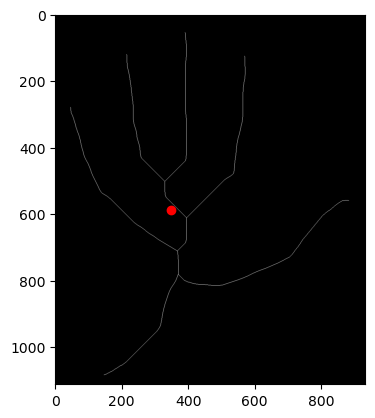

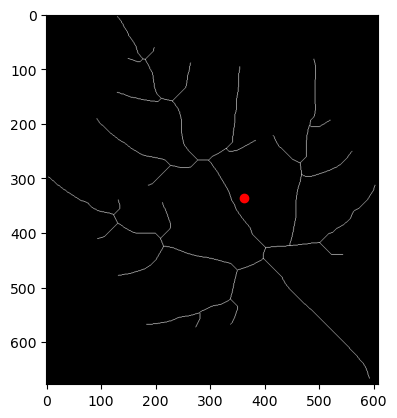

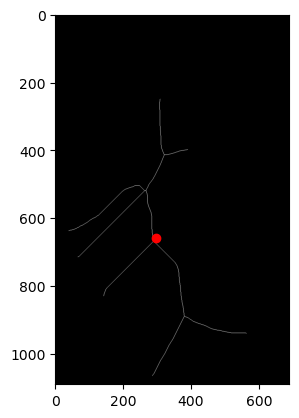

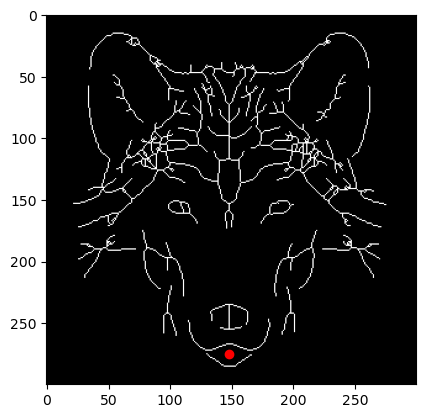

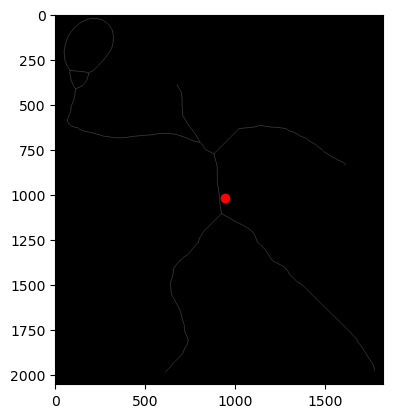

In [235]:
min_circle_centers = find_center_of_min_circle(skeletons, debug=True)

### 4. Estimate reflection line

In [236]:
class SignatureSymmetry:
    """
    Detects symmetry in an image based on shape signatures.
    Based on Nguyen, T. P., Truong, H. P., Nguyen, T. T., & Kim, Y. (2022). Reflection symmetry detection of shapes based on shape signatures. Pattern Recognition, 128, 108667. https://doi.org/10.1016/j.patcog.2022.108667
    """

    def __init__(self, image, tau, centroid_func=find_centroid):
        """
        Initialize the SignatureSymmetry object with the image and the centroid function.

        Args:
            image (numpy.ndarray): The input image.
            tau (float): Threshold
            centroid_func: The centroid computation function (default is find_centroid).
        """
        self.image = image.astype('uint8')
        self.centroid = centroid_func([image])[0]
        self.tau = tau
        
        # Initially reflected image is not computed
        self.reflected_image = None

    # Function to calculate Rf2(θ)
    def Rf2(self,sinogram):
        """
        Calculate the squared Radon transform Rf2(θ).

        Parameters:
            sinogram (numpy.ndarray): The sinogram obtained from the Radon transform.

        Returns:
            numpy.ndarray: The squared Radon transform Rf2(θ).
        """
        # Compute the square of Rf(θ, ρ)
        sinogram_squared = sinogram**2

        # Integrate Rf^2(θ, ρ) with respect to ρ for each θ
        # We'll use the composite trapezoidal rule for numerical integration
        return simps(sinogram_squared, axis=0)

    def plot_r2_signature(self,signature, theta):
        """
        Plot the Rf2(θ) signature.

        Parameters:
            signature (numpy.ndarray): The Rf2(θ) signature.
            theta (numpy.ndarray): The angles at which the signature is computed.
        """
        # Print or plot the result
        plt.plot(theta, signature)
        plt.xlabel('Theta (degrees)')
        plt.ylabel('Rf2(θ)')
        plt.title('R-signature')
        plt.show()

    def plot_lip_values(self,signature, directions):
        """
        Plot the LIP values.

        Parameters:
            signature (numpy.ndarray): The LIP signature.
            directions (numpy.ndarray): The directions at which the signature is computed.
        """
        plt.plot(directions, signature)
        plt.title('LIP-Signature')
        plt.xlabel('Direction (degrees)')
        plt.ylabel('LIP Value')
        plt.show()

    def plot_sinogram(self,image, sinogram):
        """
        Plot the original image and its sinogram.

        Parameters:
            image (numpy.ndarray): The original image.
            sinogram (numpy.ndarray): The sinogram obtained from the Radon transform.
        """
        dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4.5))

        ax1.set_title("Original")
        ax1.imshow(image, cmap=plt.cm.Greys_r)

        ax2.set_title("Radon transform\n(Sinogram)")
        ax2.set_xlabel("Projection angle (deg)")
        ax2.set_ylabel("Projection position (pixels)")
        ax2.imshow(
            sinogram,
            cmap=plt.cm.Greys_r,
            extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
            aspect='auto',
        )

        fig.tight_layout()
        plt.show()

    def plot_symmetry_axis(self,image, symmetry_directions, centroid):
        """
        Plot the symmetry axes on the original image.

        Parameters:
            image (numpy.ndarray): The original image.
            symmetry_directions (list): List of angles representing symmetry directions.
            centroid (tuple): Coordinates of the centroid of the image.
        """
        # Get centroid of the image coordinates
        center_x, center_y = centroid
        
        # Plot the original image
        plt.imshow(image, cmap='gray')
        
        # Plot the symmetry axes
        for theta in symmetry_directions:
            theta_rad = np.deg2rad(theta)
            t = np.linspace(-max(image.shape), max(image.shape), 1000)
            x = center_x + t * np.cos(theta_rad)
            y = center_y + t * np.sin(theta_rad)

            # Clip the lines to stay within image boundaries
            x = np.clip(x, 0, image.shape[1]-1)
            y = np.clip(y, 0, image.shape[0]-1)
            
            plt.plot(x, y, 'r')
        
        #plt.axis('image')
        plt.axis('off')
        plt.show()

    # Function to plot merits with peaks
    def plot_merits_with_peaks(self,angles, merit, peaks):
        """
        Plot the merit values with peaks marked.

        Parameters:
            angles (numpy.ndarray): The angles at which the merit values are computed.
            merit (numpy.ndarray): The merit values.
            peaks (numpy.ndarray): Indices of the peaks in the merit values.
        """
        plt.plot(angles, merit)
        plt.plot(angles[peaks], merit[peaks], 'ro')  # Plot peaks as red points
        plt.xlabel('Angle (degrees)')
        plt.ylabel('Merit')
        plt.title('Merit of signature with Peaks')
        plt.grid(True)
        plt.show()

    def largest_intersection(self,sinogram):
        """
        Find the largest intersection in the Radon image in a given direction.
        """
        return np.max(sinogram, axis=0)

    def projection(self,sinogram):
        """
        Compute the projection of the Radon image onto a line perpendicular to the given direction.
        """
        sinogram_nzero = sinogram > 0

        # Integrate Rf^2(θ, ρ) with respect to ρ for each θ
        # We'll use the composite trapezoidal rule for numerical integration
        return simps(sinogram_nzero, axis=0)

    def LIP_signature(self,sinogram):
        """
        Compute the LIP signature of the Radon image over a set of directions.
        """
        lip_value = self.largest_intersection(sinogram) / self.projection(sinogram)
            
        return np.array(lip_value)

    def run(self, method=True, visualize=True):
        """
        Detect reflection symmetry axes in an image.

        Parameters:
            image (numpy.ndarray): The input image.
            tau (float): Threshold for peak detection in the merit function.
            method (bool): If True, use LIP-signature method; otherwise, use R-signature method.
            plot (bool): If True, plot intermediate results.

        Returns:
            tuple: A tuple containing the number of symmetry axes found, a list of symmetry directions,
                and a list of symmetry measures.
        """
        # Compute the Radon transform Rf(θ, ρ)
        theta = np.arange(0, 180)  # angles from 0 to 179 degrees
        sinogram = radon(self.image, theta=theta, circle=True)

        if visualize:
            self.plot_sinogram(self.image, sinogram)

        merit = np.zeros_like(theta,dtype=np.float64)
        n = 0
        symmetry_directions = []
        symmetry_measures = []

        if method:
            signature = self.LIP_signature(sinogram)  # LIP-signature of D over angles
                
            if visualize:
                self.plot_lip_values(signature, theta)
        else:
            signature = self.Rf2(sinogram)  # R-signature of D over angles
            if visualize:
                self.plot_r2_signature(signature, theta)

        for angle in theta:
            merit[angle] = self.calculate_merit(angle, signature)

        peaks, _ = find_peaks(merit, height=self.tau)

        if visualize:
            print(f"{peaks=}")
        
        if visualize:
            self.plot_merits_with_peaks(theta,merit,peaks)

        for k in range(len(peaks)):
            angle = peaks[k]
            D_theta = self.symmetric_degree(sinogram, theta, angle)  # Calculate D(θ) using Eq. (4)

            if D_theta > self.tau:
                n += 1  # found a new axis of reflection symmetry
                symmetry_directions.append(angle)
                symmetry_measures.append(D_theta)

        if visualize:
            self.plot_symmetry_axis(self.image, symmetry_directions, self.centroid)

        if len(symmetry_directions) > 0:
            # Compute reflected image using the mirror line (with the most symmetric axis)
            idx_sym = max(range(len(symmetry_measures)), key=symmetry_measures.__getitem__)

            self.reflected_image = self.reflect_image(self.centroid, symmetry_directions[idx_sym])

        return n, symmetry_directions, symmetry_measures

    def reflect_image(self, centroid, angle):
        """
        Reflect the original image using the mirror line parameters (centroid_x, centroid_y, angle).

        Args:
            centroid (tuple): Coordinates of the centroid (centroid_x, centroid_y).
            angle (float): Angle of reflection (in radians).

        Returns:
            numpy.ndarray: Reflected image.
        """
        centroid_x, centroid_y = centroid

        # Compute the sine and cosine of the reflection angle
        cos_angle = np.cos(angle)
        sin_angle = np.sin(angle)

        # Translation matrix to move centroid to the origin
        translate_to_origin = np.array([[1, 0, -centroid_x],
                                        [0, 1, -centroid_y],
                                        [0, 0, 1]])

        # Rotation matrix to rotate about the origin
        rotate = np.array([[cos_angle, -sin_angle, 0],
                           [sin_angle, cos_angle, 0],
                           [0, 0, 1]])

        # Translation matrix to move the centroid back
        translate_back = np.array([[1, 0, centroid_x],
                                   [0, 1, centroid_y],
                                   [0, 0, 1]])

        # Affine transformation matrix
        transformation_matrix = translate_back @ rotate @ translate_to_origin

        # Get image dimensions
        rows, cols = self.image.shape[:2]

        # Create an empty array to store the reflected image
        reflected_image = np.zeros_like(self.image)

        # Iterate over each pixel in the original image
        for y in range(rows):
            for x in range(cols):
                # Apply the transformation matrix to get the reflected coordinates
                reflected_coords = np.dot(transformation_matrix, [x, y, 1]).astype(int)

                # Check if the reflected coordinates are within the image bounds
                if 0 <= reflected_coords[0] < cols and 0 <= reflected_coords[1] < rows:
                    # Assign the pixel value to the corresponding pixel in the reflected image
                    reflected_image[reflected_coords[1], reflected_coords[0]] = self.image[y, x]

        return reflected_image

    def pearson_correlation_coefficient(self,X, Y):
        """
        Compute the Pearson correlation coefficient between two NumPy arrays.
        
        Args:
        - X (numpy.ndarray): The first array.
        - Y (numpy.ndarray): The second array.
        
        Returns:
        - float: The Pearson correlation coefficient.
        """
        return np.corrcoef(X, Y)[0, 1]

    # Extract the Radon projection for a specific angle
    def get_radon_projection(self,sinogram, theta, angle):
        """
        Extract the Radon projection for a specific angle from the sinogram.

        Parameters:
            sinogram (numpy.ndarray): The sinogram obtained from the Radon transform.
            theta (numpy.ndarray): The array of projection angles.
            angle (float): The angle at which to extract the projection.

        Returns:
            numpy.ndarray: The Radon projection at the specified angle.
        """
        # Find the index of the specified angle in the theta array
        angle_index = np.argmin(np.abs(theta - angle))
        # Extract the corresponding column from the sinogram
        projection = sinogram[:, angle_index]
        return projection

    # Compute the inverse of an array
    def compute_inverse(self,array):
        """
        Compute the inverse of an array.

        Parameters:
            array (numpy.ndarray): The input array.

        Returns:
            numpy.ndarray: The array with elements in reverse order.
        """
        return array[::-1]

    # Function to calculate the intensity of the pixel at the centroid of shape D
    def symmetric_degree(self,sinogram, theta, peak):
        """
        Calculate the symmetric degree of a shape D.

        Parameters:
            sinogram (numpy.ndarray): The sinogram obtained from the Radon transform.
            theta (numpy.ndarray): The array of projection angles.
            peak (int): The index of the peak angle.

        Returns:
            float: The symmetric degree.
        """
        # Assuming D is an image and centroid is given as (x, y) coordinates
        c = self.get_radon_projection(sinogram, theta, peak)

        return self.pearson_correlation_coefficient(c, self.compute_inverse(c))  # Eq. (4)

    # Function to calculate merit value for a given angle
    def calculate_merit(self,theta, signature):
        """
        Calculate the merit value for a given angle.

        Parameters:
            theta (float): The angle for which to calculate the merit.
            signature (numpy.ndarray): The signature values.

        Returns:
            float: The merit value.
        """
        return self.pearson_correlation_coefficient(np.roll(signature, theta), np.roll(signature, -theta))  # Eq. (3)
    

    ###########
    # METRICS #
    ###########
    def symmetry_score(self):
        """
        Compute a symmetry score based on the distribution of matching points.

        Returns:
            float: Symmetry score.
        """
        matchpoints = self.find_matchpoints()

        if len(matchpoints) > 0:
            points_r, points_theta = self.find_points_r_theta(matchpoints)

            # Calculate the standard deviation of r and theta
            std_r = np.std(points_r)
            std_theta = np.std(points_theta)

            # Compute symmetry score
            symmetry_score = 1 / (std_r + std_theta)

            return symmetry_score
        else:
            return 0.0

    def edge_preservation(self):
        """
        Compute edge preservation metric.

        Returns:
            float: Edge preservation metric.
        """
        if self.reflected_image is None:
            return None
        
        # Compute edge maps for original and flipped images
        edge_map_orig = cv.Canny(self.image, 100, 200)
        edge_map_flip = cv.Canny(self.reflected_image, 100, 200)

        # Compute the percentage of preserved edges
        preserved_edges = np.sum(np.logical_and(edge_map_orig, edge_map_flip))
        total_edges = np.sum(edge_map_orig)

        edge_preservation = preserved_edges / total_edges if total_edges > 0 else 0.0

        return edge_preservation

    def information_loss(self):
        """
        Compute information loss metric.

        Returns:
            float: Information loss metric.
        """
        if self.reflected_image is None:
            return None
        # Compute pixel-wise absolute difference between original and reflected images
        abs_diff = np.abs(self.image - self.reflected_image)

        # Compute the average absolute difference
        avg_abs_diff = np.mean(abs_diff)

        # Normalize by the maximum pixel value (255 for uint8 images)
        information_loss = avg_abs_diff / 255.0

        return information_loss
    
    def jaccard_similarity(self):
        """
        Compute the Jaccard similarity between the original and reflected images.

        Returns:
            float: Jaccard similarity.
        """
        if self.reflected_image is None:
            return None
        # Compute Jaccard similarity
        intersection = np.sum(self.image & self.reflected_image)
        union = np.sum(self.image | self.reflected_image)

        if union == 0:
            return 0  # Handle division by zero
        else:
            return intersection / union

    def boundary_alignment(self):
        """
        Compute the boundary alignment metric.

        Returns:
            float: Boundary alignment metric.
        """
        if self.reflected_image is None:
            return None
        
        # Use edge detection to find object boundaries
        edges_original = cv.Canny(self.image, 100, 200)
        edges_reflected = cv.Canny(self.reflected_image, 100, 200)

        # Compute the percentage of aligned boundary pixels
        aligned_pixels = np.sum(edges_original == edges_reflected)
        total_boundary_pixels = np.sum(edges_original)
        boundary_alignment = aligned_pixels / total_boundary_pixels if total_boundary_pixels > 0 else 0
        return boundary_alignment
    

### 5. Experiments on the benchmark suite

#### 5.1.1 Signature implementation (using LIP-signature)

First, we will do a visual inspection of the quality of the implemented solution. For our first experiment we use the implementation using shape signature.

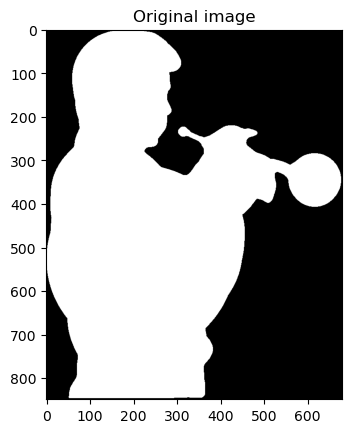

- Image


/home/user/miniconda3/envs/cv2/lib/python3.10/site-packages/skimage/transform/radon_transform.py:75: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn('Radon transform: image must be zero outside the '


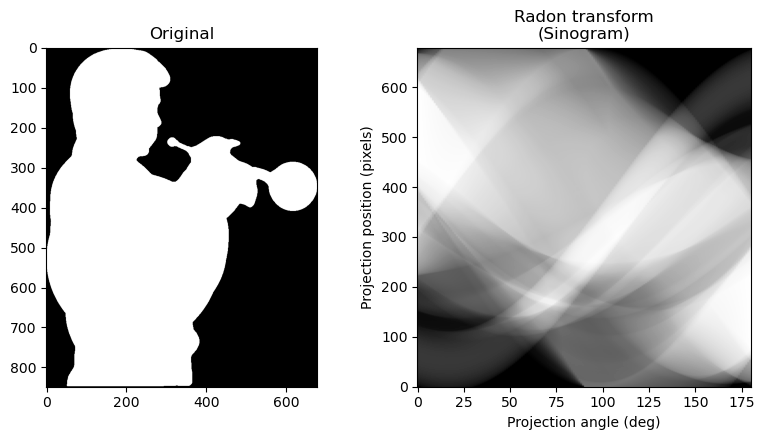

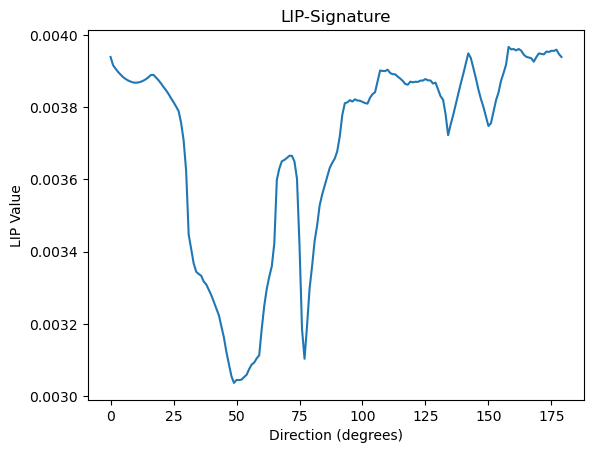

peaks=array([90])


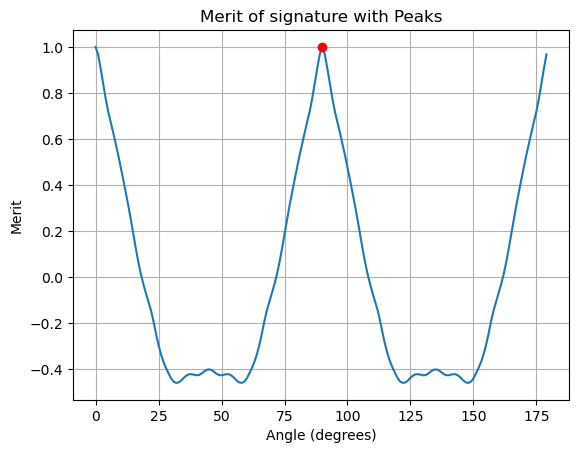

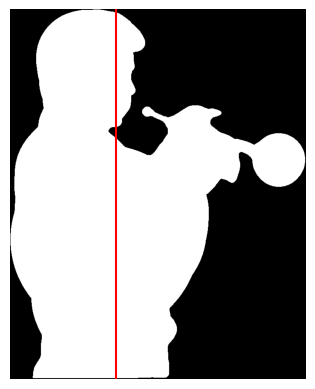

- Skeleton


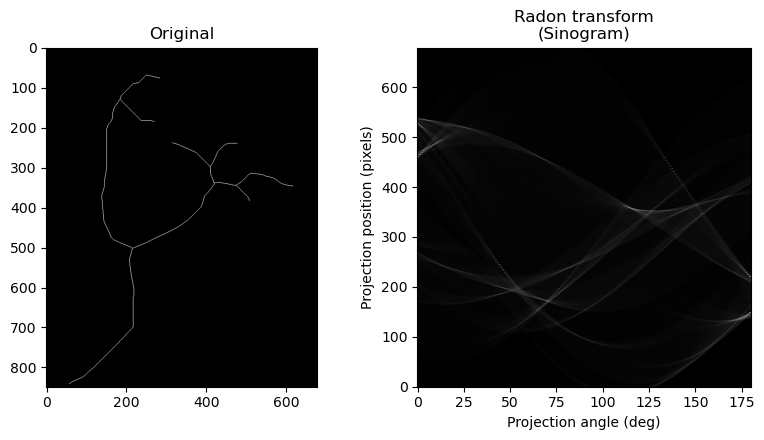

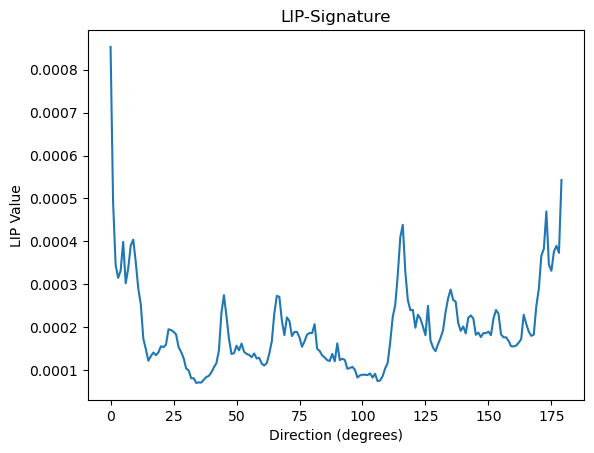

peaks=array([90])


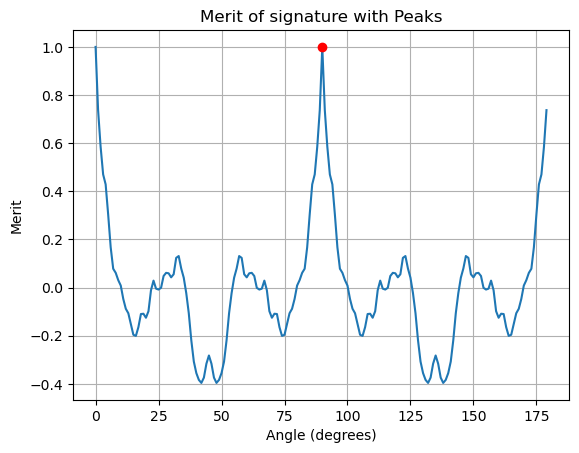

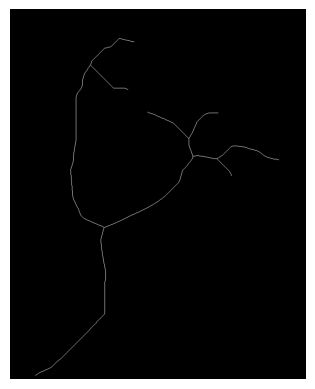

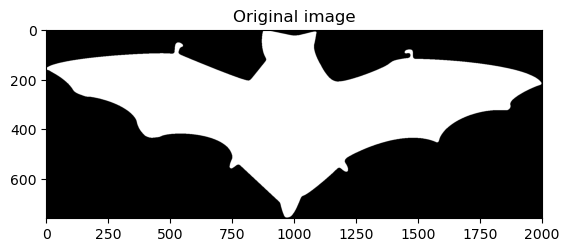

- Image


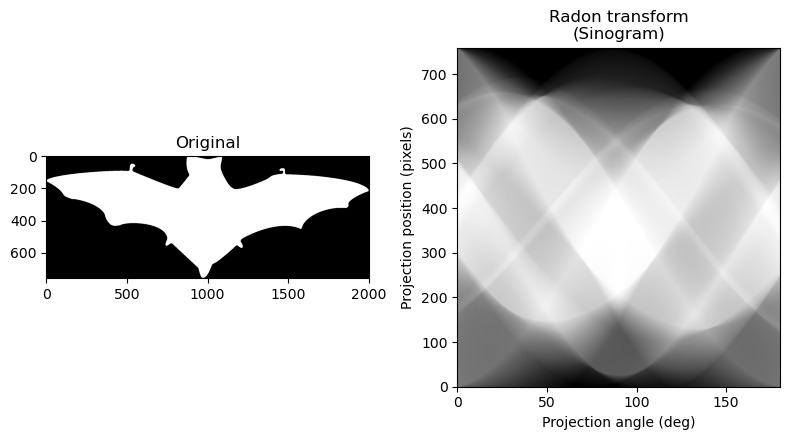

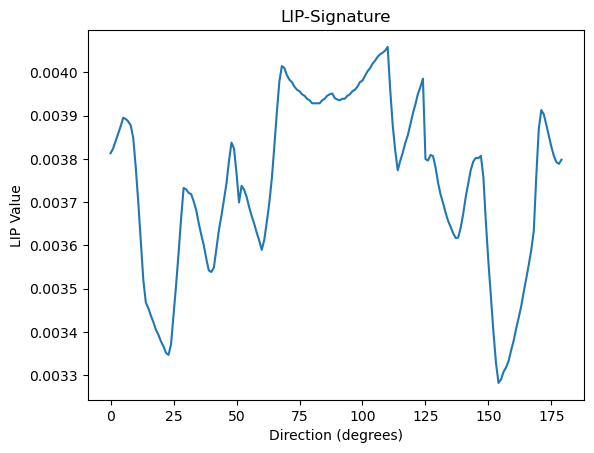

peaks=array([90])


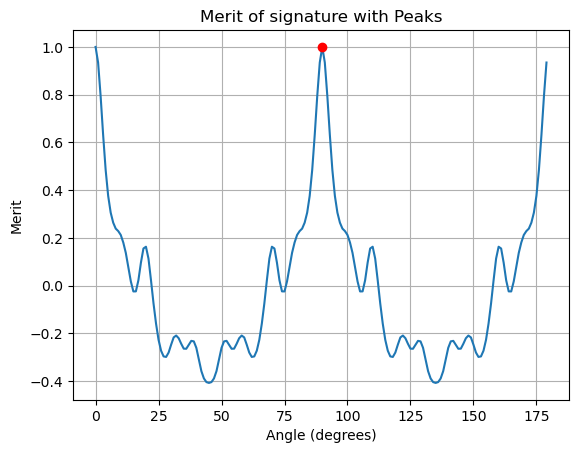

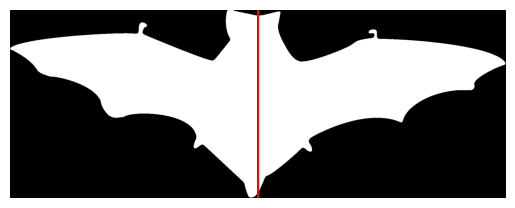

- Skeleton


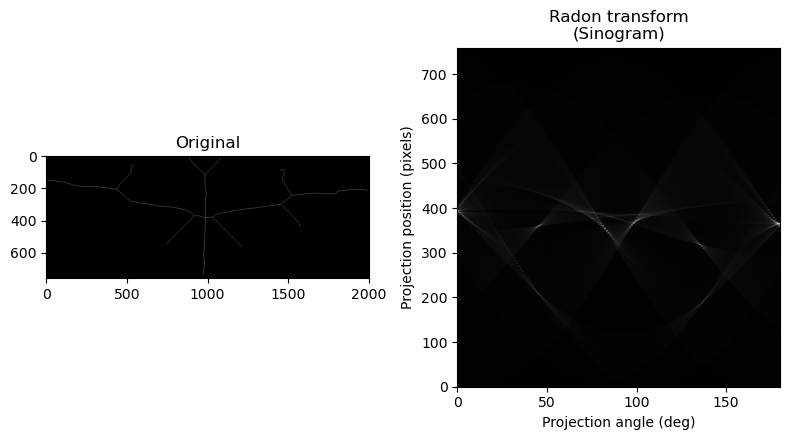

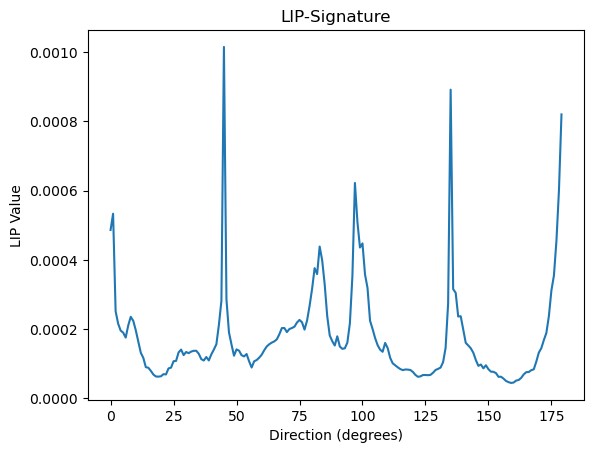

peaks=array([ 45,  90, 135])


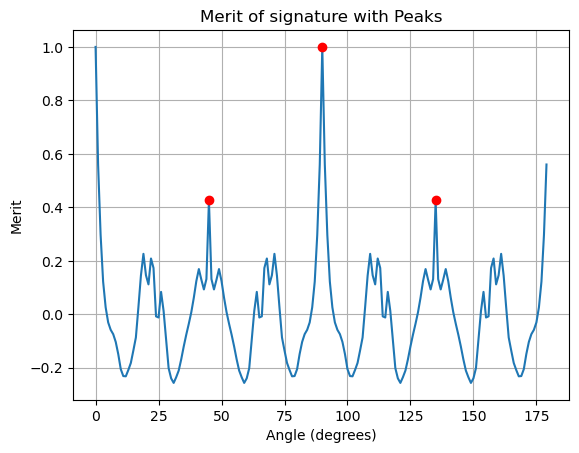

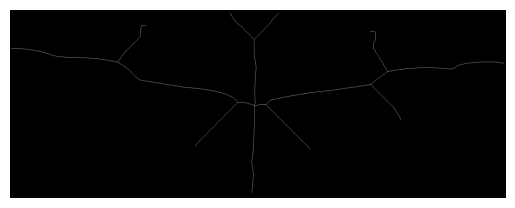

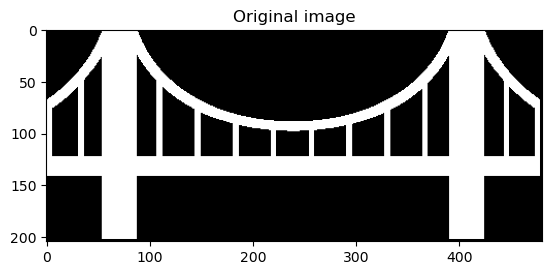

- Image


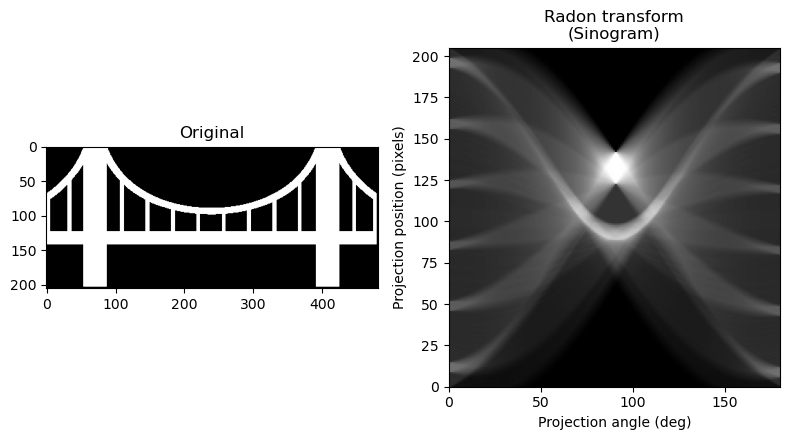

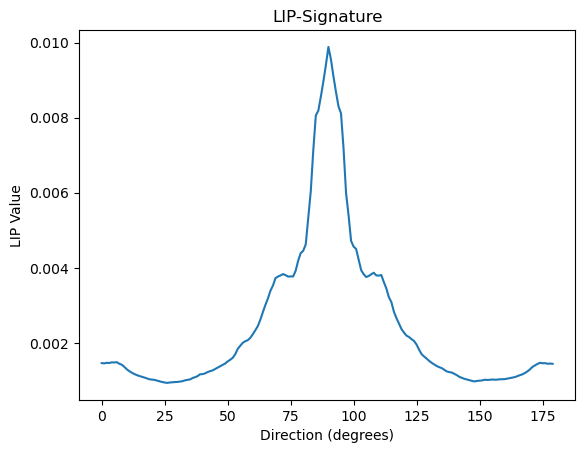

peaks=array([90])


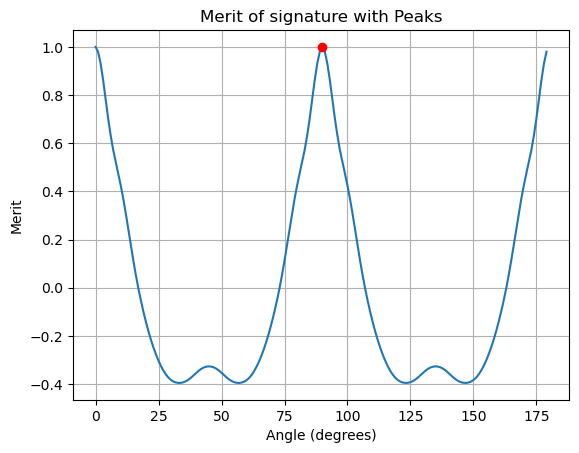

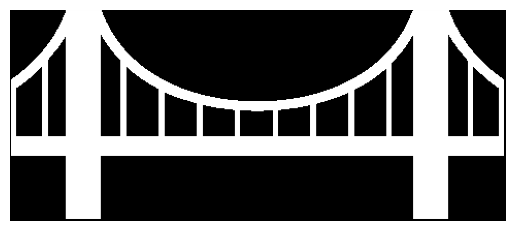

- Skeleton


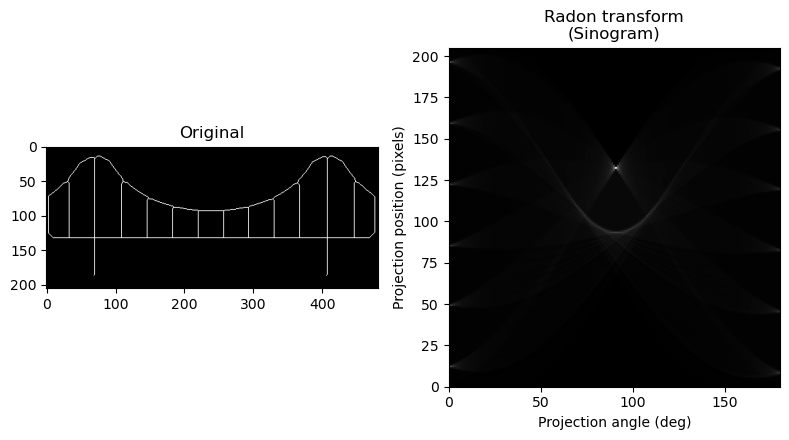

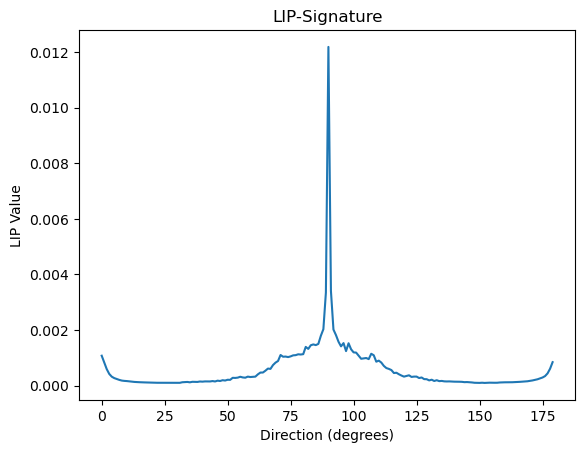

peaks=array([90])


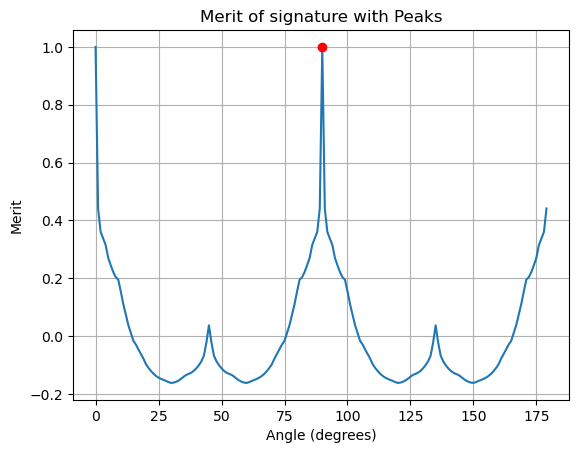

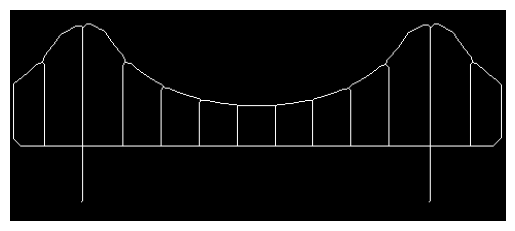

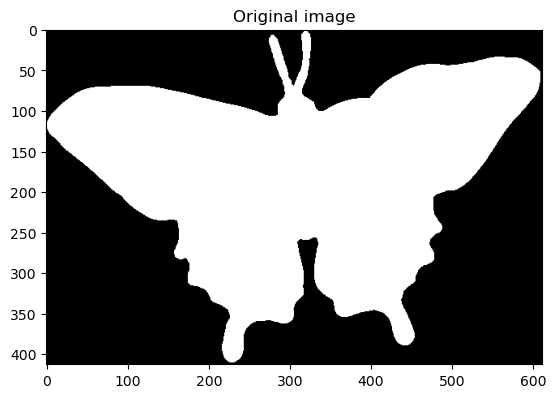

- Image


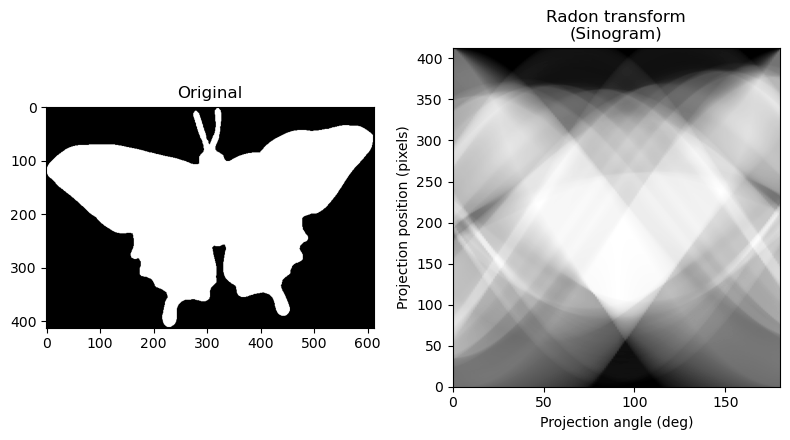

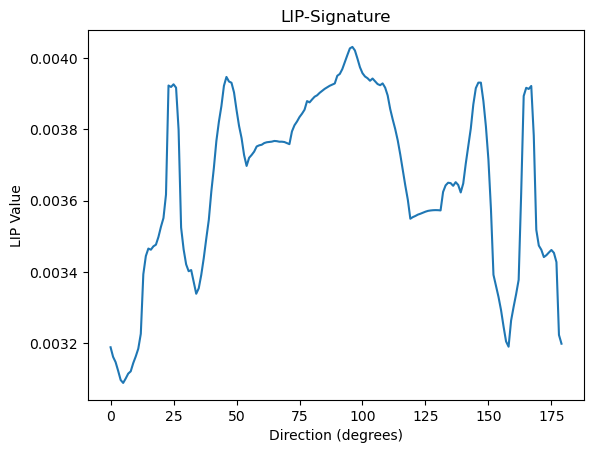

peaks=array([90])


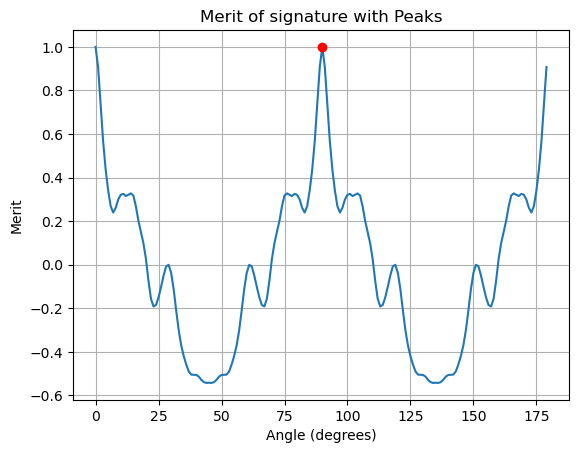

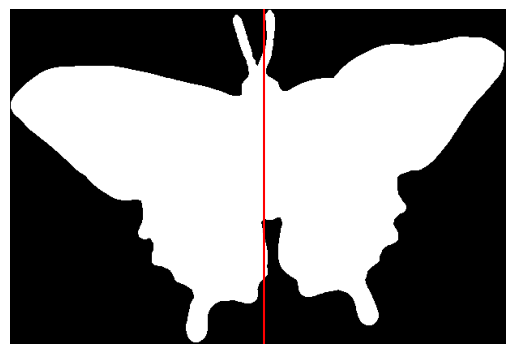

- Skeleton


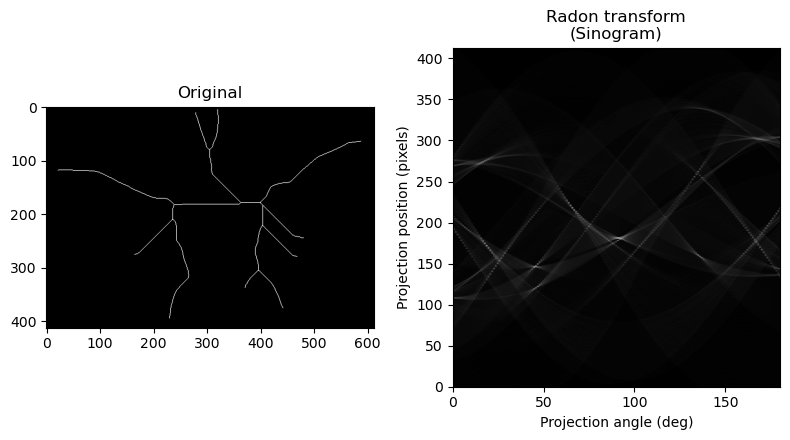

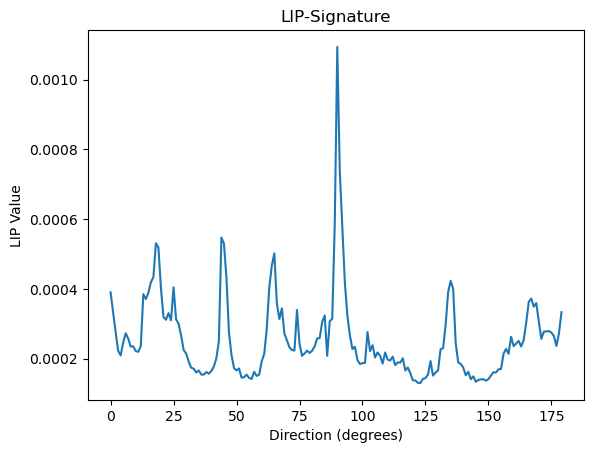

peaks=array([90])


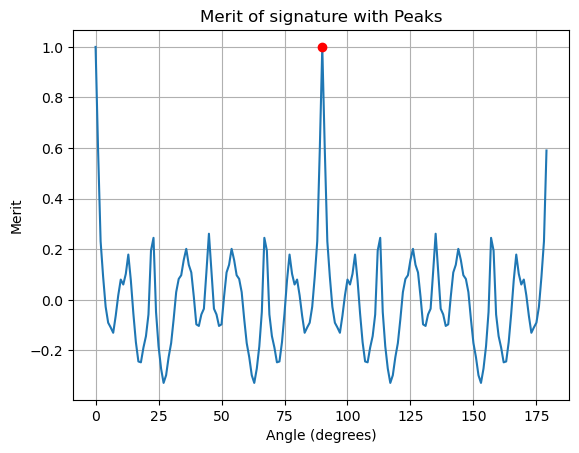

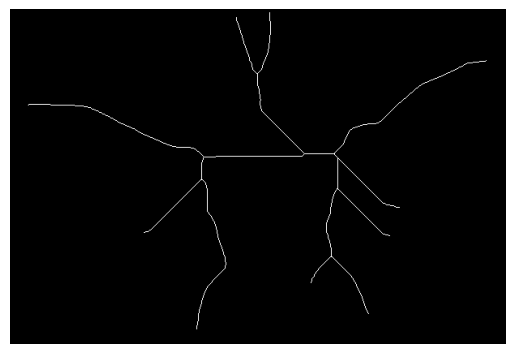

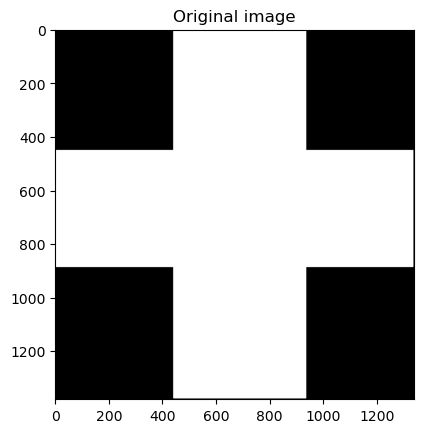

- Image


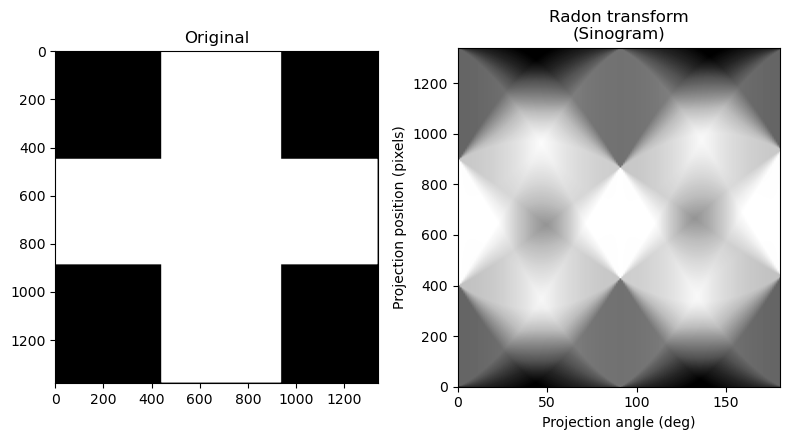

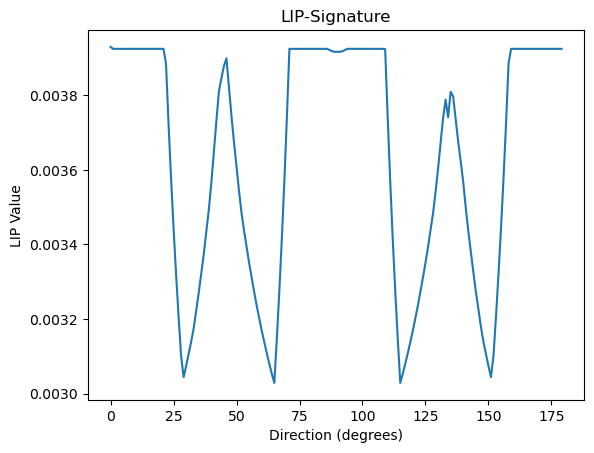

peaks=array([ 45,  90, 135])


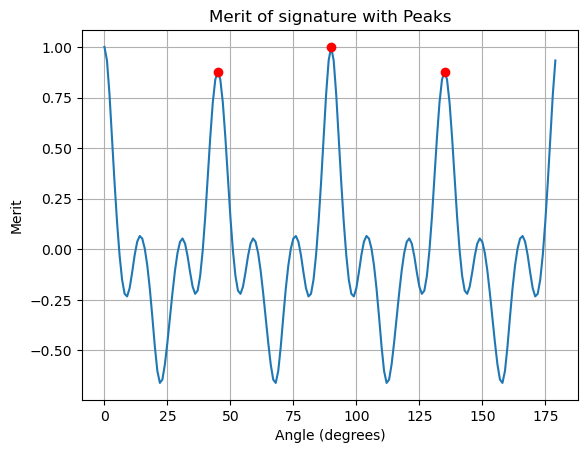

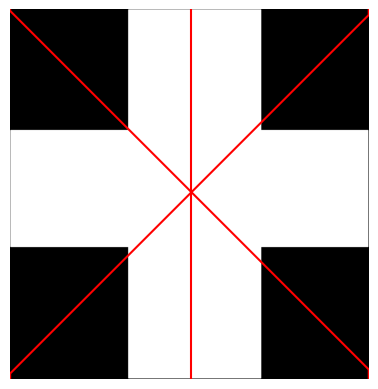

- Skeleton


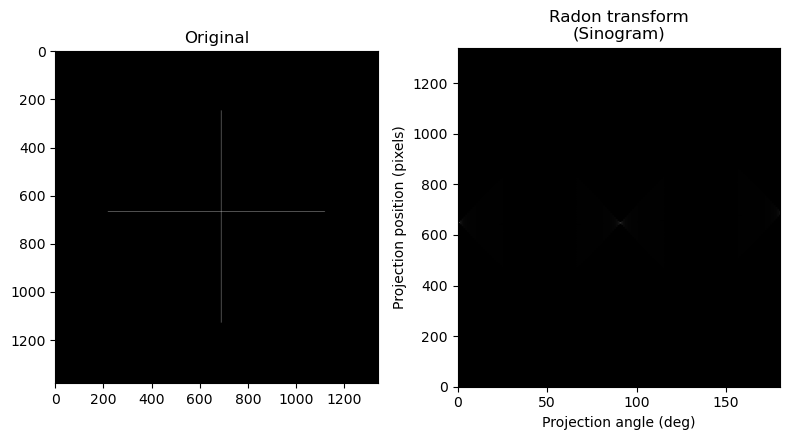

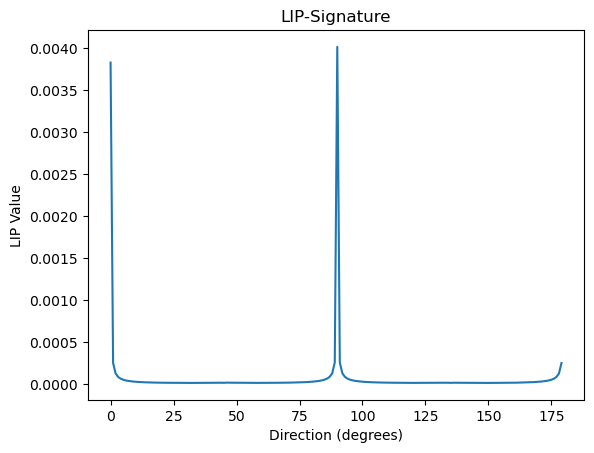

peaks=array([ 45,  90, 135])


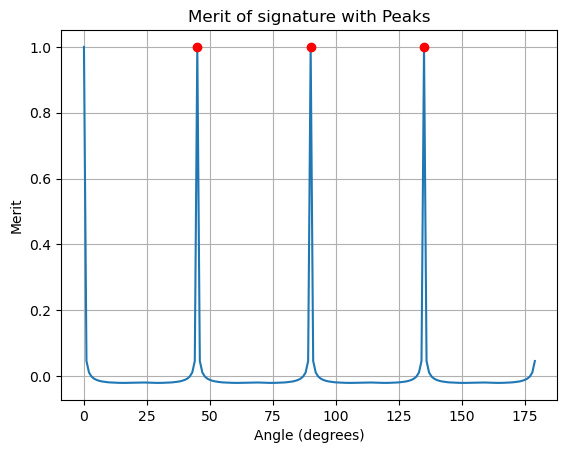

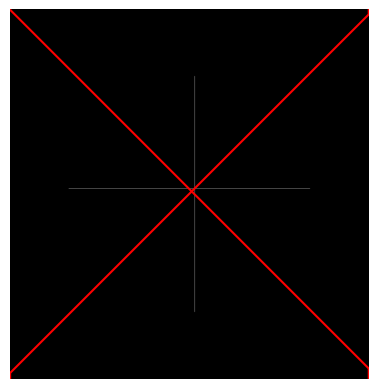

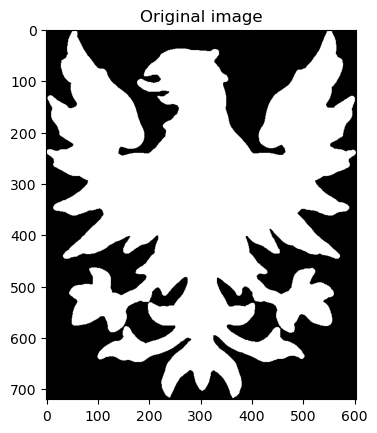

- Image


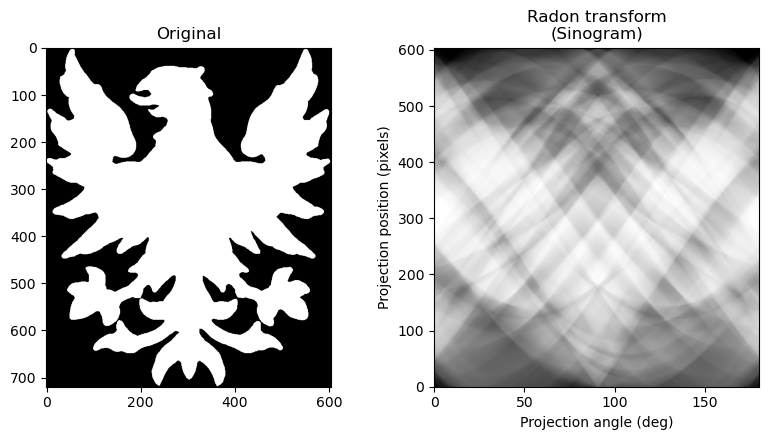

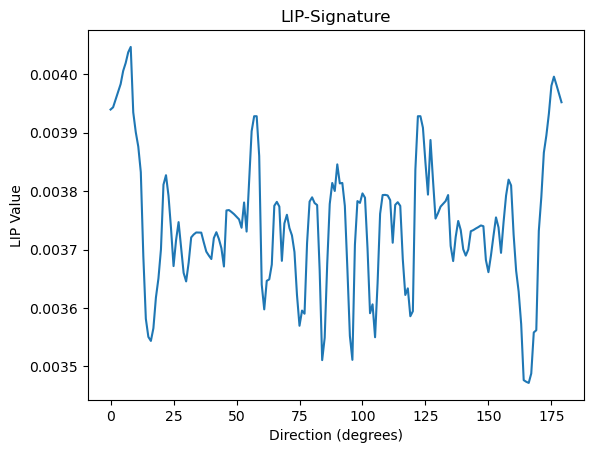

peaks=array([90])


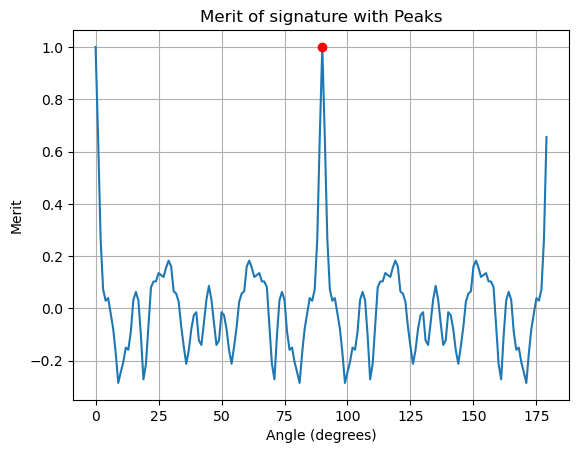

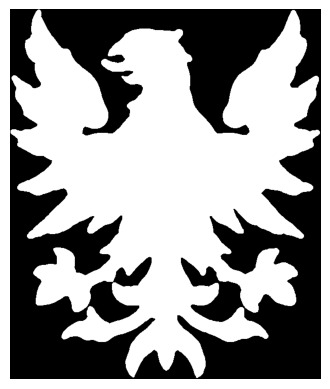

- Skeleton


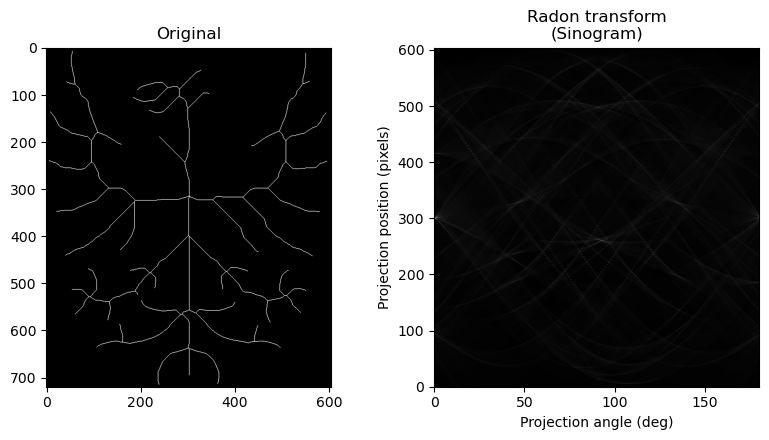

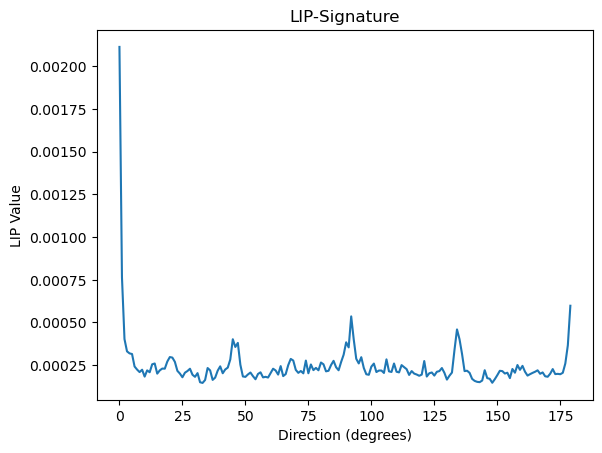

peaks=array([90])


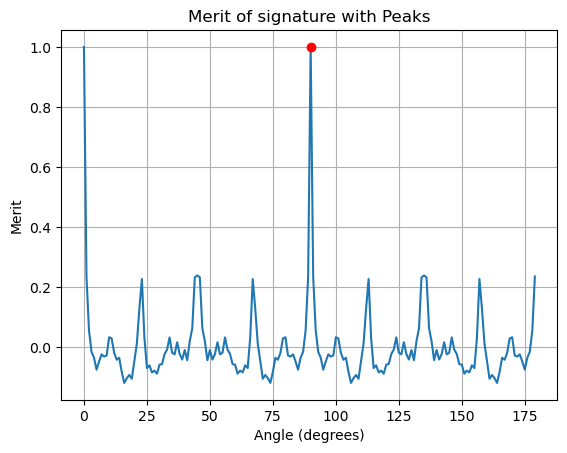

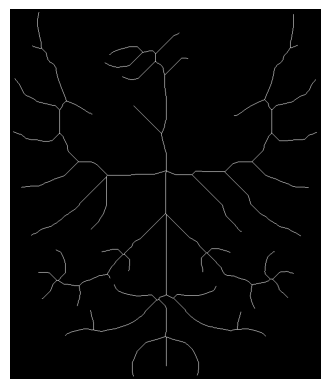

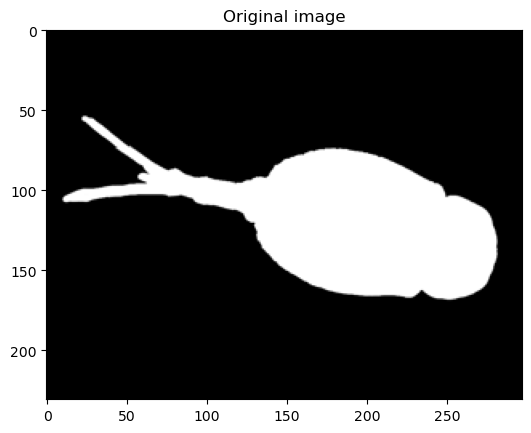

- Image


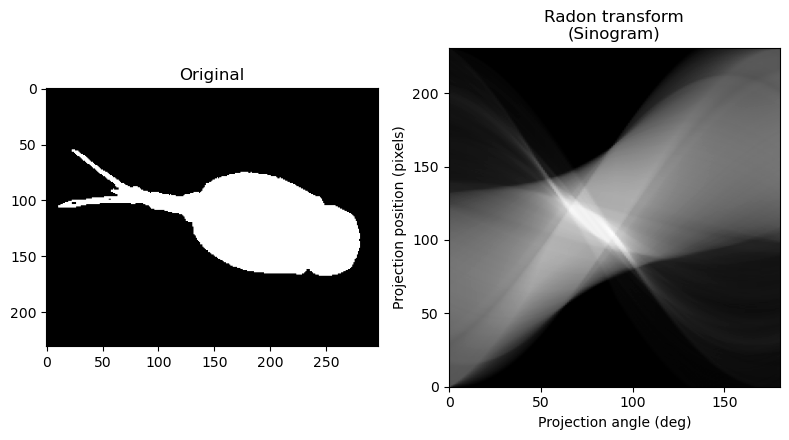

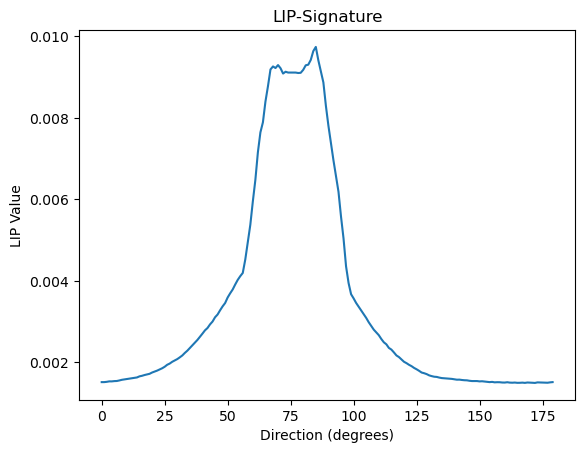

peaks=array([90])


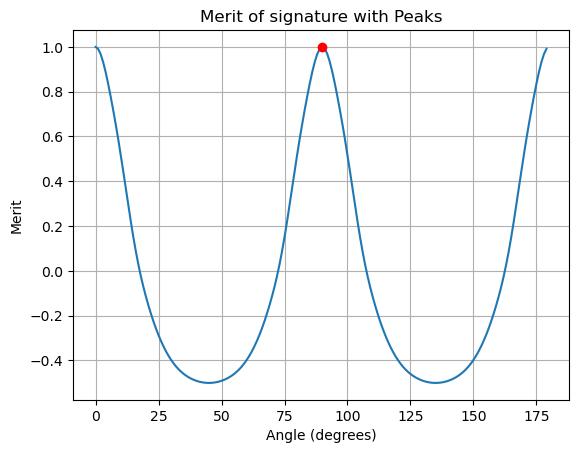

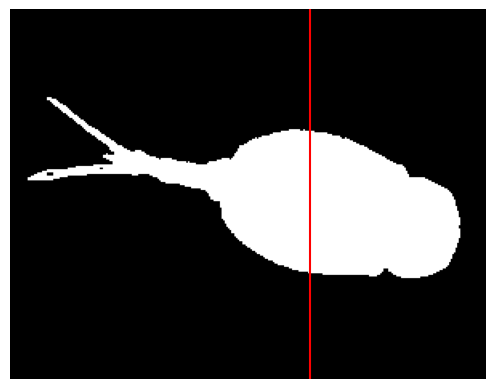

- Skeleton


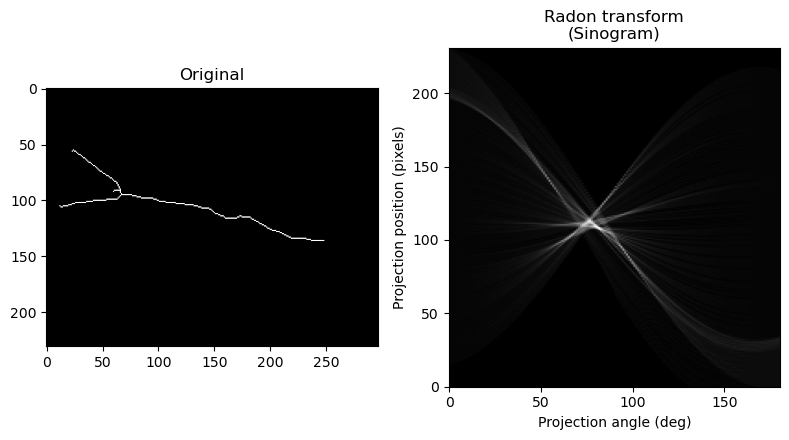

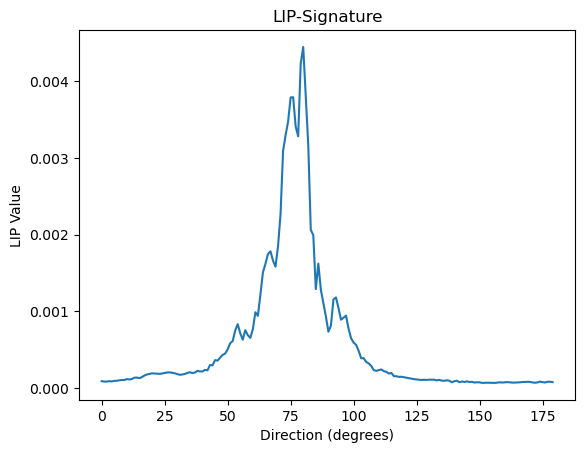

peaks=array([90])


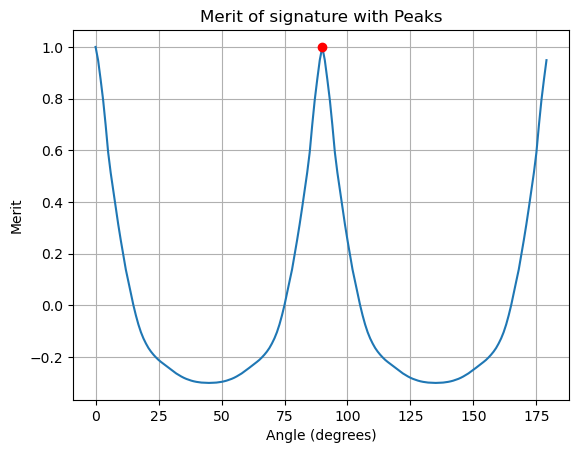

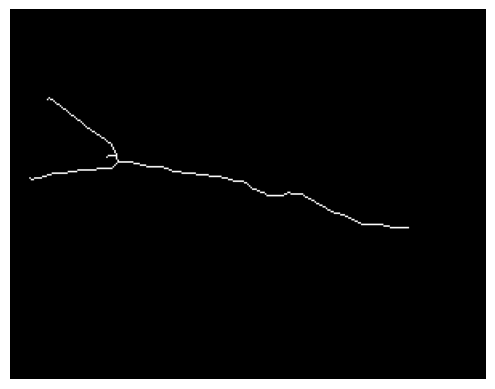

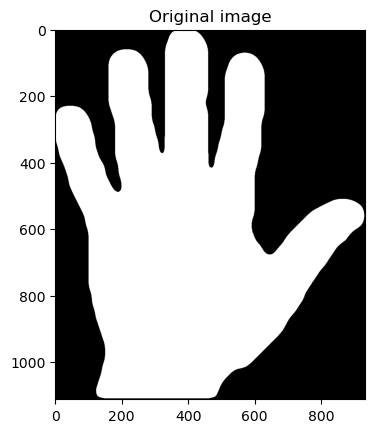

- Image


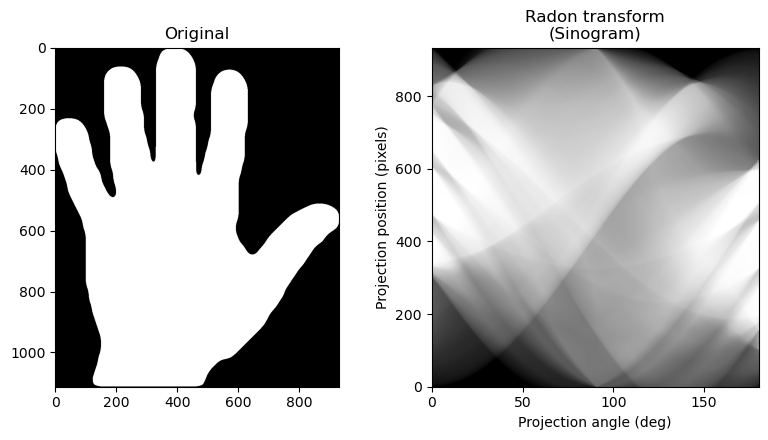

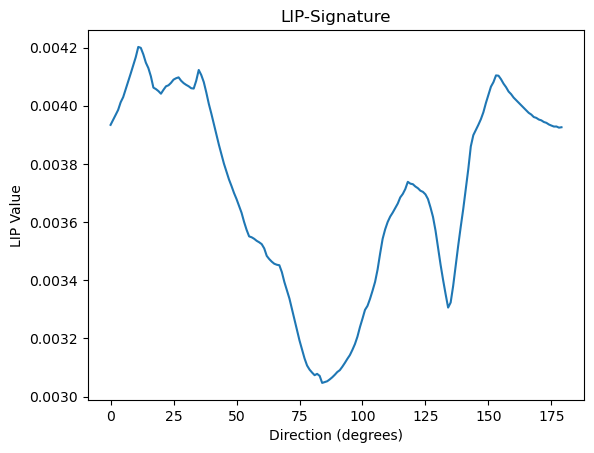

peaks=array([90])


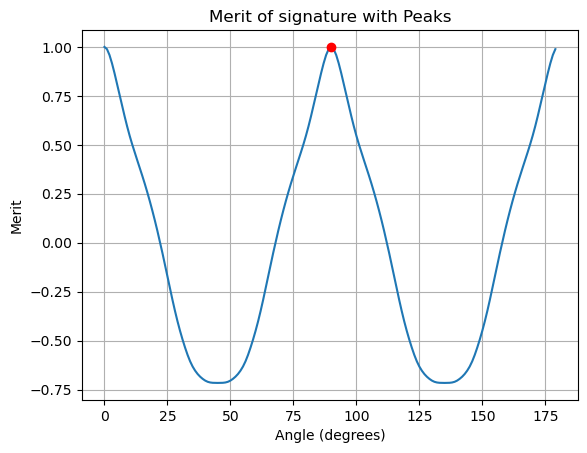

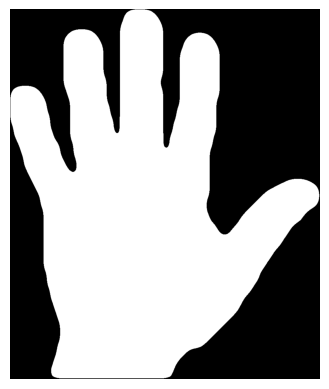

- Skeleton


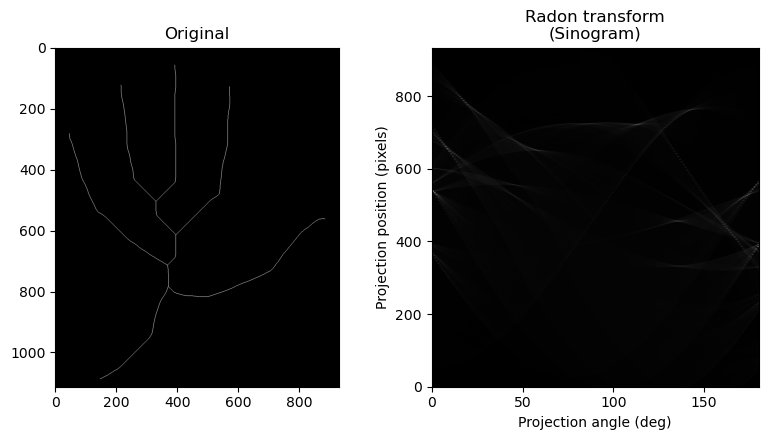

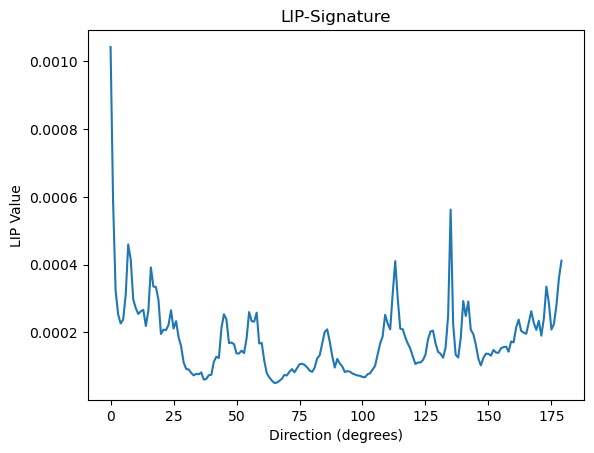

peaks=array([90])


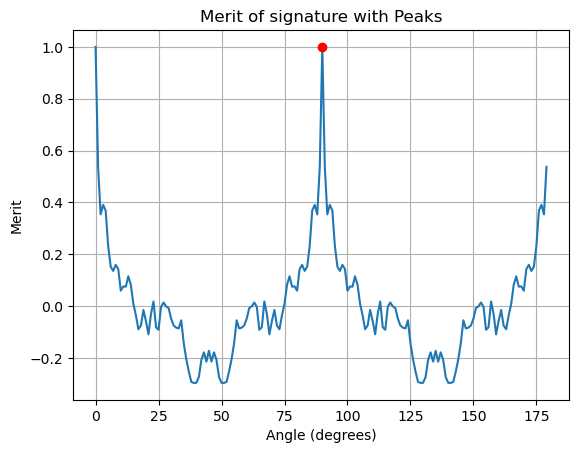

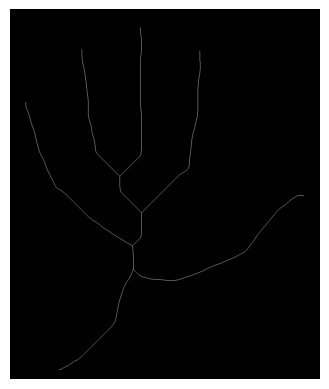

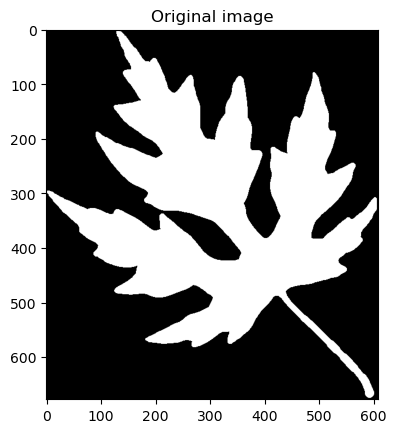

- Image


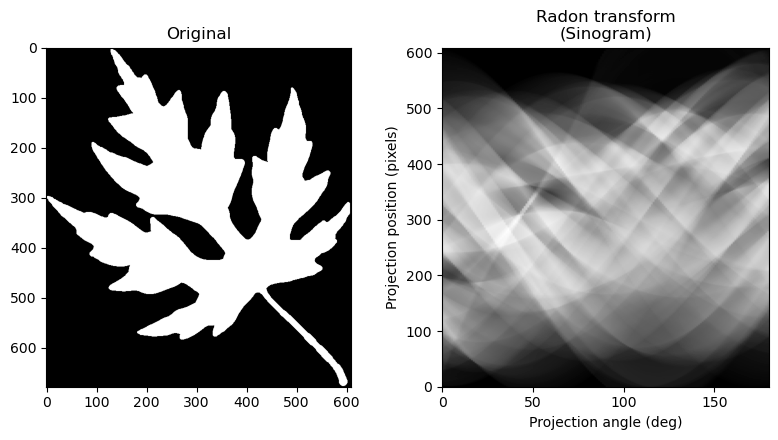

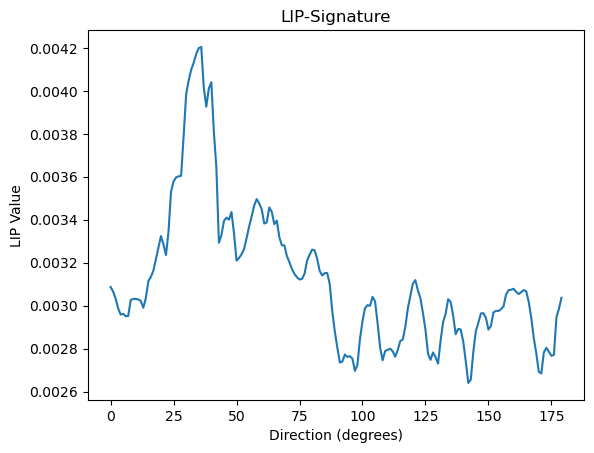

peaks=array([90])


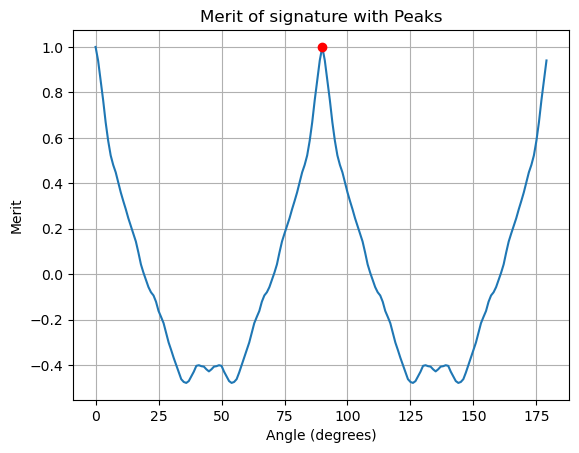

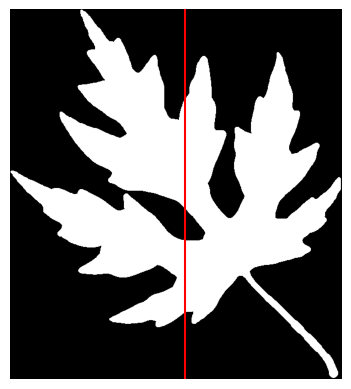

- Skeleton


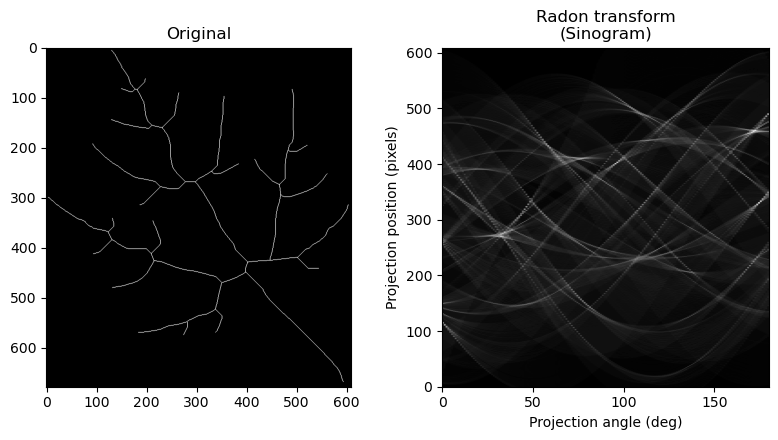

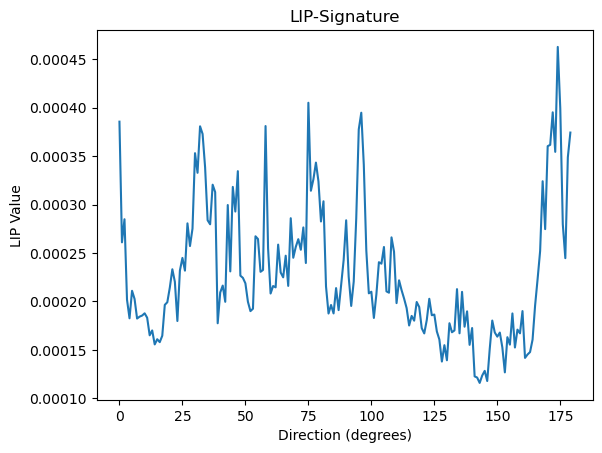

peaks=array([90])


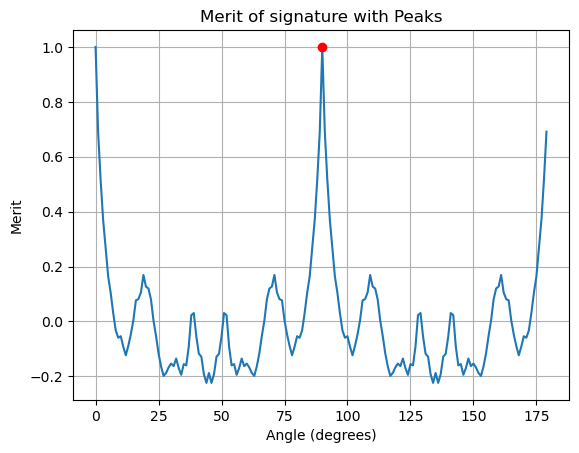

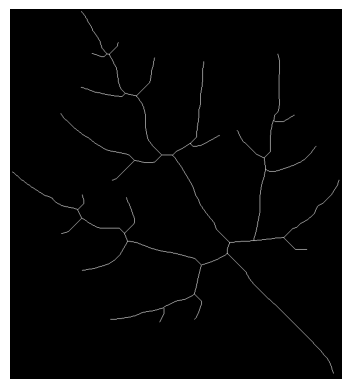

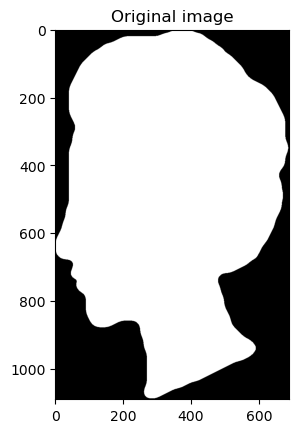

- Image


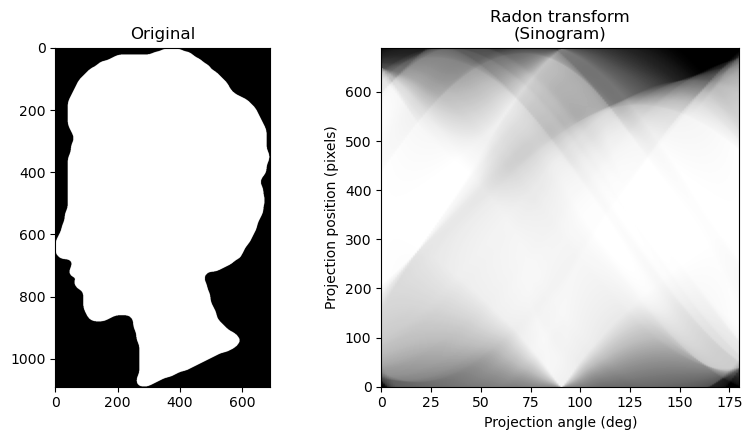

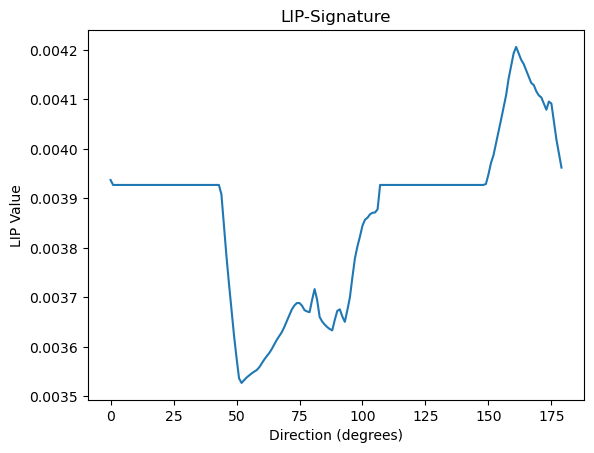

peaks=array([90])


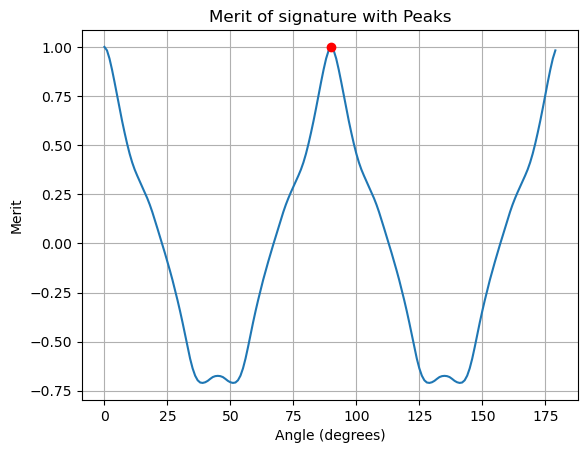

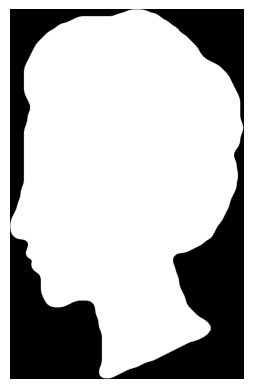

- Skeleton


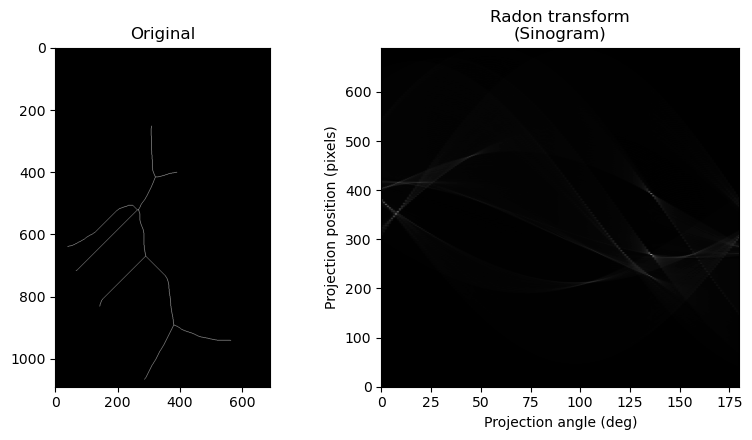

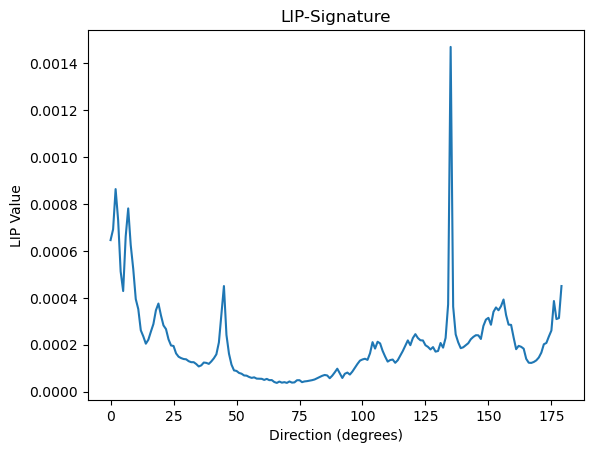

peaks=array([90])


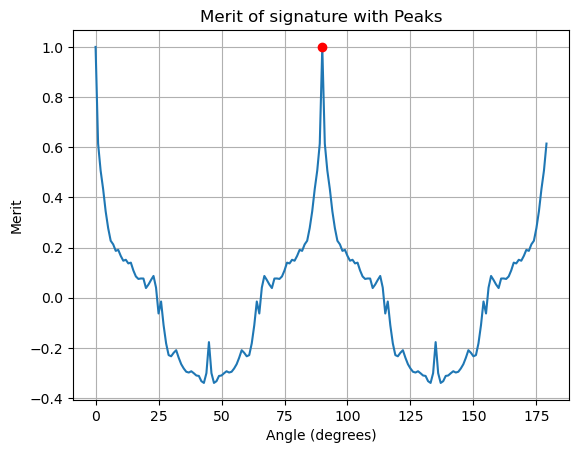

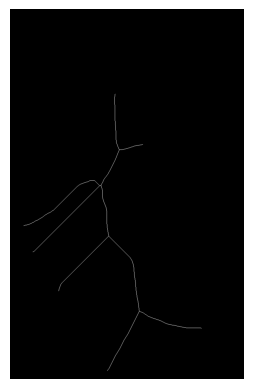

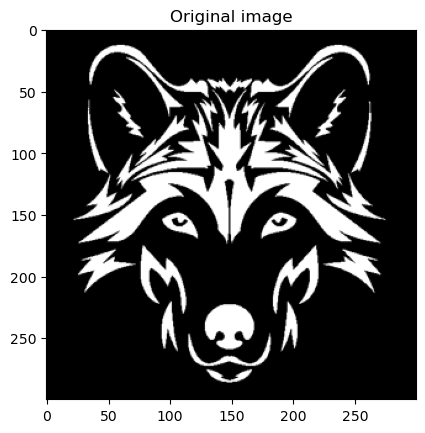

- Image


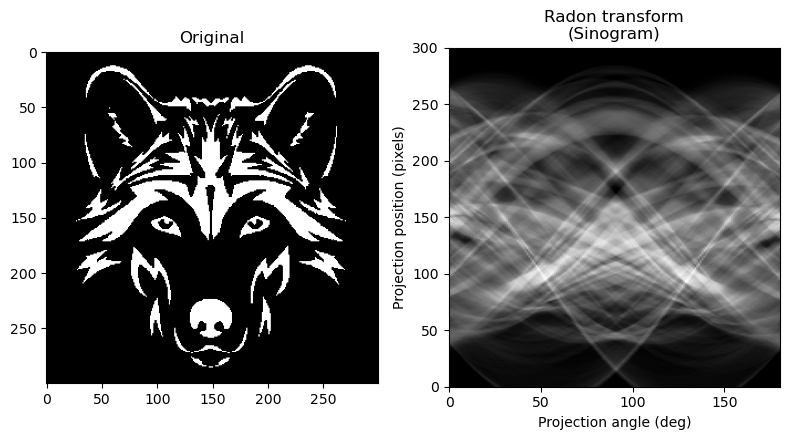

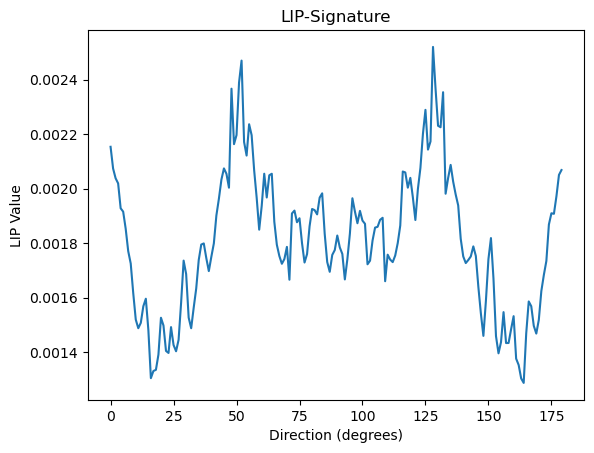

peaks=array([90])


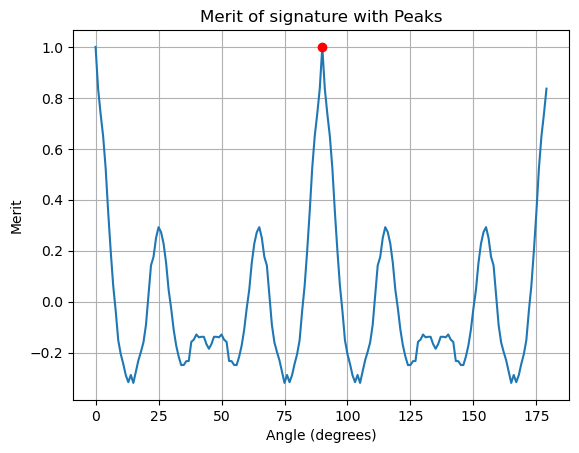

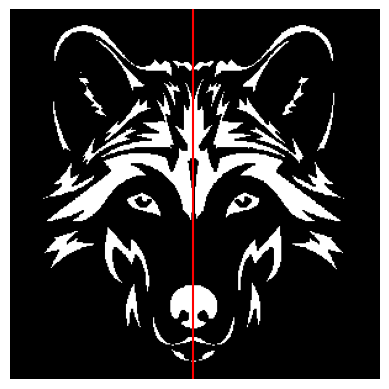

- Skeleton


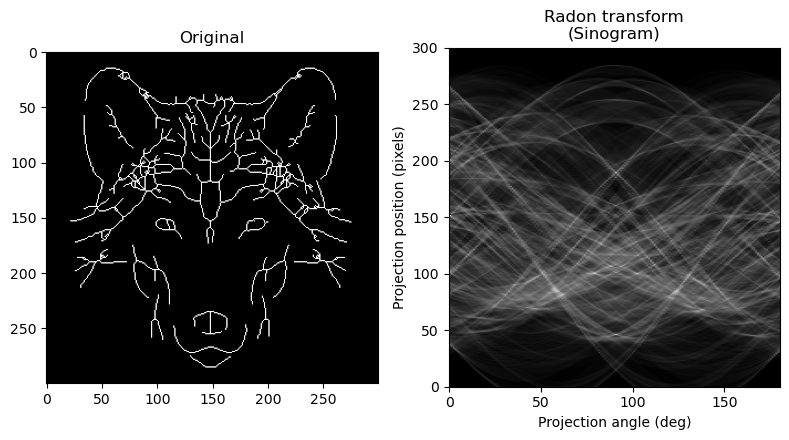

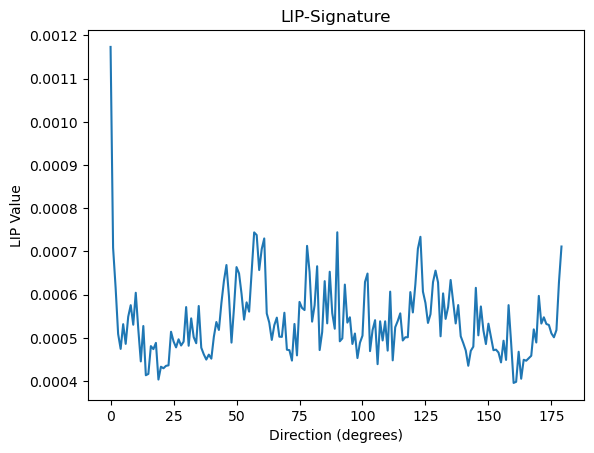

peaks=array([90])


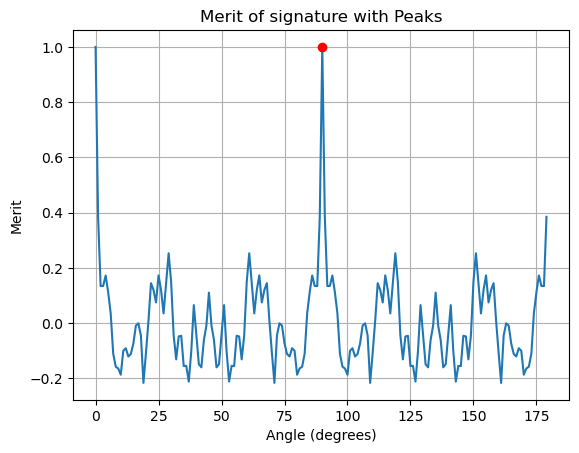

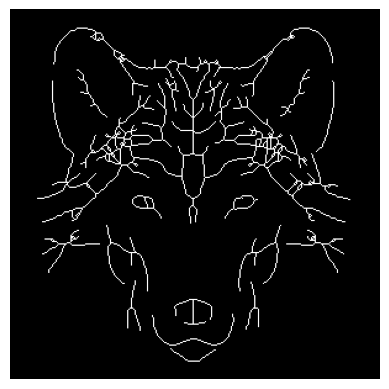

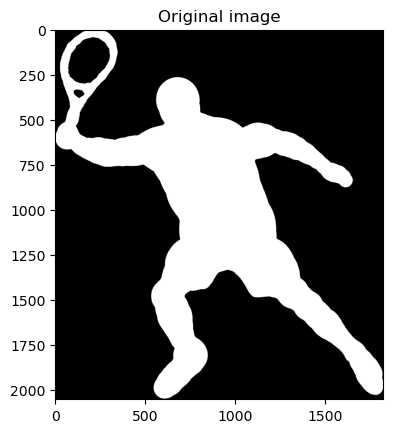

- Image


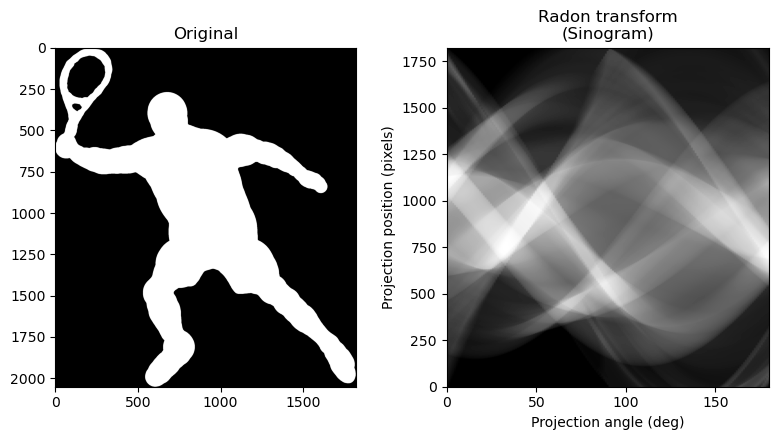

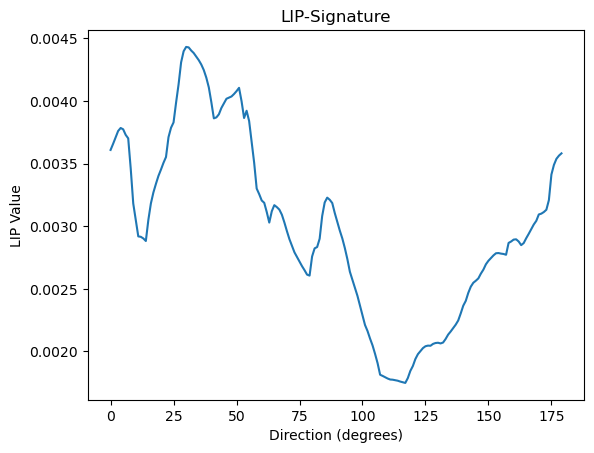

peaks=array([90])


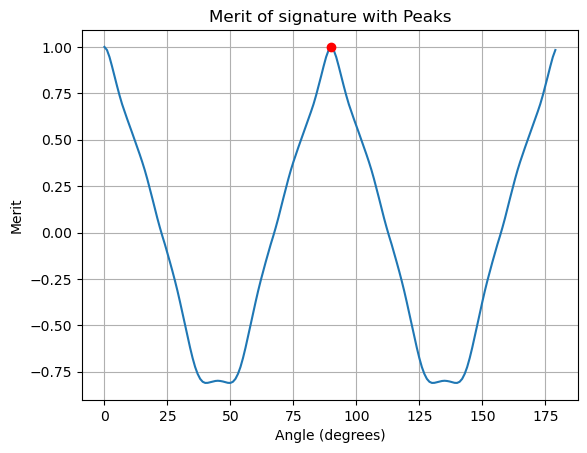

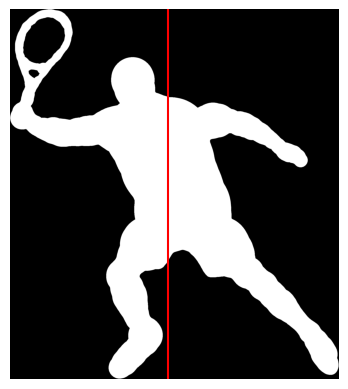

- Skeleton


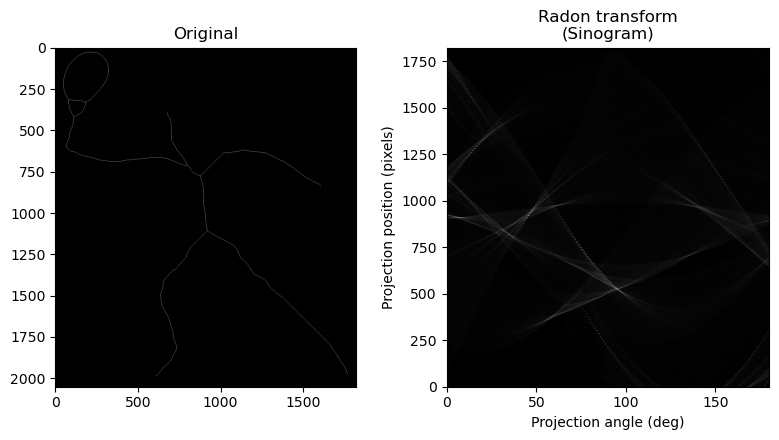

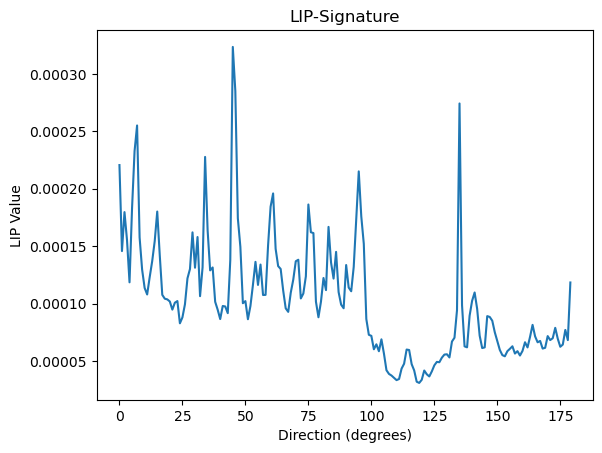

peaks=array([90])


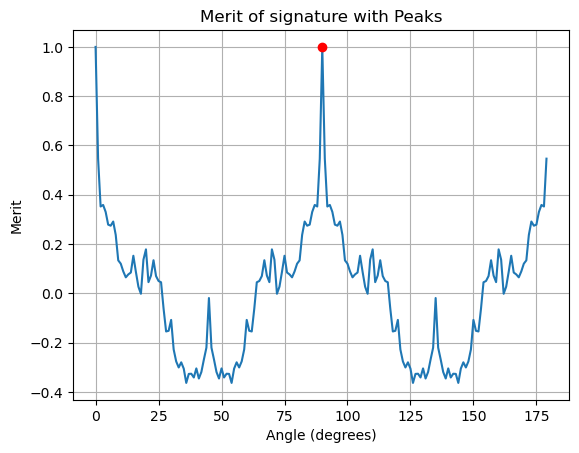

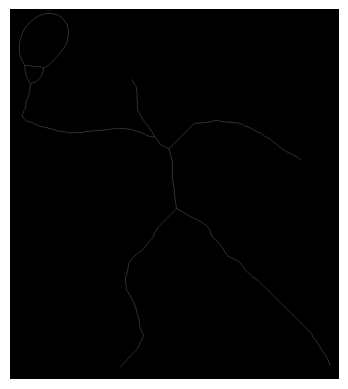

In [239]:
import pandas as pd

tau = 0.4 # Threshold

metrics_images_sift = pd.DataFrame()
metrics_skeletons_sift = pd.DataFrame()

# Execution on original images
for image, skeleton in zip(images,skeletons):
    plt.imshow(image, cmap=plt.cm.gray)
    plt.title("Original image")
    plt.show()

    print("- Image")
    mirror = SignatureSymmetry(image, tau)
    mirror.run()

    print("- Skeleton")
    mirror = SignatureSymmetry(skeleton, tau)
    mirror.run()

#### 5.1.2 Signature implementation (using R-signature)

Now, we will use R-signature.

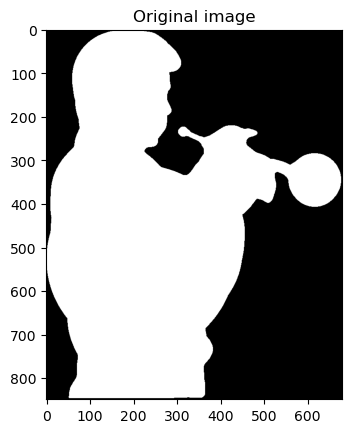

- Image


/home/user/miniconda3/envs/cv2/lib/python3.10/site-packages/skimage/transform/radon_transform.py:75: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn('Radon transform: image must be zero outside the '


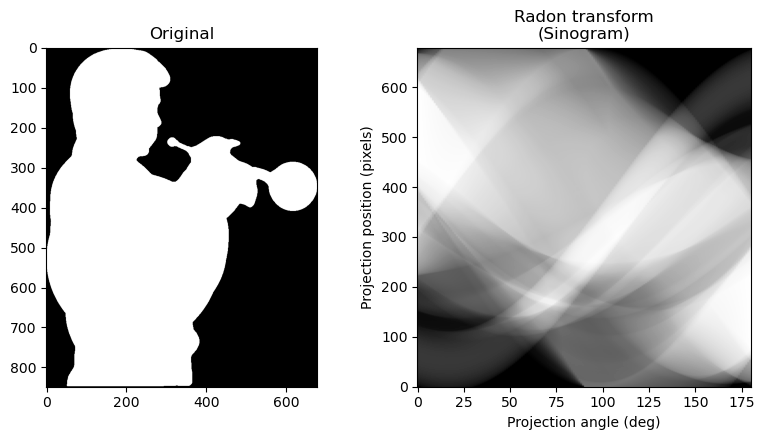

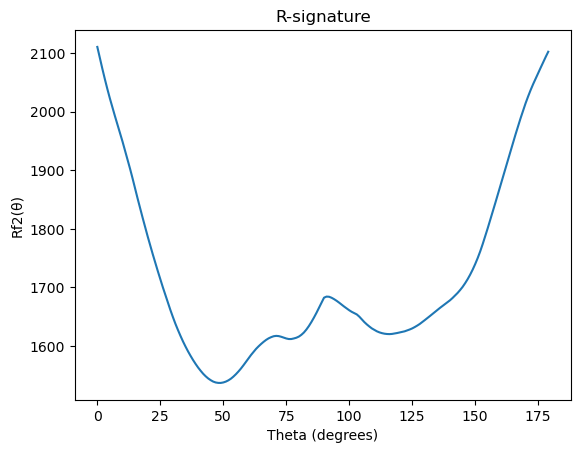

peaks=array([90])


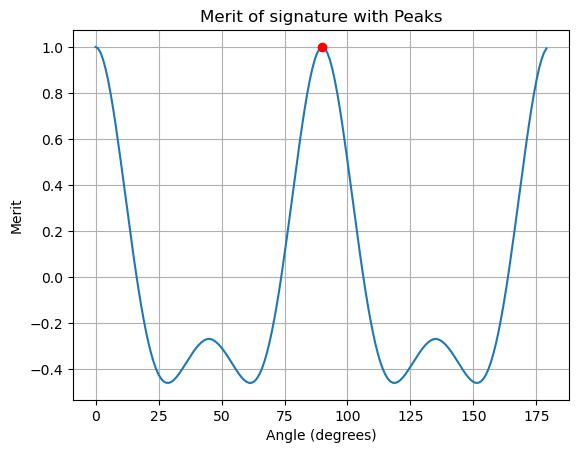

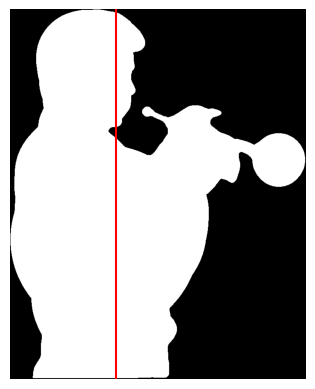

- Skeleton


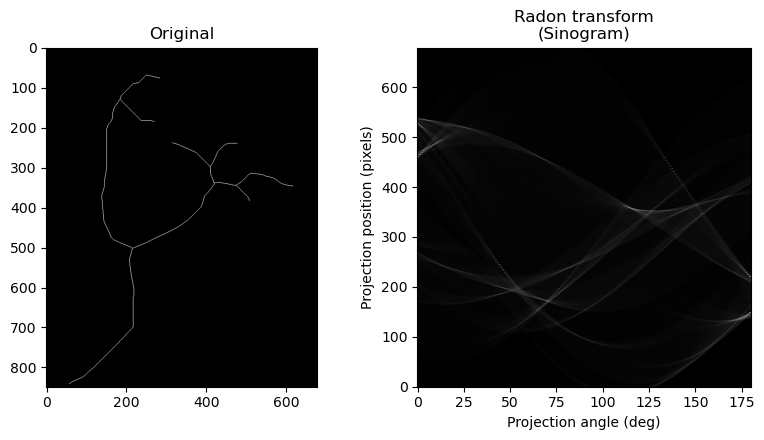

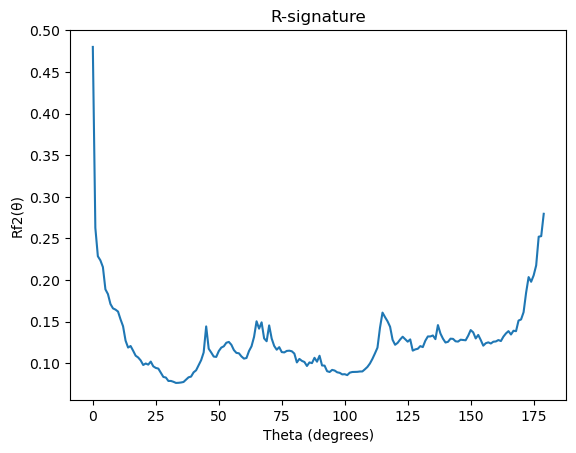

peaks=array([90])


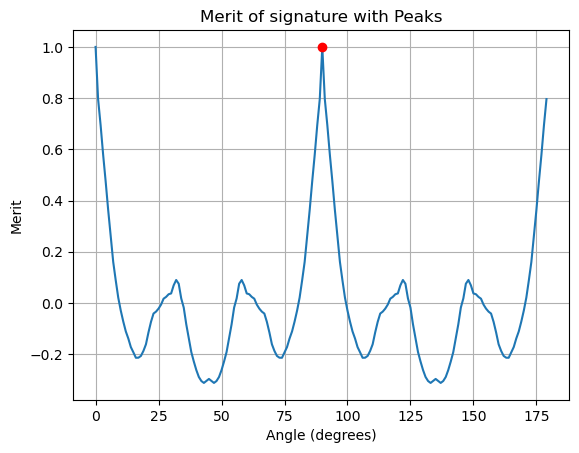

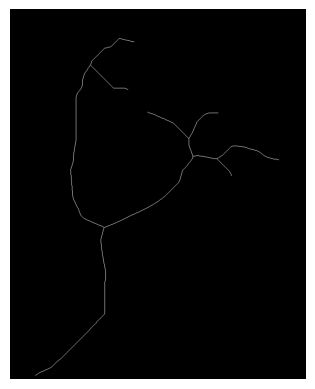

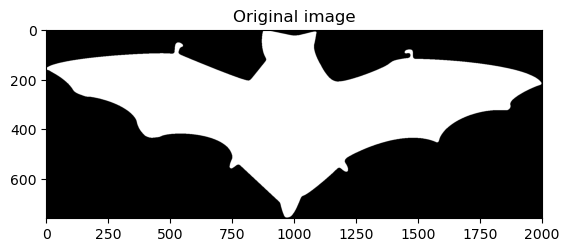

- Image


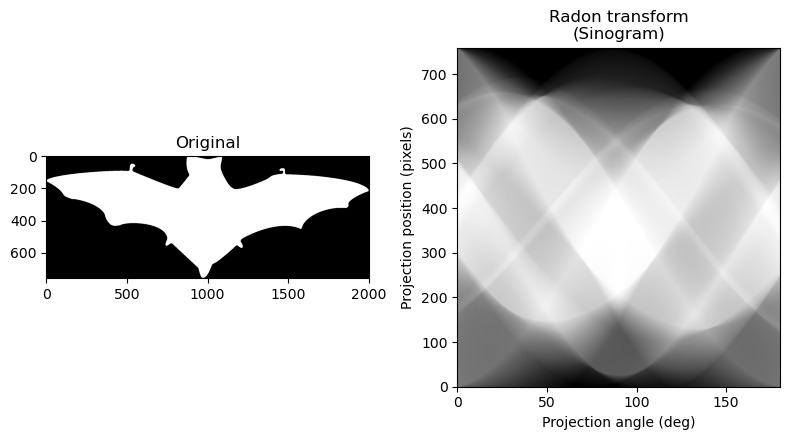

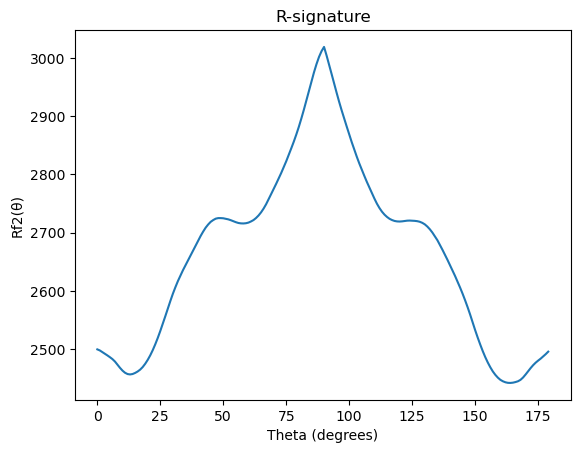

peaks=array([90])


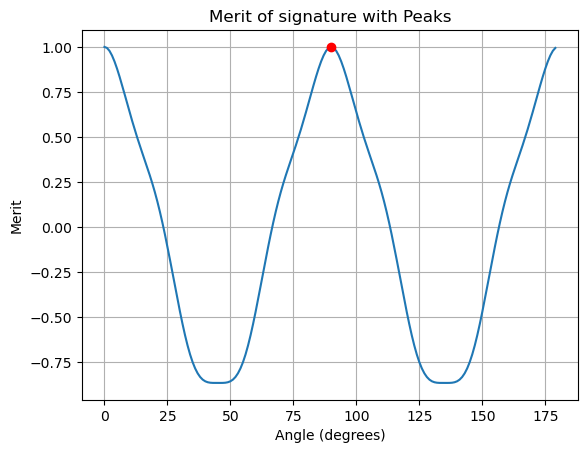

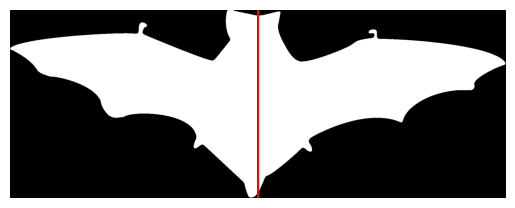

- Skeleton


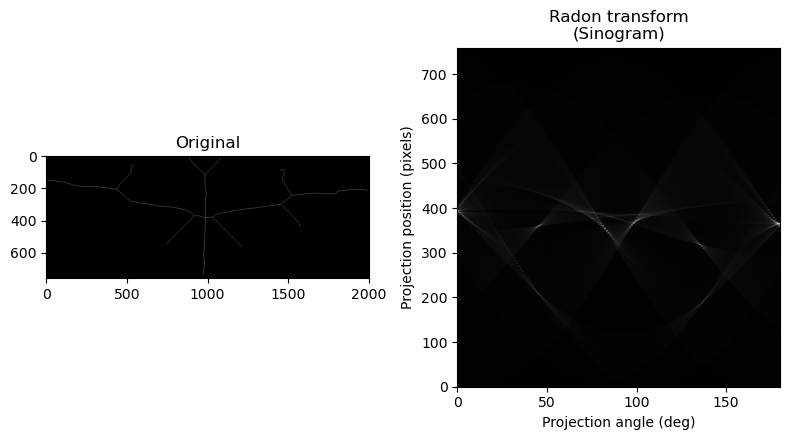

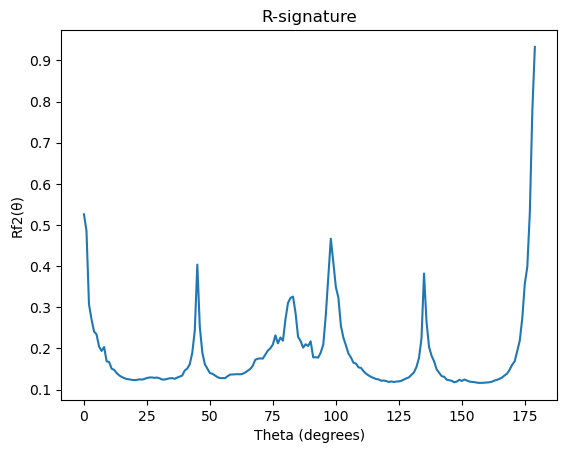

peaks=array([90])


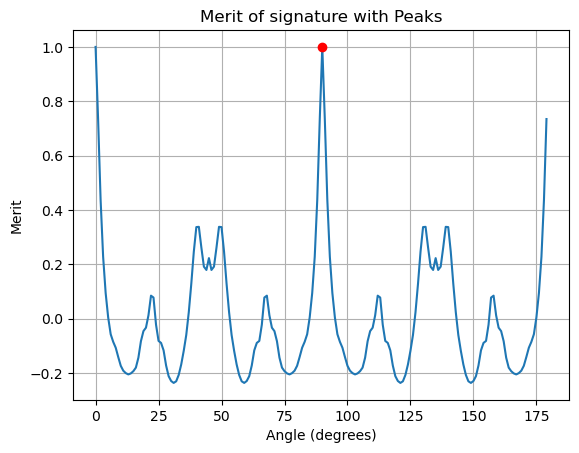

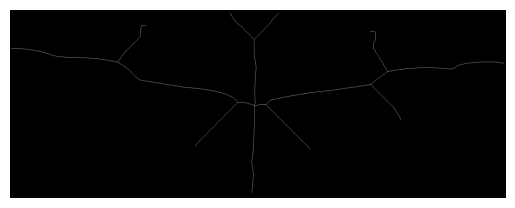

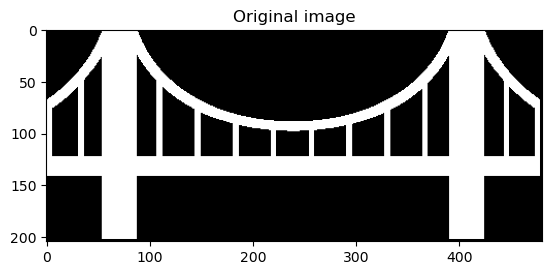

- Image


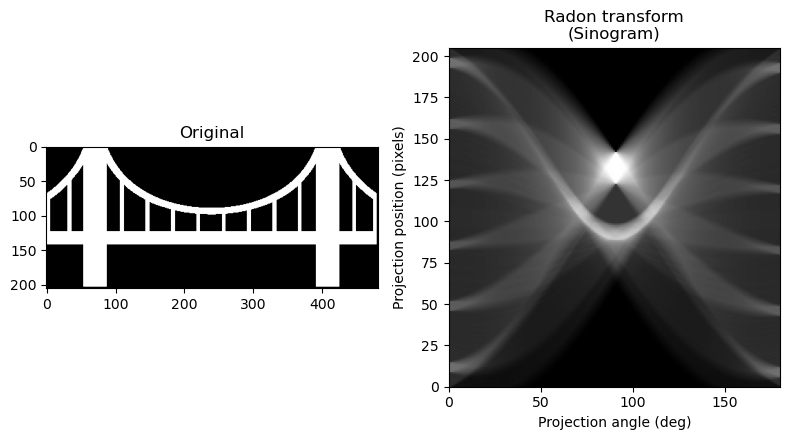

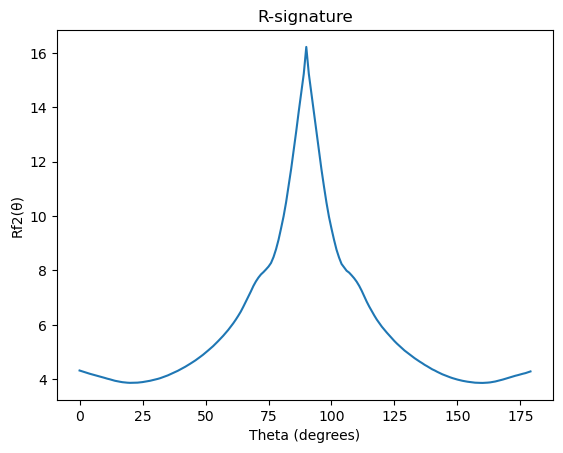

peaks=array([90])


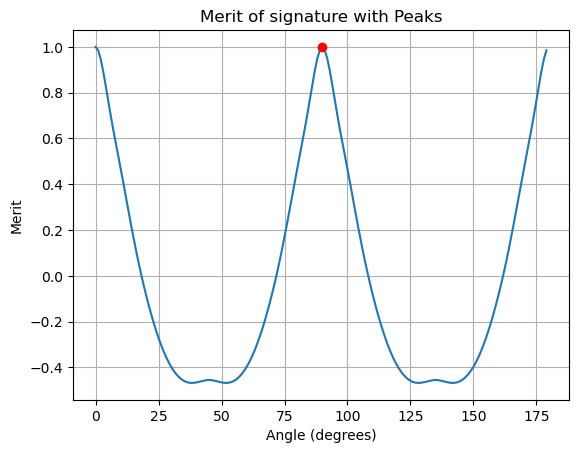

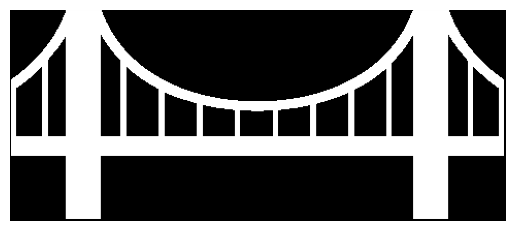

- Skeleton


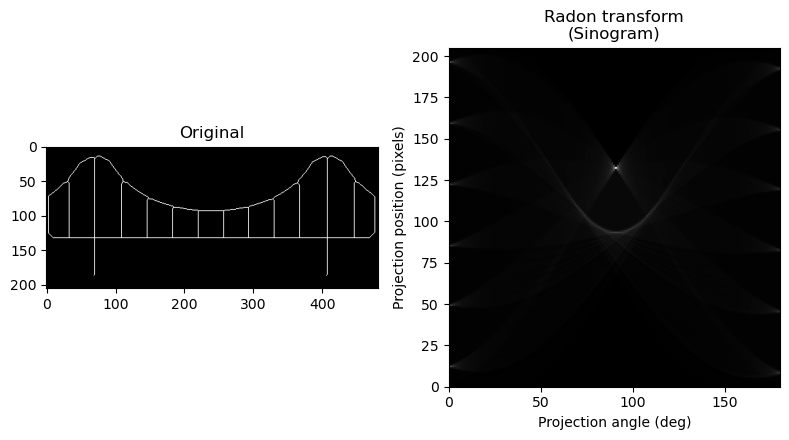

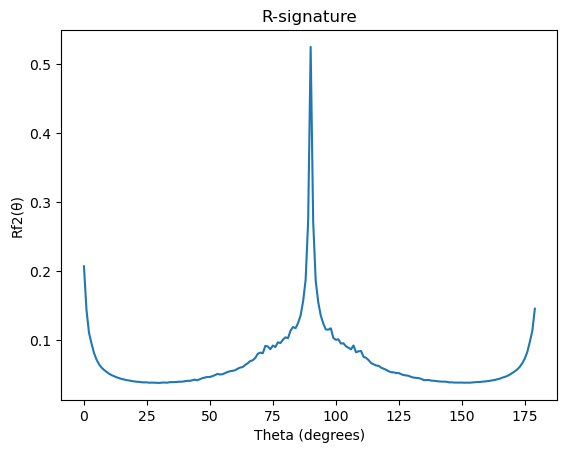

peaks=array([ 45,  90, 135])


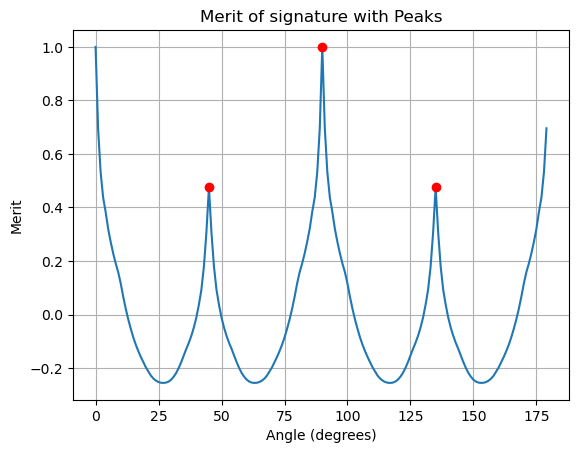

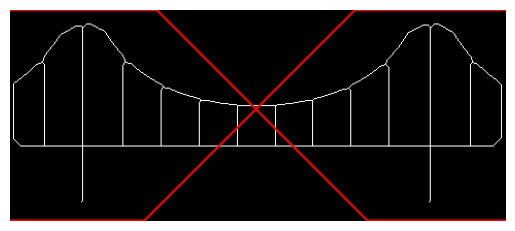

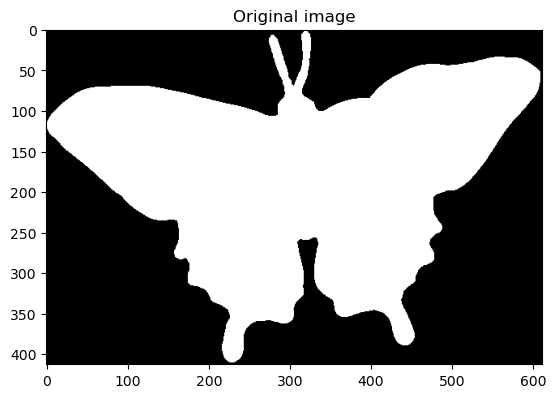

- Image


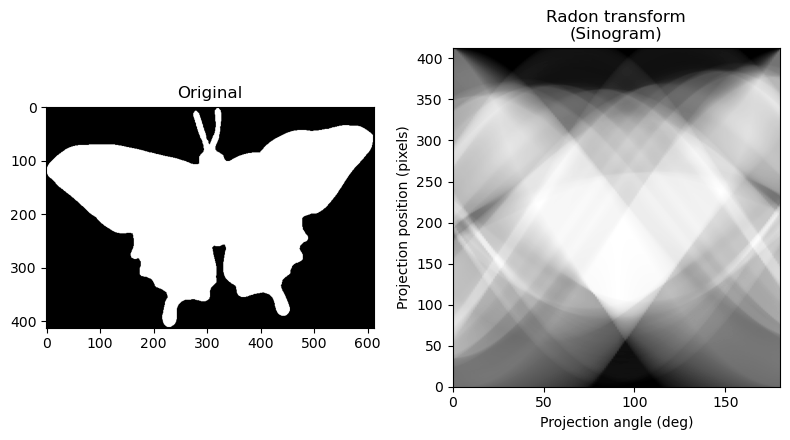

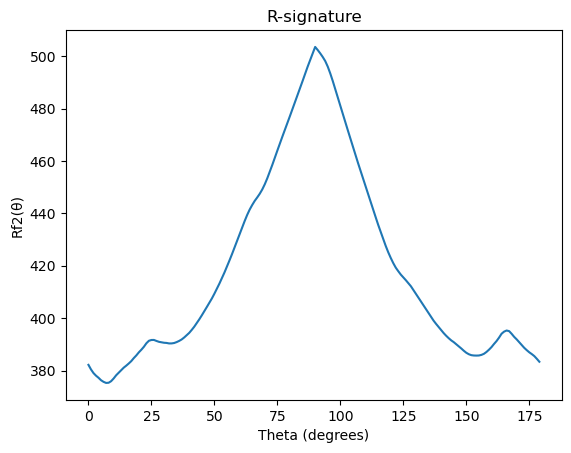

peaks=array([90])


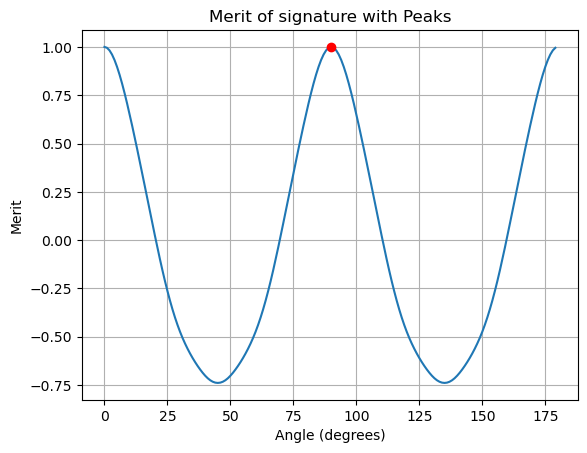

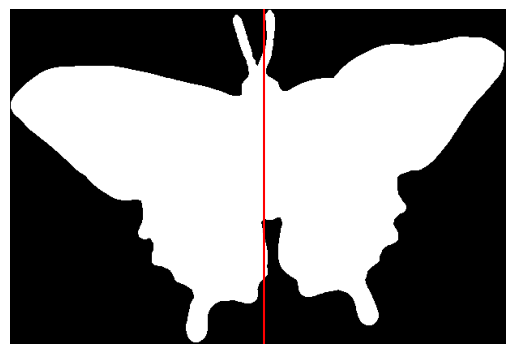

- Skeleton


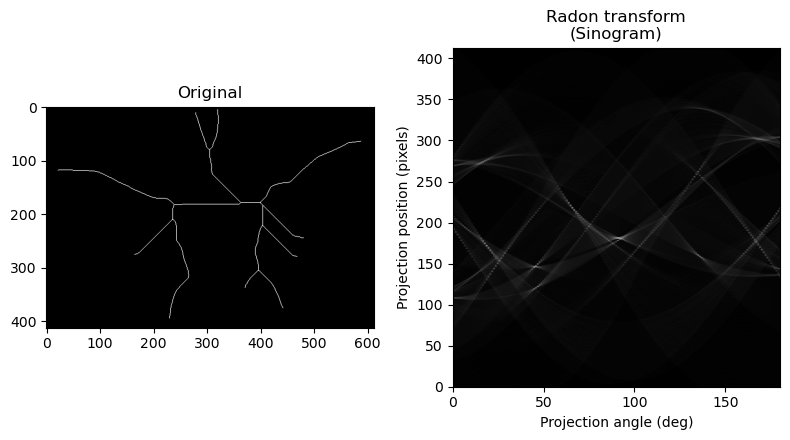

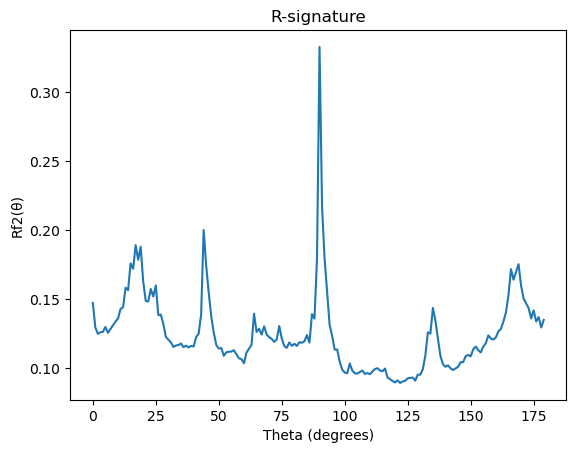

peaks=array([90])


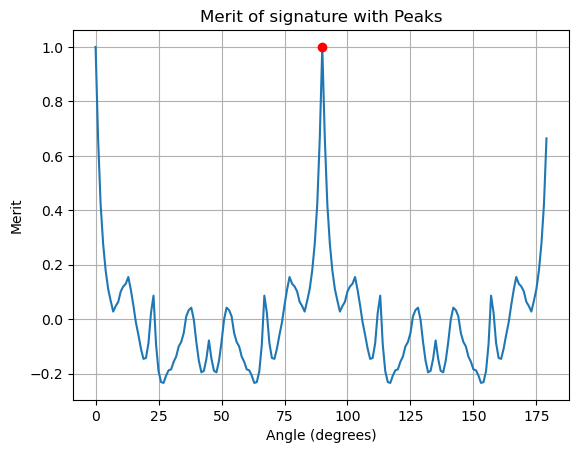

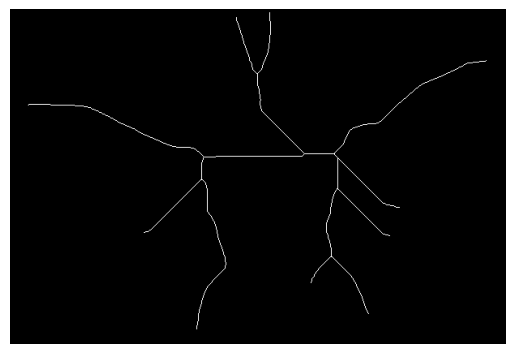

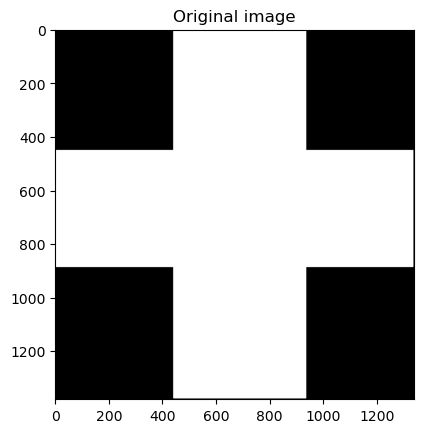

- Image


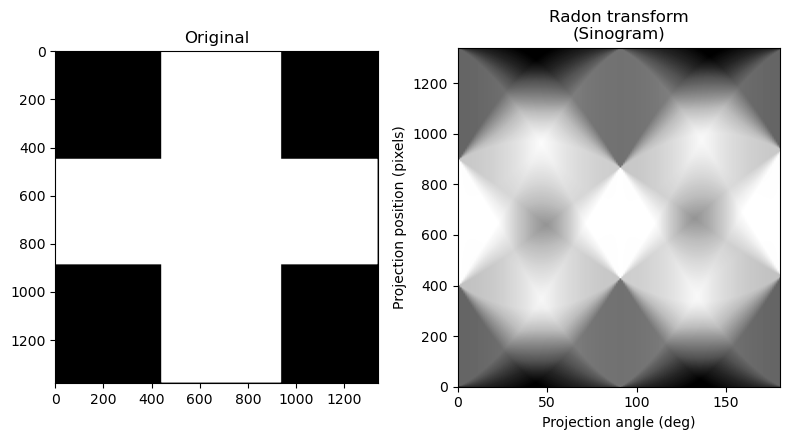

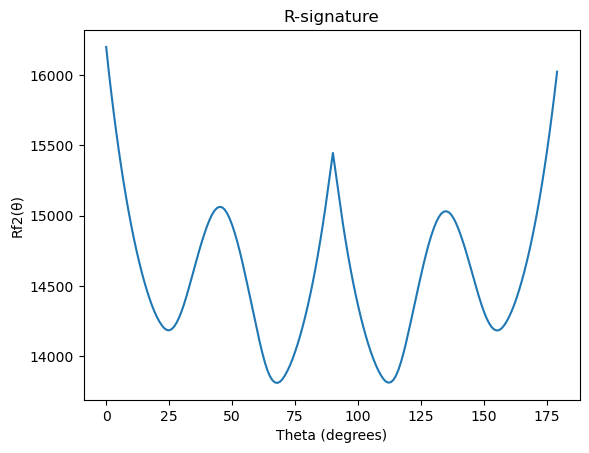

peaks=array([ 22,  45,  68,  90, 112, 135, 158])


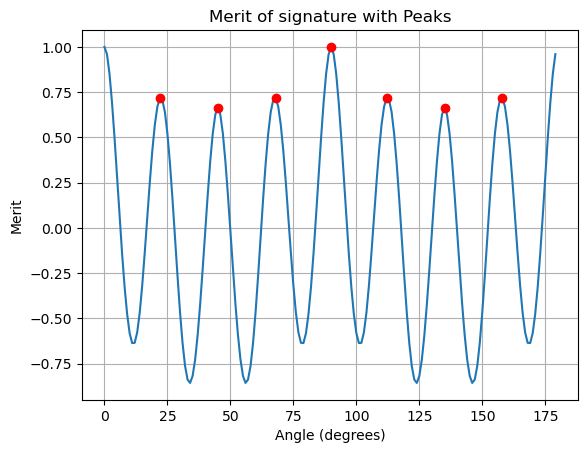

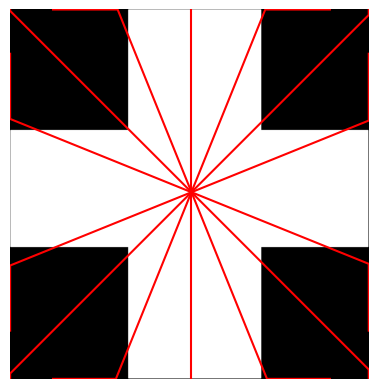

- Skeleton


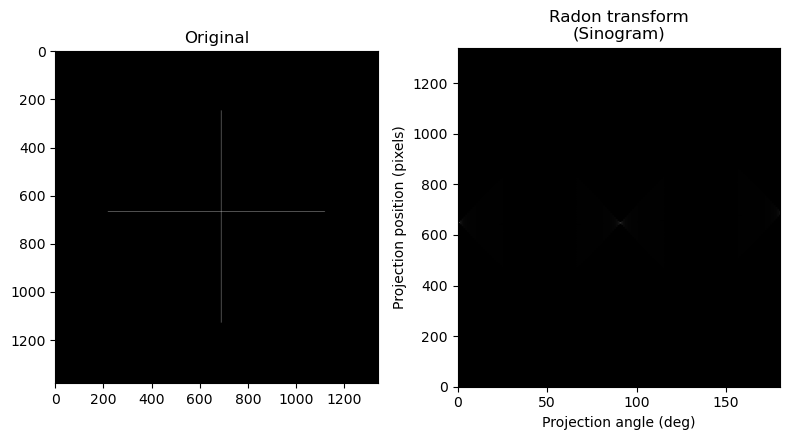

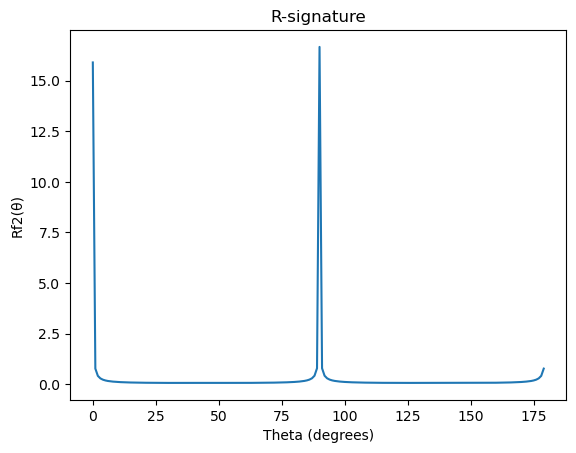

peaks=array([ 45,  90, 135])


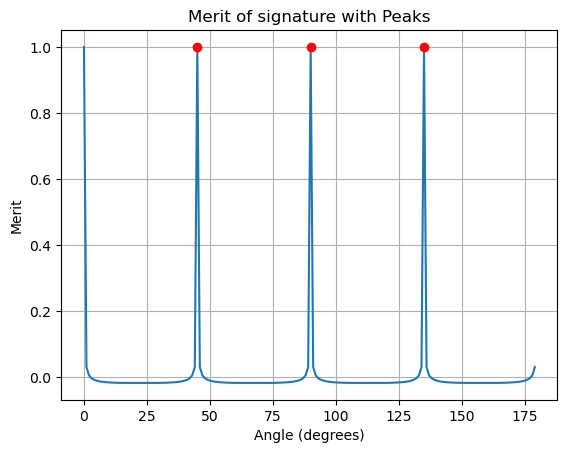

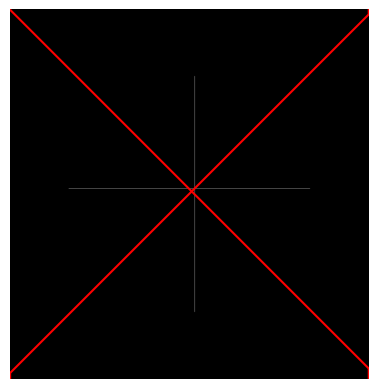

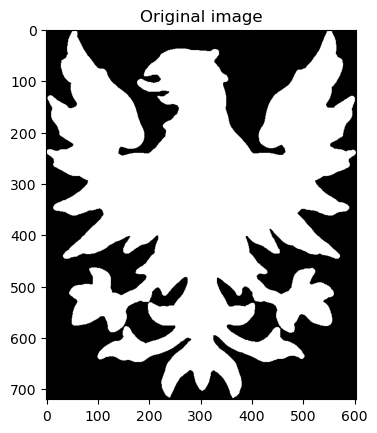

- Image


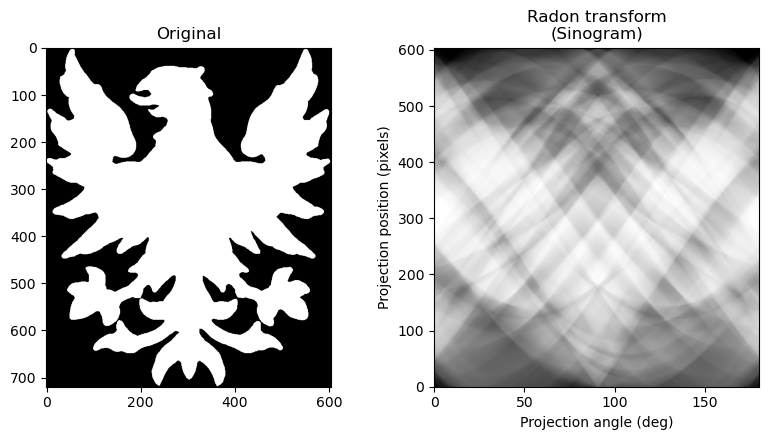

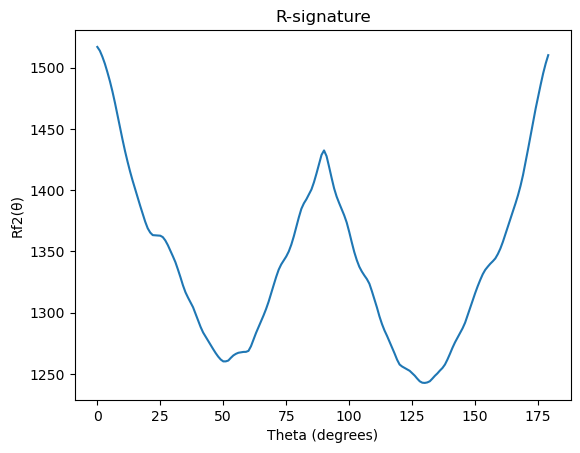

peaks=array([ 45,  90, 135])


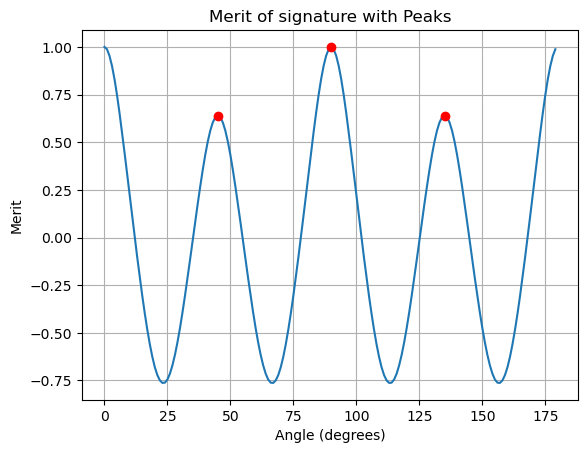

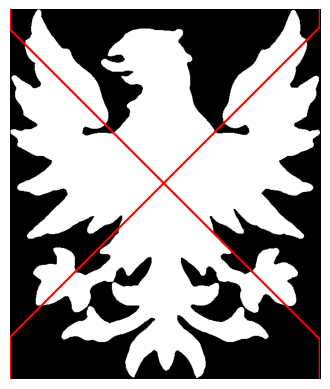

- Skeleton


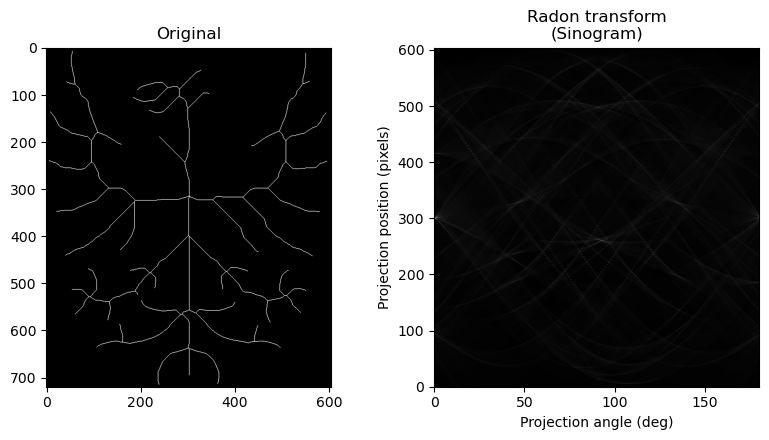

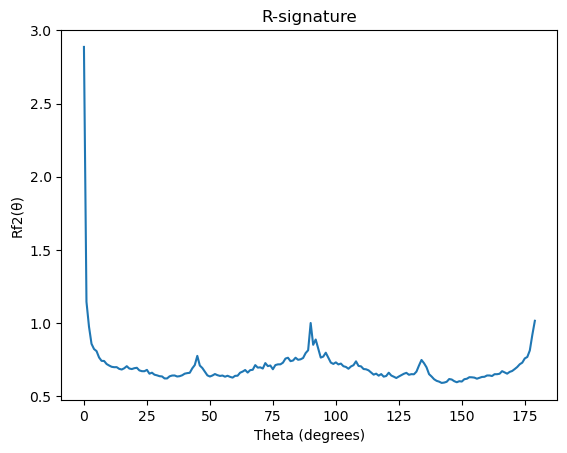

peaks=array([90])


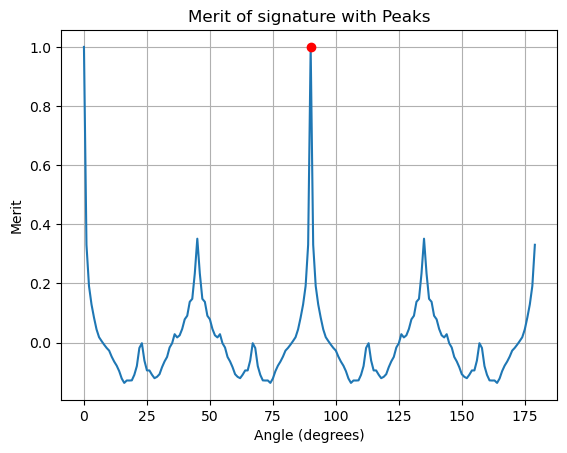

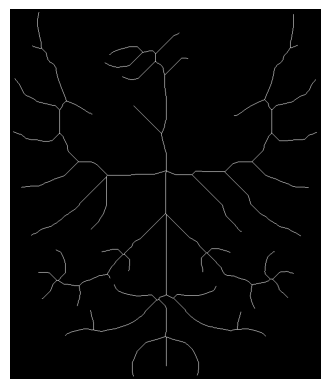

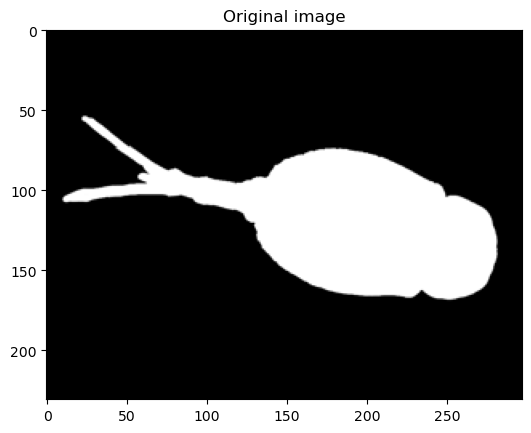

- Image


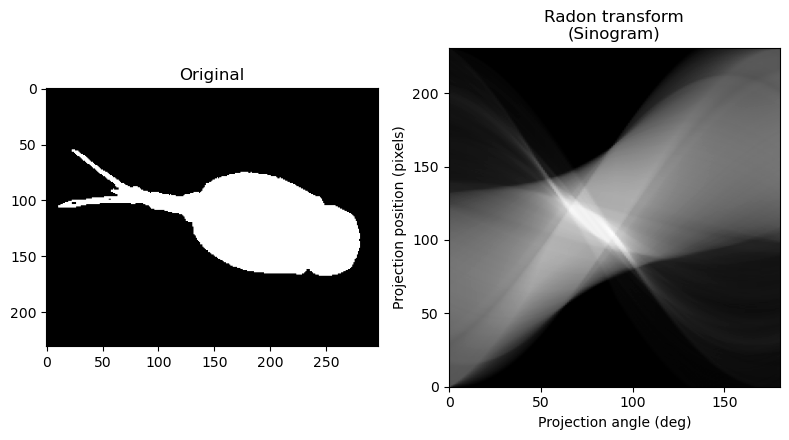

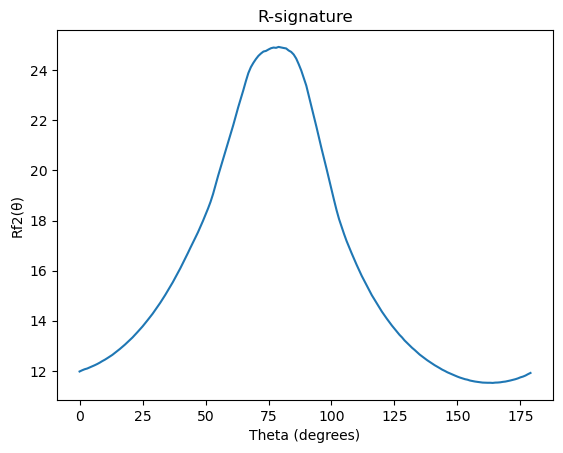

peaks=array([90])


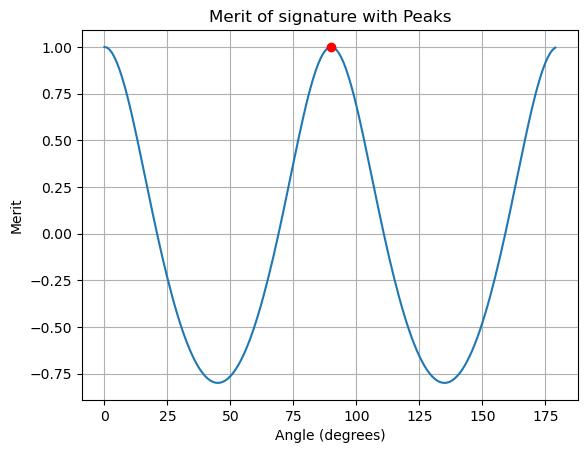

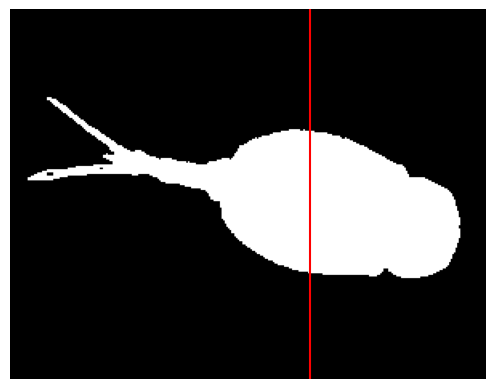

- Skeleton


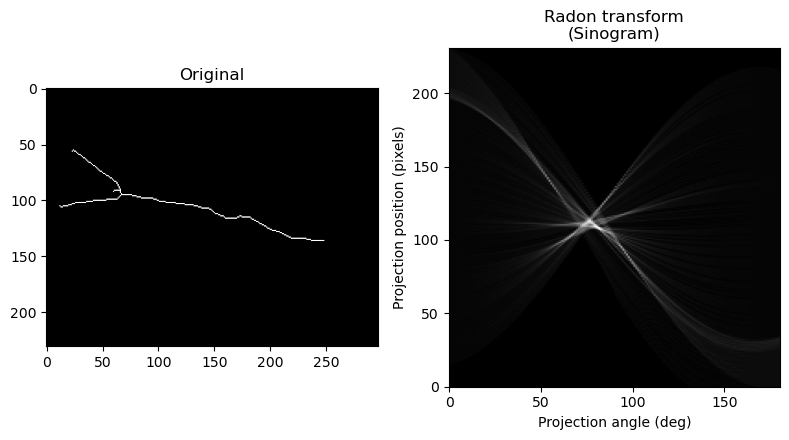

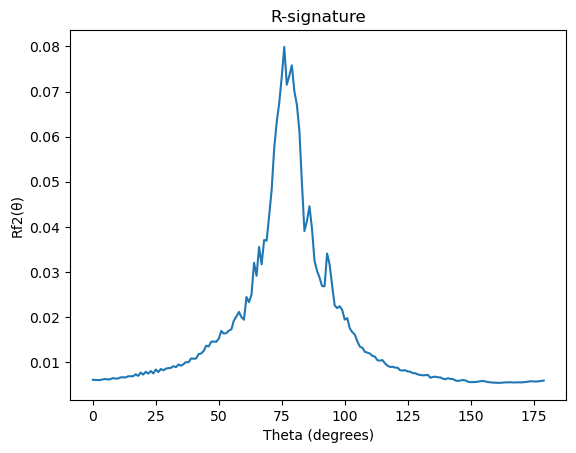

peaks=array([90])


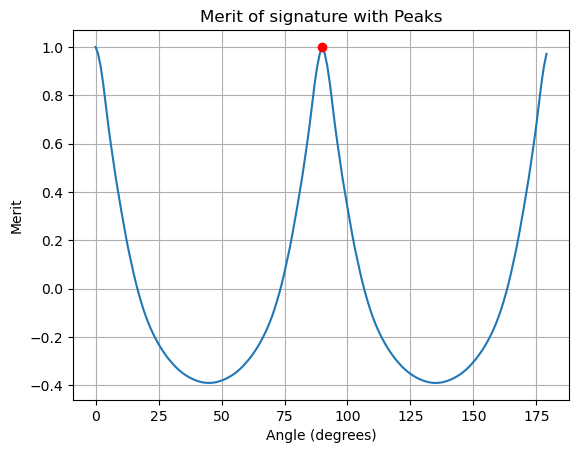

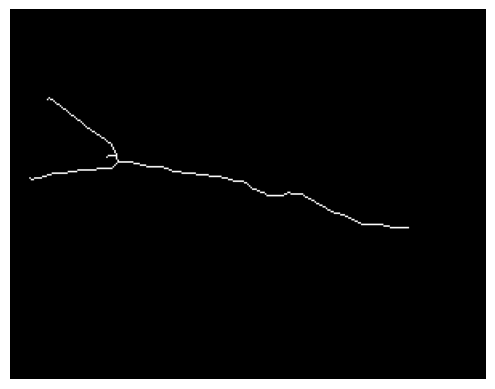

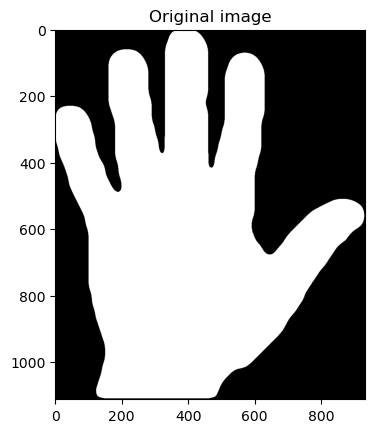

- Image


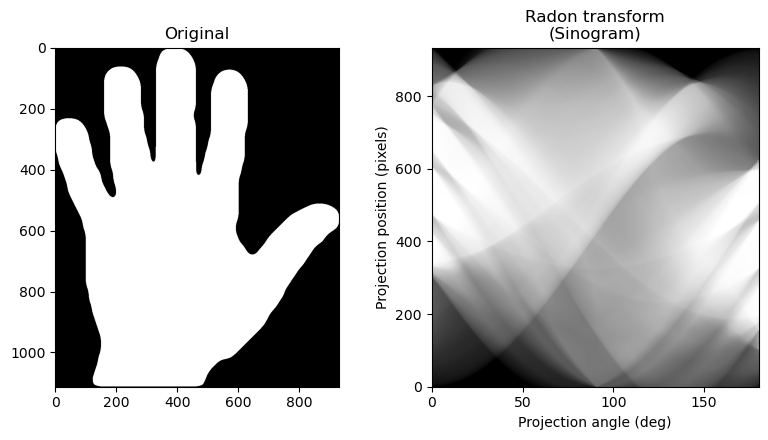

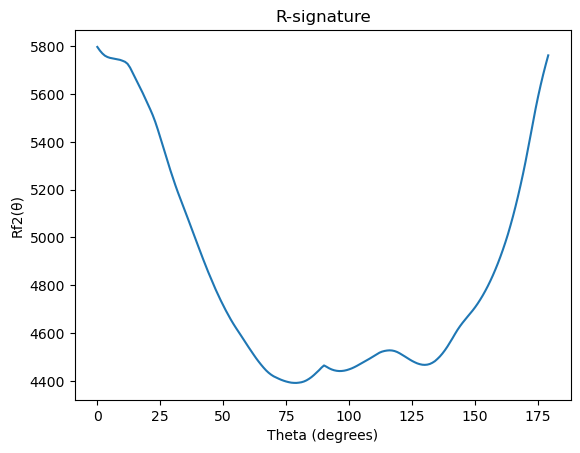

peaks=array([90])


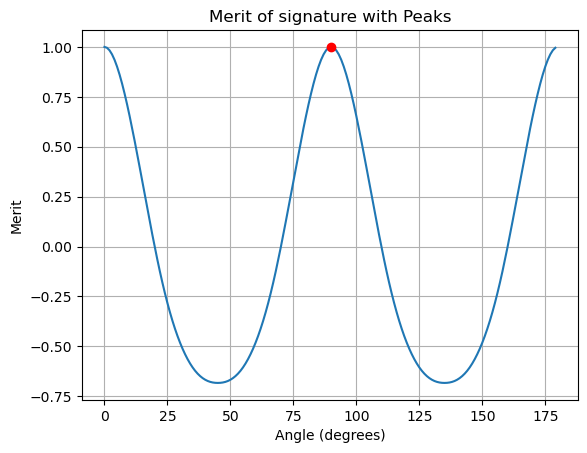

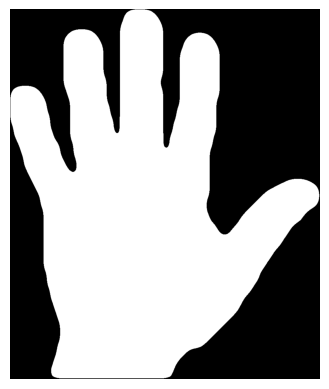

- Skeleton


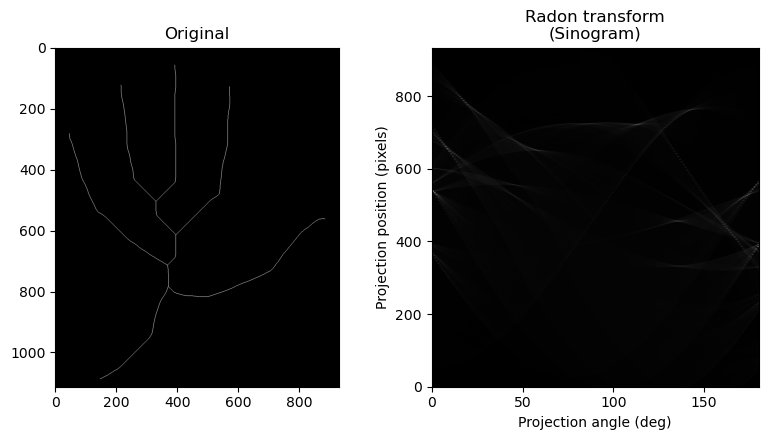

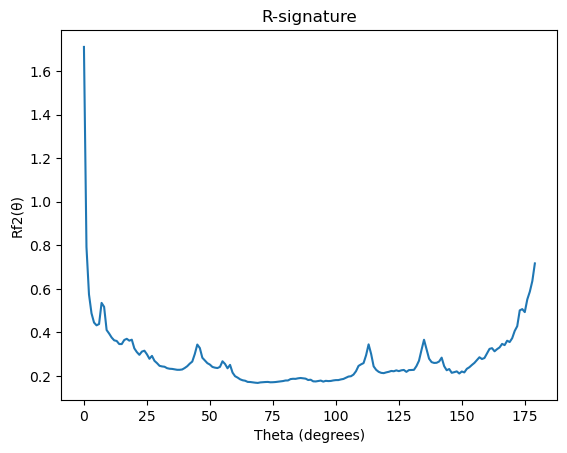

peaks=array([90])


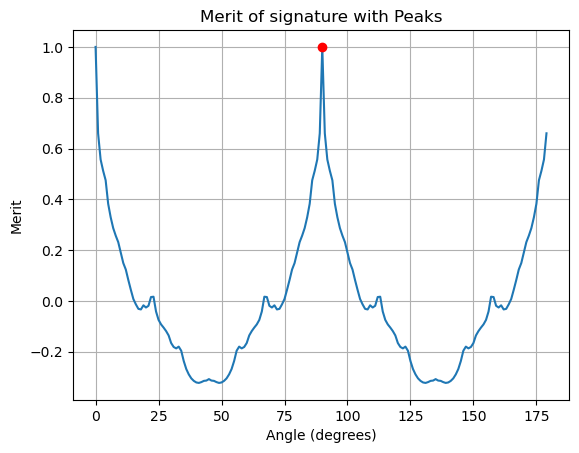

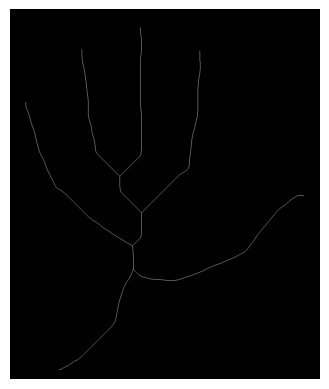

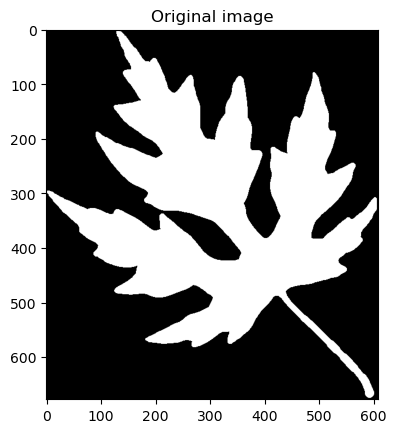

- Image


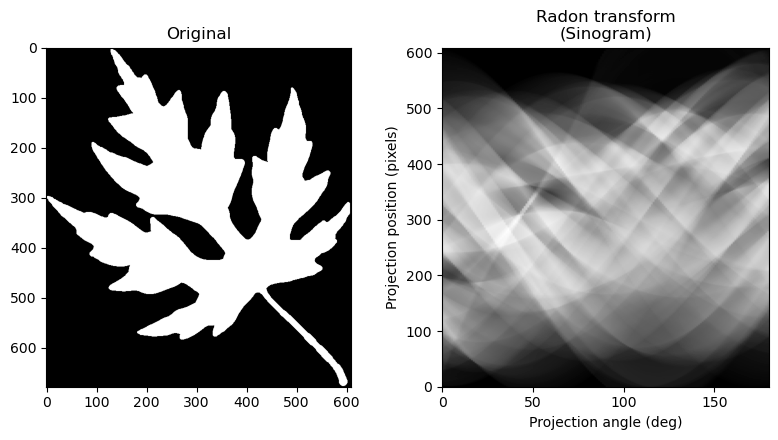

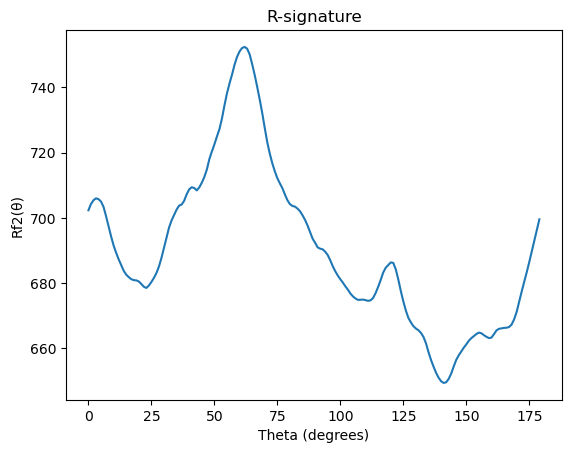

peaks=array([90])


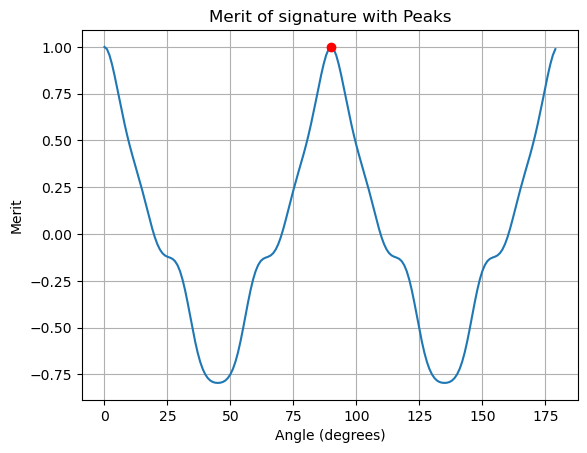

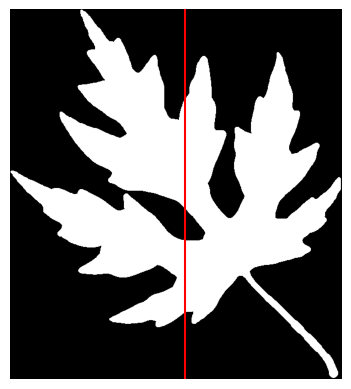

- Skeleton


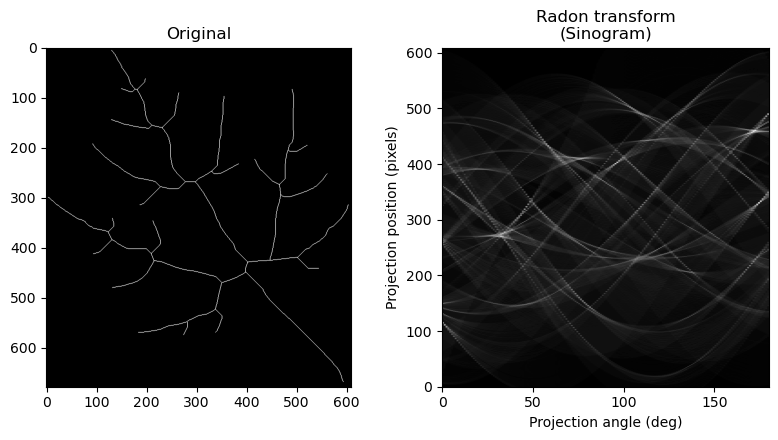

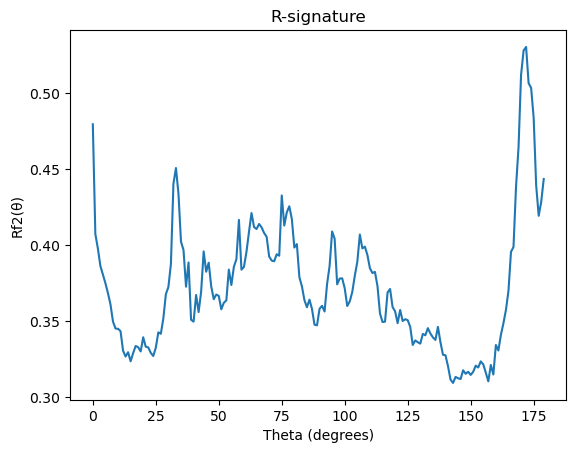

peaks=array([90])


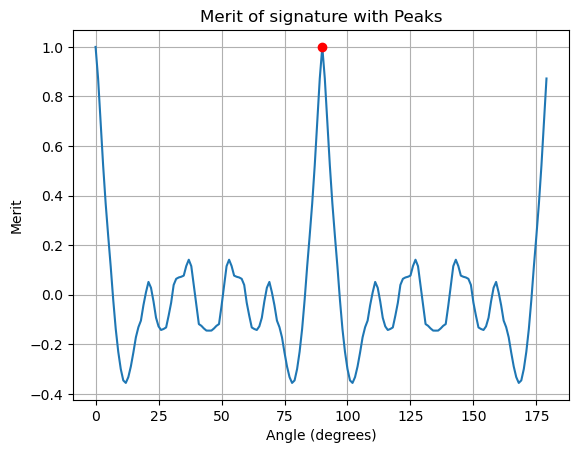

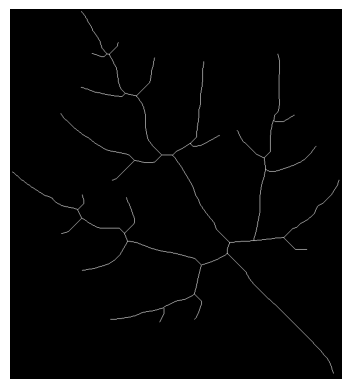

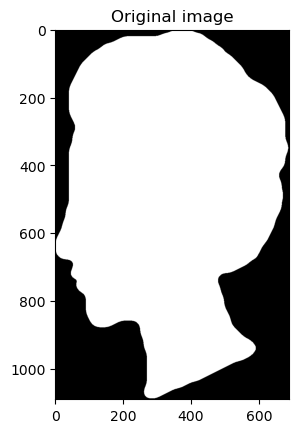

- Image


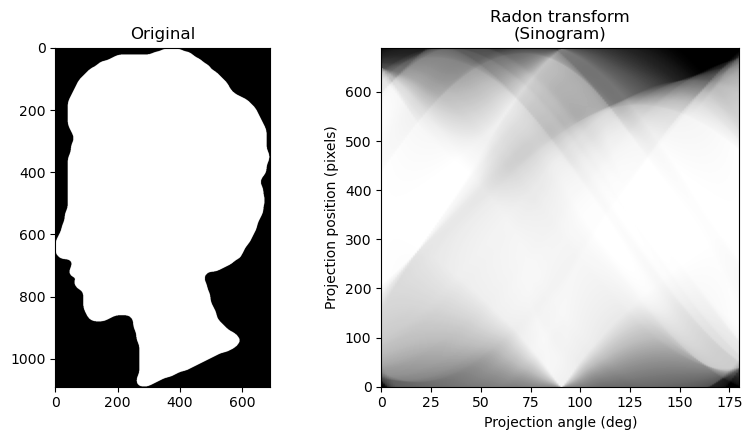

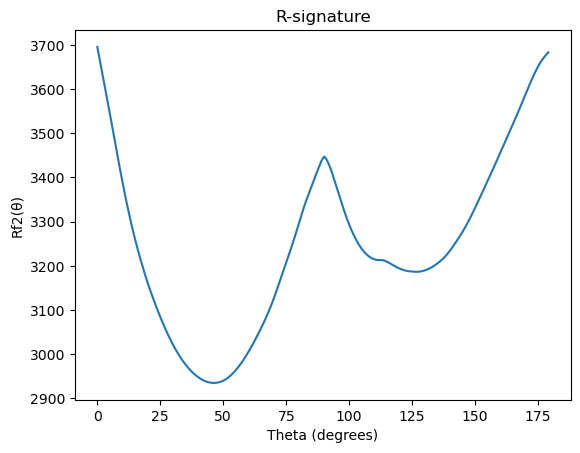

peaks=array([90])


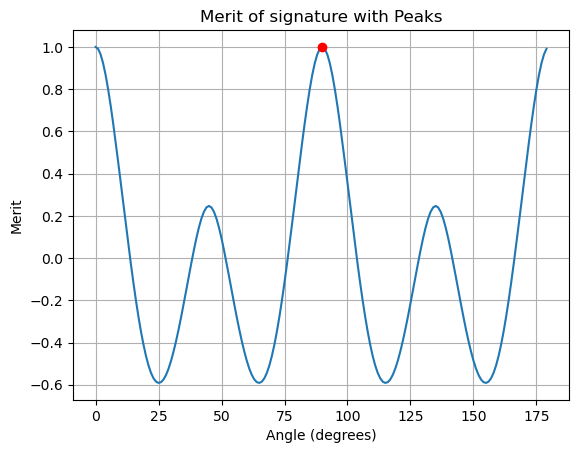

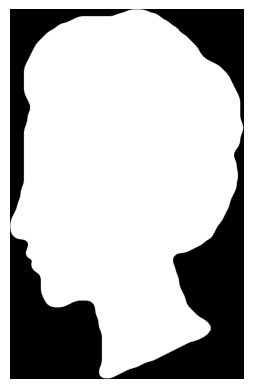

- Skeleton


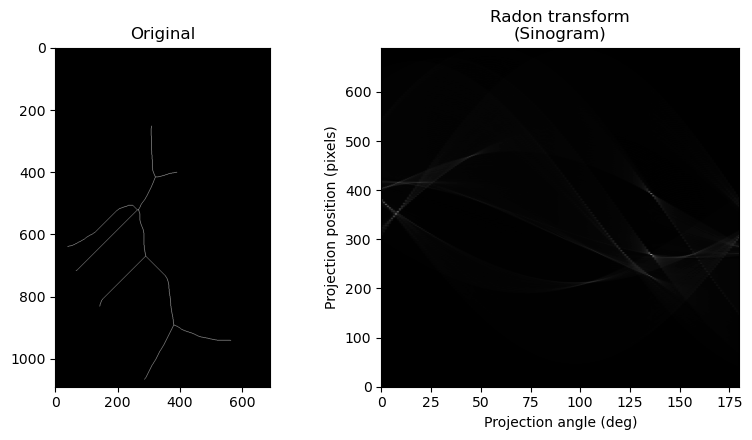

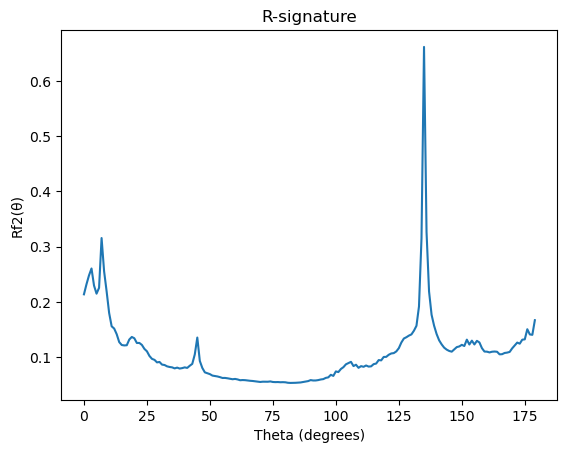

peaks=array([90])


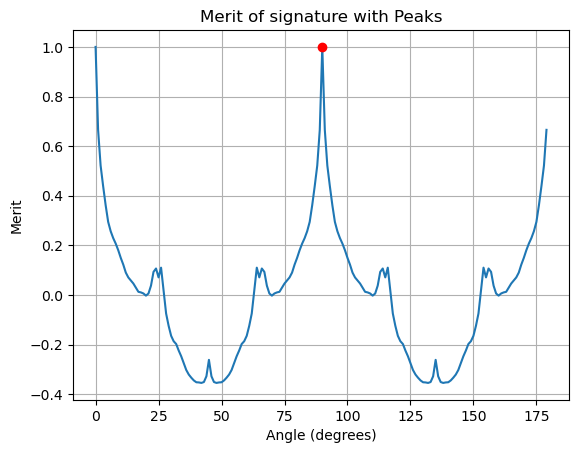

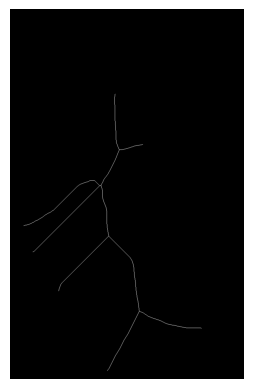

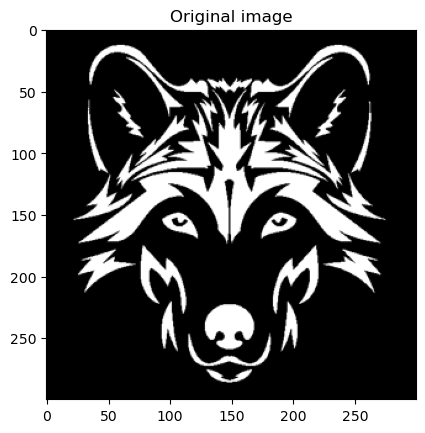

- Image


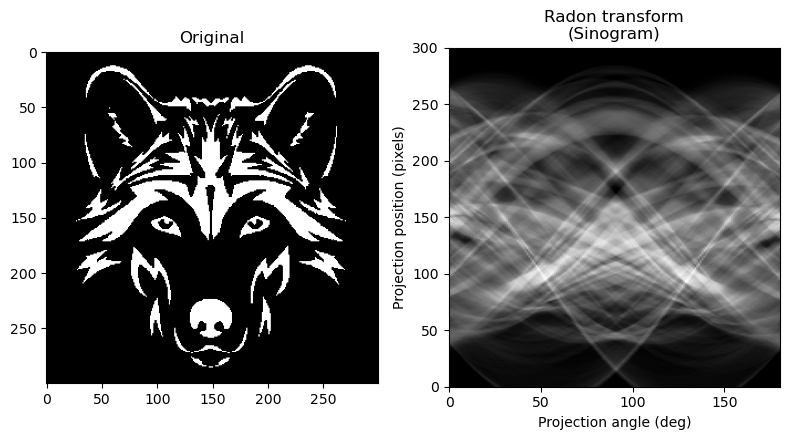

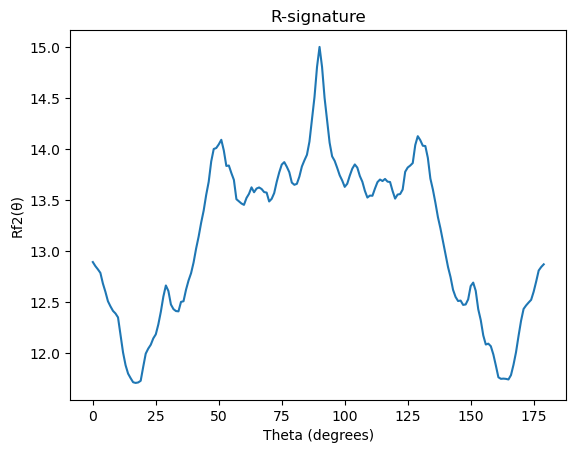

peaks=array([90])


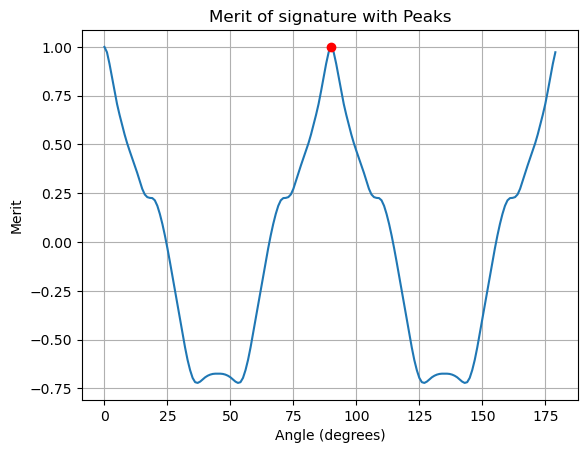

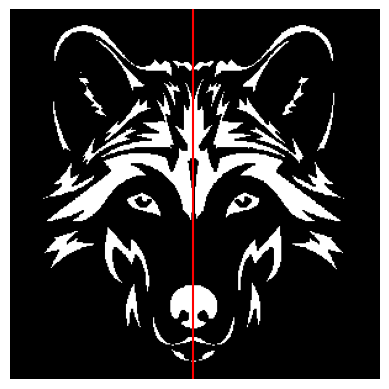

- Skeleton


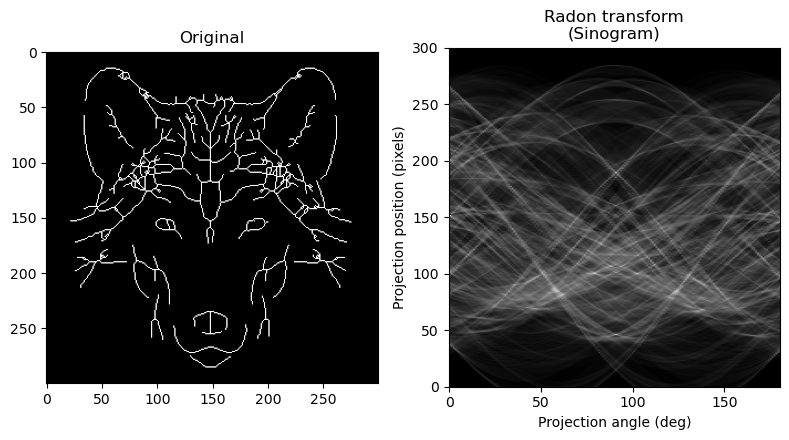

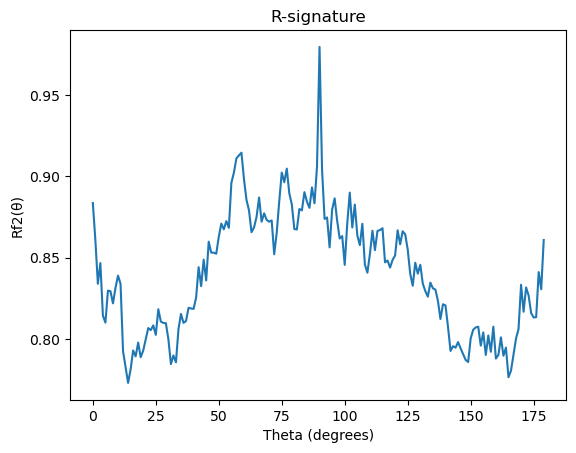

peaks=array([90])


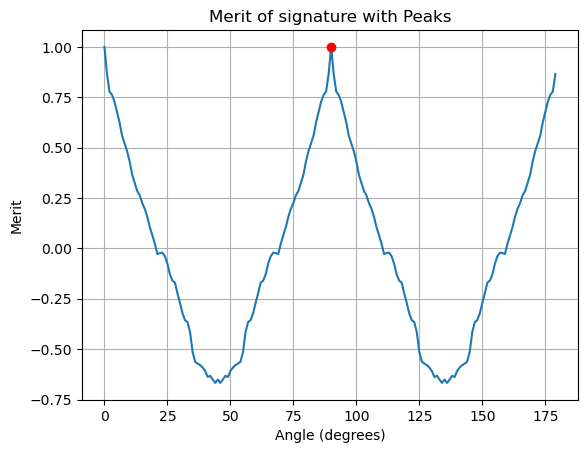

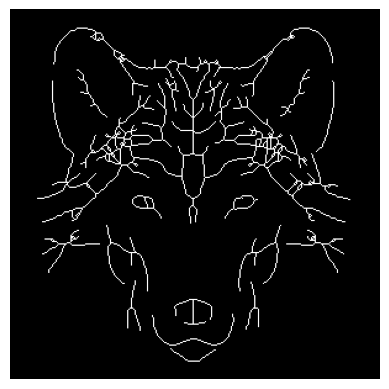

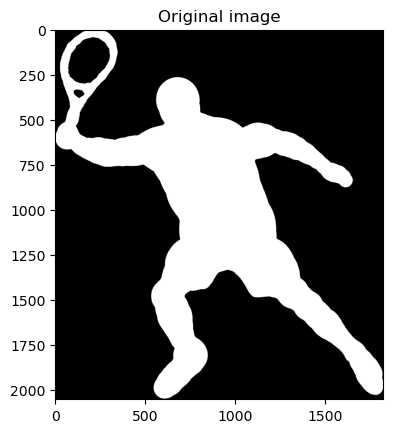

- Image


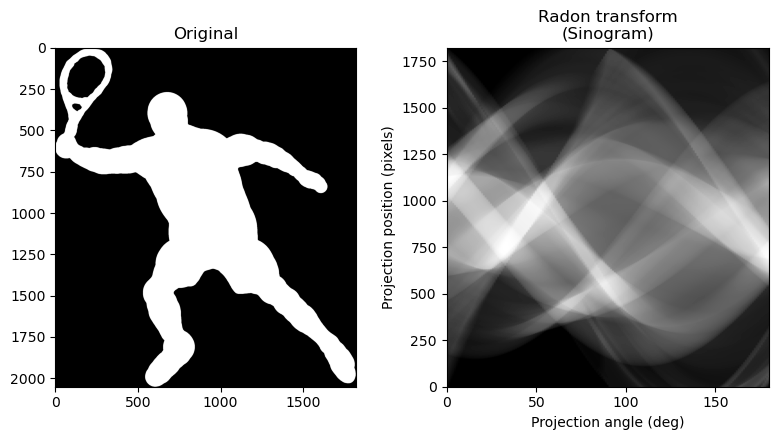

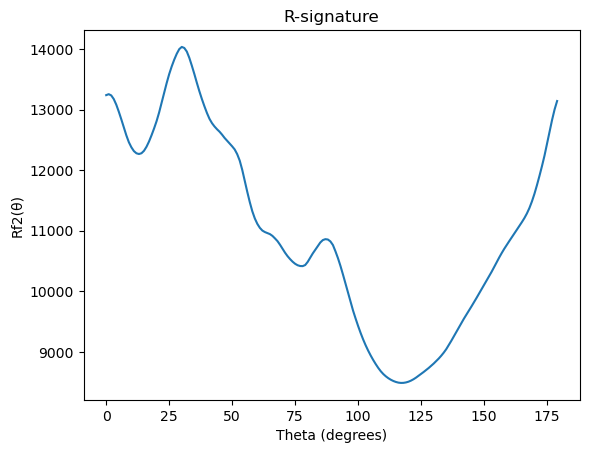

peaks=array([90])


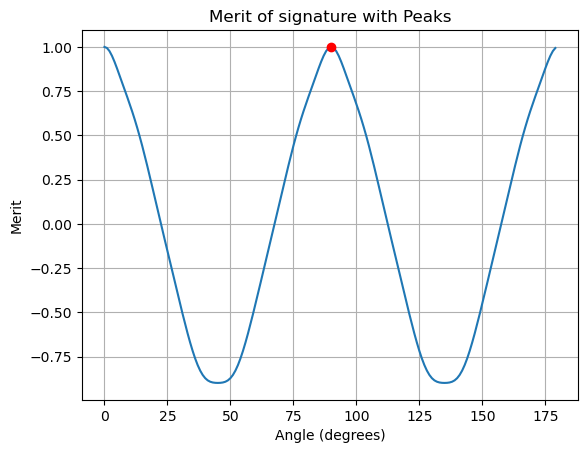

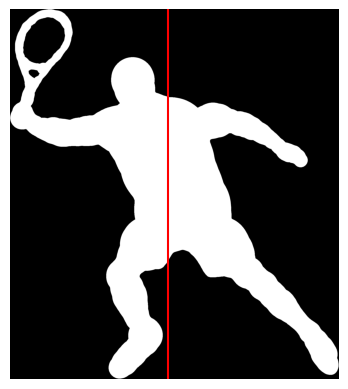

- Skeleton


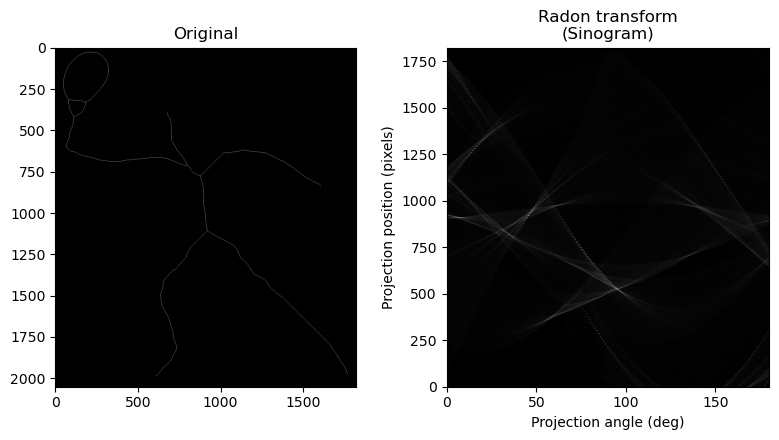

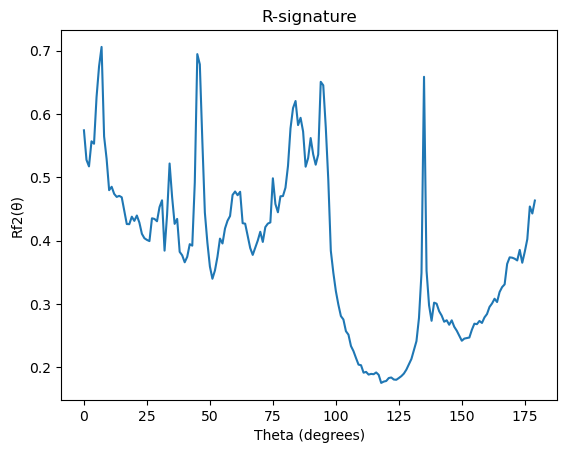

peaks=array([90])


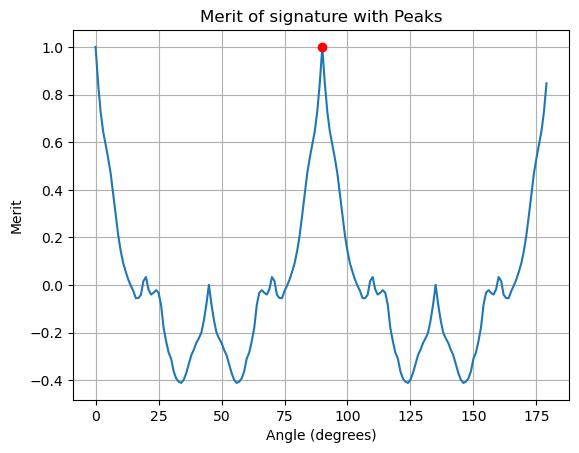

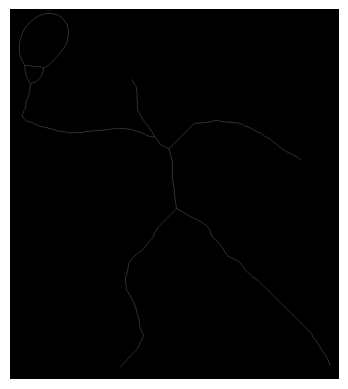

In [240]:
import pandas as pd

tau = 0.4 # Threshold

metrics_images_sift = pd.DataFrame()
metrics_skeletons_sift = pd.DataFrame()

# Execution on original images
for image, skeleton in zip(images,skeletons):
    plt.imshow(image, cmap=plt.cm.gray)
    plt.title("Original image")
    plt.show()

    print("- Image")
    mirror = SignatureSymmetry(image, tau)
    mirror.run(method=False)

    print("- Skeleton")
    mirror = SignatureSymmetry(skeleton, tau)
    mirror.run(method=False)

### 5.3. Metrics computation (TODO)

When assessing the quality of a reflection line for binary images, it is important to consider various aspects that determine its effectiveness in capturing the desired features and preserving essential information. In this section we define some:

- **Jaccard similarity**: Jaccard similarity quantifies the amount of data lost or altered when generating the reflected image, ensuring that the reflected image accurately represents the original. This method calculates the intersection and union of the binary images (original and reflected from the reflection line) to compute the Jaccard similarity.

#### 5.3.1 Using signature implementation

In [243]:
# Define a function to compute metrics for a single image
def compute_metrics(image, method=True, tau=0.5):
    signature = SignatureSymmetry(image,tau)
    signature.run(method=method,visualize=False)
    
    # Compute metrics
    jaccard_similarity = signature.jaccard_similarity()
    
    return {
        'jaccard_similarity': jaccard_similarity
    }

#### With LIP-signature

In [244]:
# Compute metrics for each image
results_images_lip = [compute_metrics(image, method=True) for image in images]
results_images_lip = pd.DataFrame(results_images_lip)

print(results_images_lip.describe())

/home/user/miniconda3/envs/cv2/lib/python3.10/site-packages/skimage/transform/radon_transform.py:75: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn('Radon transform: image must be zero outside the '


       jaccard_similarity
count            6.000000
mean             0.471178
std              0.197934
min              0.300976
25%              0.377341
50%              0.421278
75%              0.451548
max              0.859204


In [245]:
# Compute metrics for each skeleton
results_skeletons_lip = [compute_metrics(skeleton, method=True) for skeleton in skeletons]
results_skeletons_lip = pd.DataFrame(results_skeletons_lip)

print(results_skeletons_lip.describe())

/home/user/miniconda3/envs/cv2/lib/python3.10/site-packages/skimage/transform/radon_transform.py:75: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn('Radon transform: image must be zero outside the '


       jaccard_similarity
count            1.000000
mean             0.006809
std                   NaN
min              0.006809
25%              0.006809
50%              0.006809
75%              0.006809
max              0.006809


#### With R-signature

In [246]:
# Compute metrics for each image
results_images_r = [compute_metrics(image, method=False) for image in images]
results_images_r = pd.DataFrame(results_images_r)

print(results_images_r.describe())

/home/user/miniconda3/envs/cv2/lib/python3.10/site-packages/skimage/transform/radon_transform.py:75: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn('Radon transform: image must be zero outside the '


       jaccard_similarity
count            7.000000
mean             0.465761
std              0.181256
min              0.300976
25%              0.387643
50%              0.433257
75%              0.445801
max              0.859204


In [247]:
# Compute metrics for each skeleton
results_skeletons_r = [compute_metrics(skeleton, method=False) for skeleton in skeletons]
results_skeletons_r = pd.DataFrame(results_skeletons_r)

print(results_skeletons_r.describe())

/home/user/miniconda3/envs/cv2/lib/python3.10/site-packages/skimage/transform/radon_transform.py:75: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn('Radon transform: image must be zero outside the '


       jaccard_similarity
count            1.000000
mean             0.006809
std                   NaN
min              0.006809
25%              0.006809
50%              0.006809
75%              0.006809
max              0.006809


### REFERENCES

[1] Van Otterloo PJ. A contour-oriented approach to digital shape analysis. Technische Universiteit Delft; 1988.

[2] Sheynin S, Tuzikov A, Volgin D. Computation of symmetry measures for polygonal shapes. In Book: CAIP '99: Proceedings of the 8th international conference on computer analysis of images and patterns. Berlin, Heidelberg: Springer-Verlag; 1999: 183-190.

[3] Yang X, et al. Symmetry of shapes via self-similarity. In Book: Advances in visual computing. 4th International Symposium, ISVC 2008, Las Vegas, NV, USA, December 1-3, 2008, Proceedings, Part II. Berlin, Heidelberg: Springer-Verlag; 2008: 561-570. DOI: 10.1007/978-3-540-89646-3_55.

[4] Li Z, et al. Robust symmetry detection for 2D shapes based on electrical charge distribution. J Inf Comput Sci 2014; 11(9): 2887-2894. DOI: 10.12733/jics20103838.

[5] Niu D, et al. a novel approach for detecting symmetries in two-dimensional shapes. J Inf Comput Sci 2015; 12(10): 3915-3925. DOI: 10.12733/jics20106437.

[6] Kushnir O, Fedotova S, Seredin O, Karkishchenko A. Reflection symmetry of shapes based on skeleton primitive
chains. In Book: Analysis of Images, Social Networks and
Texts. AIST 2016. Communications in Computer and
Information Science. Cham: Springer, 2016: 293-304.
DOI: 10.1007/978-3-319-52920-2_27.

[7] Mestetskiy L, Zhuravskaya A. Method for assessing the symmetry of objects on digital binary images based on Fourier descriptor. Int Arch Photogramm Remote Sens Spat Inf Sci 2019; XLII-2/W12: 143-148. DOI: 10.5194/isprs-archives-XLII-2-W12-143-2019.

[8] Sun C, Si D. Fast reflectional symmetry detection using orientation histograms. Real-Time Imaging 1999; 5(1): 63-74. DOI: 10.1006/rtim.1998.0135. 

[9] Nguyen TP. Projection based approach for reflection symmetry detection. 2019 IEEE Int Conf on Image Processing (ICIP) 2019: 4235-4239. DOI: 10.1109/ICIP.2019.8803575. 

[10] Nguyen, T. P., Truong, H. P., Nguyen, T. T., & Kim, Y. (2022). Reflection symmetry detection of shapes based on shape signatures. Pattern Recognition, 128, 108667. DOI: 10.1016/j.patcog.2022.108667